In [144]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import warnings
warnings.simplefilter(action="ignore")

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 170)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [145]:
df_ = pd.read_csv("Churn.csv")

In [146]:
df=df_

In [147]:
df.shape

(7043, 21)

In [148]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [149]:
#TotalCharges sayısal bir değişken.

In [150]:
#Part 1 

In [151]:
#Adım 1
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """

    Veri setindeki kategorik, numerik ve kategorik fakat kardinal değişkenlerin isimlerini verir.
    Not: Kategorik değişkenlerin içerisine numerik görünümlü kategorik değişkenler de dahildir.

    Parameters
    ------
        dataframe: dataframe
                Değişken isimleri alınmak istenilen dataframe
        cat_th: int, optional
                numerik fakat kategorik olan değişkenler için sınıf eşik değeri
        car_th: int, optional
                kategorik fakat kardinal değişkenler için sınıf eşik değeri

    Returns
    ------
        cat_cols: list
                Kategorik değişken listesi
        num_cols: list
                Numerik değişken listesi
        cat_but_car: list
                Kategorik görünümlü kardinal değişken listesi

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))


    Notes
    ------
        cat_cols + num_cols + cat_but_car = toplam değişken sayısı
        num_but_cat cat_cols'un içerisinde.

    """
    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]
    cat_cols = [col for col in cat_cols if "Churn" not in col]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]
    num_cols = [col for col in num_cols if "customerId" not in col]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')

    return cat_cols, num_cols, cat_but_car

In [152]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)

Observations: 7043
Variables: 21
cat_cols: 16
num_cols: 2
cat_but_car: 2
num_but_cat: 1


In [153]:
#Adım 2
Emp_cols=['gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn']
for col in Emp_cols:
    df[col]=df[col].replace("",np.nan)
df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')

In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [155]:
#Adım 3
##################################
# KATEGORİK DEĞİŞKENLERİN ANALİZİ
##################################

def cat_summary(dataframe, col_name, plot=False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                        "Ratio": 100 * dataframe[col_name].value_counts() / len(dataframe)}))
    print("##########################################")
    if plot:
        sns.countplot(x=dataframe[col_name], data=dataframe)
        plt.show()

for col in cat_cols:
    cat_summary(df, col)


        gender  Ratio
Male      3555 50.476
Female    3488 49.524
##########################################
     Partner  Ratio
No      3641 51.697
Yes     3402 48.303
##########################################
     Dependents  Ratio
No         4933 70.041
Yes        2110 29.959
##########################################
     PhoneService  Ratio
Yes          6361 90.317
No            682  9.683
##########################################
                  MultipleLines  Ratio
No                         3390 48.133
Yes                        2971 42.184
No phone service            682  9.683
##########################################
             InternetService  Ratio
Fiber optic             3096 43.959
DSL                     2421 34.375
No                      1526 21.667
##########################################
                     OnlineSecurity  Ratio
No                             3498 49.666
Yes                            2019 28.667
No internet service            1526 21.667


count   7043.000
mean      32.371
std       24.559
min        0.000
5%         1.000
10%        2.000
20%        6.000
30%       12.000
40%       20.000
50%       29.000
60%       40.000
70%       50.000
80%       60.000
90%       69.000
95%       72.000
99%       72.000
max       72.000
Name: tenure, dtype: float64


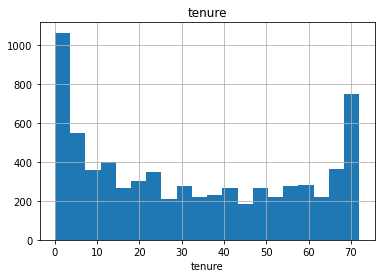

count   7043.000
mean      64.762
std       30.090
min       18.250
5%        19.650
10%       20.050
20%       25.050
30%       45.850
40%       58.830
50%       70.350
60%       79.100
70%       85.500
80%       94.250
90%      102.600
95%      107.400
99%      114.729
max      118.750
Name: MonthlyCharges, dtype: float64


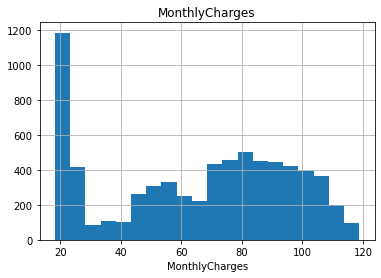

In [156]:
##################################
# NUMERİK DEĞİŞKENLERİN ANALİZİ
##################################

def num_summary(dataframe, numerical_col, plot=False):
    quantiles = [0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 0.95, 0.99]
    print(dataframe[numerical_col].describe(quantiles).T)

    if plot:
        dataframe[numerical_col].hist(bins=20)
        plt.xlabel(numerical_col)
        plt.title(numerical_col)
        plt.show()

for col in num_cols:
    num_summary(df, col, plot=True)

In [157]:
#Adım 4
##################################
# NUMERİK DEĞİŞKENLERİN TARGET GÖRE ANALİZİ
##################################

def target_summary_with_num(dataframe, target, numerical_col):
    print(dataframe.groupby(target).agg({numerical_col: "mean"}), end="\n\n\n")

for col in num_cols:
    target_summary_with_num(df, "Churn", col)

       tenure
Churn        
No     37.570
Yes    17.979


       MonthlyCharges
Churn                
No             61.265
Yes            74.441




In [158]:
##################################
# KATEGORİK DEĞİŞKENLERİN TARGET GÖRE ANALİZİ
##################################
df.loc[df.Churn=='No','Churn'] = 0 
df.loc[df.Churn=='Yes','Churn'] = 1

def target_summary_with_cat(dataframe, target, categorical_col):
    print(categorical_col)
    print(pd.DataFrame({"TARGET_MEAN": dataframe.groupby(categorical_col)[target].mean(),
                        "Count": dataframe[categorical_col].value_counts(),
                        "Ratio": 100 * dataframe[categorical_col].value_counts() / len(dataframe)}), end="\n\n\n")

for col in cat_cols:
    target_summary_with_cat(df, "Churn", col)

gender
        TARGET_MEAN  Count  Ratio
Female        0.269   3488 49.524
Male          0.262   3555 50.476


Partner
     TARGET_MEAN  Count  Ratio
No         0.330   3641 51.697
Yes        0.197   3402 48.303


Dependents
     TARGET_MEAN  Count  Ratio
No         0.313   4933 70.041
Yes        0.155   2110 29.959


PhoneService
     TARGET_MEAN  Count  Ratio
No         0.249    682  9.683
Yes        0.267   6361 90.317


MultipleLines
                  TARGET_MEAN  Count  Ratio
No                      0.250   3390 48.133
No phone service        0.249    682  9.683
Yes                     0.286   2971 42.184


InternetService
             TARGET_MEAN  Count  Ratio
DSL                0.190   2421 34.375
Fiber optic        0.419   3096 43.959
No                 0.074   1526 21.667


OnlineSecurity
                     TARGET_MEAN  Count  Ratio
No                         0.418   3498 49.666
No internet service        0.074   1526 21.667
Yes                        0.146   2019 28.667


O

In [159]:
#Adım 5

def outlier_thresholds(dataframe, col_name, q1=0.05, q3=0.95):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False


for col in num_cols:    
    print(col, check_outlier(df,col))

tenure False
MonthlyCharges False


In [160]:
#Adım 6

In [161]:
df.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

In [162]:
# Part 2

In [163]:
#Adım 1
df["TotalCharges"].fillna(df["TotalCharges"].median(), inplace=True)
#Aykırı değer bulunmamıştı.

In [164]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [165]:
#Adım 2

In [166]:
def tenure(t):
    if t<=12:
        return 1
    elif t>12 and t<=24:
        return 2
    elif t>24 and t<=36:
        return 3
    elif t>36 and t<=48:
        return 4
    elif t>48 and t<=60:
        return 5
    else:
        return 6

df["new_tenure"]=df["tenure"].apply(lambda x: tenure(x))

df.loc[(df["Contract"] == 'Month-to-month'), 'New_Contract'] = 1
df.loc[(df["Contract"] == 'One year'), 'New_Contract'] = 2
df.loc[(df["Contract"] == 'Two year'), 'New_Contract'] = 3

df.loc[(df["PaymentMethod"] == 'Electronic check'), 'New_Payment'] = 1
df.loc[(df["PaymentMethod"] == 'Mailed check'), 'New_Payment'] = 2
df.loc[(df["PaymentMethod"] == 'Bank transfer (automatic)'), 'New_Payment'] = 3
df.loc[(df["PaymentMethod"] == 'Credit card (automatic)'), 'New_Payment'] = 4

df.drop(['MultipleLines', 'PhoneService',"tenure","Contract","PaymentMethod"], axis = 1, inplace = True)
df.drop("InternetService",inplace=True,axis=1)


for col in df.columns:
    df[col]=df[col].replace("No internet service",np.nan)

In [167]:
#Adım 3

In [168]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)

Observations: 7043
Variables: 18
cat_cols: 14
num_cols: 2
cat_but_car: 1
num_but_cat: 4


In [169]:
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

In [170]:
df = one_hot_encoder(df,cat_cols,drop_first=True)

In [171]:
#customerId yi drop edelim.
df = df.iloc[:,1:]

In [172]:
#Adım 4

In [173]:
scaler = StandardScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

In [174]:
df

,MonthlyCharges,TotalCharges,Churn,gender_Male,Partner_Yes,Dependents_Yes,OnlineSecurity_Yes,OnlineBackup_Yes,DeviceProtection_Yes,TechSupport_Yes,StreamingTV_Yes,StreamingMovies_Yes,PaperlessBilling_Yes,SeniorCitizen_1,new_tenure_2,new_tenure_3,new_tenure_4,new_tenure_5,new_tenure_6,New_Contract_2.0,New_Contract_3.0,New_Payment_2.0,New_Payment_3.0,New_Payment_4.0
0,-1.160,-0.994,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,-0.260,-0.173,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0
2,-0.363,-0.960,1,1,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
3,-0.747,-0.195,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0
4,0.197,-0.940,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
5,1.160,-0.645,1,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0
6,0.809,-0.147,0,1,0,1,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1
7,-1.164,-0.874,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
8,1.331,0.337,1,0,1,0,0,0,1,1,1,1,1,0,0,1,0,0,0,0,0,0,0,0
9,-0.286,0.532,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0


In [175]:
#Part 3 

In [176]:
#Adım 1

In [184]:
y = df["Churn"].astype("int")
X = df.drop(["Churn"], axis=1)

In [185]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=17)
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export_text
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, validation_curve
import graphviz
warnings.simplefilter(action='ignore', category=Warning)


In [ ]:
#cart

In [221]:
cart_model = DecisionTreeClassifier(random_state=1).fit(X_train, y_train)

In [222]:
cv_results = cross_validate(cart_model,X,y,cv=10,
                           scoring=["accuracy","f1","roc_auc"])

In [223]:
cv_results["test_accuracy"].mean()

0.7316477272727272

In [224]:
#random forests
from sklearn.ensemble import RandomForestClassifier

In [225]:
rf_model = RandomForestClassifier(random_state=17).fit(X_train,y_train)

In [228]:
cv_results = cross_validate(rf_model,X,y,cv=10,
                           scoring=["accuracy","f1","roc_auc"])

In [229]:
cv_results["test_accuracy"].mean()

0.7870224854932302

In [232]:
#gbm
from sklearn.ensemble import GradientBoostingClassifier

In [235]:
gbm_model = GradientBoostingClassifier(random_state=17).fit(X_train,y_train)

In [237]:
cv_results = cross_validate(gbm_model,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

In [238]:
cv_results["test_accuracy"].mean()

0.8024975822050291

In [240]:
#xgboost
from xgboost import XGBClassifier

In [241]:
xgb_model = XGBClassifier(random_state=17).fit(X_train,y_train)

[22:43:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [242]:
cv_results = cross_validate(xgb_model,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

[22:43:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:43:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:43:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:44:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

In [243]:
cv_results["test_accuracy"].mean()

0.7850350580270794

In [244]:
#Lgbm
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [245]:
lgbm_model = LGBMClassifier(random_state=17).fit(X_train,y_train)

In [246]:
cv_results = cross_validate(lgbm_model,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

In [247]:
cv_results["test_accuracy"].mean()

0.7909969374597035

In [248]:
#CatBoost
cat_model = CatBoostClassifier(random_state=17).fit(X_train,y_train)

Learning rate set to 0.021554
0:	learn: 0.6779792	total: 161ms	remaining: 2m 40s
1:	learn: 0.6635099	total: 167ms	remaining: 1m 23s
2:	learn: 0.6526776	total: 172ms	remaining: 57.3s
3:	learn: 0.6401101	total: 180ms	remaining: 44.9s
4:	learn: 0.6303156	total: 187ms	remaining: 37.2s
5:	learn: 0.6185577	total: 194ms	remaining: 32.2s
6:	learn: 0.6099451	total: 202ms	remaining: 28.6s
7:	learn: 0.6010697	total: 208ms	remaining: 25.8s
8:	learn: 0.5909574	total: 216ms	remaining: 23.8s
9:	learn: 0.5816187	total: 224ms	remaining: 22.1s
10:	learn: 0.5731962	total: 229ms	remaining: 20.6s
11:	learn: 0.5653686	total: 236ms	remaining: 19.4s
12:	learn: 0.5588415	total: 242ms	remaining: 18.4s
13:	learn: 0.5529739	total: 248ms	remaining: 17.5s
14:	learn: 0.5467014	total: 254ms	remaining: 16.7s
15:	learn: 0.5414165	total: 260ms	remaining: 16s
16:	learn: 0.5363579	total: 266ms	remaining: 15.4s
17:	learn: 0.5303221	total: 272ms	remaining: 14.8s
18:	learn: 0.5248609	total: 278ms	remaining: 14.3s
19:	learn: 

163:	learn: 0.3913935	total: 1.48s	remaining: 7.55s
164:	learn: 0.3912573	total: 1.49s	remaining: 7.54s
165:	learn: 0.3911132	total: 1.5s	remaining: 7.53s
166:	learn: 0.3910110	total: 1.51s	remaining: 7.53s
167:	learn: 0.3906682	total: 1.52s	remaining: 7.53s
168:	learn: 0.3905508	total: 1.53s	remaining: 7.53s
169:	learn: 0.3903220	total: 1.54s	remaining: 7.52s
170:	learn: 0.3901390	total: 1.55s	remaining: 7.51s
171:	learn: 0.3900030	total: 1.56s	remaining: 7.5s
172:	learn: 0.3897502	total: 1.56s	remaining: 7.49s
173:	learn: 0.3895415	total: 1.57s	remaining: 7.48s
174:	learn: 0.3893667	total: 1.58s	remaining: 7.47s
175:	learn: 0.3892148	total: 1.59s	remaining: 7.45s
176:	learn: 0.3890755	total: 1.6s	remaining: 7.44s
177:	learn: 0.3889213	total: 1.61s	remaining: 7.42s
178:	learn: 0.3886482	total: 1.62s	remaining: 7.42s
179:	learn: 0.3884528	total: 1.62s	remaining: 7.4s
180:	learn: 0.3883052	total: 1.63s	remaining: 7.38s
181:	learn: 0.3881129	total: 1.64s	remaining: 7.36s
182:	learn: 0.38

329:	learn: 0.3671497	total: 2.78s	remaining: 5.65s
330:	learn: 0.3670370	total: 2.79s	remaining: 5.64s
331:	learn: 0.3669332	total: 2.8s	remaining: 5.63s
332:	learn: 0.3669189	total: 2.8s	remaining: 5.61s
333:	learn: 0.3668255	total: 2.82s	remaining: 5.62s
334:	learn: 0.3666653	total: 2.82s	remaining: 5.6s
335:	learn: 0.3665696	total: 2.83s	remaining: 5.59s
336:	learn: 0.3664537	total: 2.83s	remaining: 5.58s
337:	learn: 0.3663456	total: 2.84s	remaining: 5.56s
338:	learn: 0.3662396	total: 2.85s	remaining: 5.55s
339:	learn: 0.3660134	total: 2.85s	remaining: 5.54s
340:	learn: 0.3658836	total: 2.86s	remaining: 5.53s
341:	learn: 0.3658085	total: 2.86s	remaining: 5.51s
342:	learn: 0.3657003	total: 2.87s	remaining: 5.5s
343:	learn: 0.3657000	total: 2.87s	remaining: 5.48s
344:	learn: 0.3655552	total: 2.88s	remaining: 5.47s
345:	learn: 0.3654507	total: 2.88s	remaining: 5.45s
346:	learn: 0.3653125	total: 2.89s	remaining: 5.44s
347:	learn: 0.3652505	total: 2.9s	remaining: 5.43s
348:	learn: 0.365

500:	learn: 0.3465776	total: 3.86s	remaining: 3.85s
501:	learn: 0.3464984	total: 3.87s	remaining: 3.84s
502:	learn: 0.3463005	total: 3.88s	remaining: 3.83s
503:	learn: 0.3461984	total: 3.88s	remaining: 3.82s
504:	learn: 0.3460716	total: 3.89s	remaining: 3.81s
505:	learn: 0.3460238	total: 3.9s	remaining: 3.81s
506:	learn: 0.3458735	total: 3.9s	remaining: 3.8s
507:	learn: 0.3457411	total: 3.91s	remaining: 3.79s
508:	learn: 0.3456629	total: 3.92s	remaining: 3.78s
509:	learn: 0.3455389	total: 3.92s	remaining: 3.77s
510:	learn: 0.3453860	total: 3.93s	remaining: 3.76s
511:	learn: 0.3452734	total: 3.94s	remaining: 3.75s
512:	learn: 0.3451879	total: 3.94s	remaining: 3.74s
513:	learn: 0.3450823	total: 3.95s	remaining: 3.73s
514:	learn: 0.3450049	total: 3.96s	remaining: 3.73s
515:	learn: 0.3449510	total: 3.96s	remaining: 3.72s
516:	learn: 0.3448726	total: 3.97s	remaining: 3.71s
517:	learn: 0.3448154	total: 3.98s	remaining: 3.7s
518:	learn: 0.3446747	total: 3.98s	remaining: 3.69s
519:	learn: 0.34

681:	learn: 0.3279599	total: 5.12s	remaining: 2.38s
682:	learn: 0.3278329	total: 5.12s	remaining: 2.38s
683:	learn: 0.3277526	total: 5.13s	remaining: 2.37s
684:	learn: 0.3276752	total: 5.14s	remaining: 2.36s
685:	learn: 0.3275861	total: 5.14s	remaining: 2.35s
686:	learn: 0.3275262	total: 5.15s	remaining: 2.35s
687:	learn: 0.3274804	total: 5.16s	remaining: 2.34s
688:	learn: 0.3273502	total: 5.17s	remaining: 2.33s
689:	learn: 0.3271711	total: 5.17s	remaining: 2.33s
690:	learn: 0.3270484	total: 5.18s	remaining: 2.32s
691:	learn: 0.3269717	total: 5.19s	remaining: 2.31s
692:	learn: 0.3268764	total: 5.2s	remaining: 2.3s
693:	learn: 0.3267618	total: 5.2s	remaining: 2.29s
694:	learn: 0.3267092	total: 5.21s	remaining: 2.29s
695:	learn: 0.3266369	total: 5.22s	remaining: 2.28s
696:	learn: 0.3265371	total: 5.22s	remaining: 2.27s
697:	learn: 0.3264643	total: 5.23s	remaining: 2.26s
698:	learn: 0.3263252	total: 5.24s	remaining: 2.25s
699:	learn: 0.3262213	total: 5.25s	remaining: 2.25s
700:	learn: 0.3

849:	learn: 0.3120213	total: 6.18s	remaining: 1.09s
850:	learn: 0.3119196	total: 6.19s	remaining: 1.08s
851:	learn: 0.3118477	total: 6.2s	remaining: 1.08s
852:	learn: 0.3117606	total: 6.21s	remaining: 1.07s
853:	learn: 0.3117024	total: 6.21s	remaining: 1.06s
854:	learn: 0.3115967	total: 6.22s	remaining: 1.05s
855:	learn: 0.3115143	total: 6.22s	remaining: 1.05s
856:	learn: 0.3114690	total: 6.23s	remaining: 1.04s
857:	learn: 0.3113058	total: 6.24s	remaining: 1.03s
858:	learn: 0.3112066	total: 6.24s	remaining: 1.02s
859:	learn: 0.3111178	total: 6.25s	remaining: 1.02s
860:	learn: 0.3110555	total: 6.26s	remaining: 1.01s
861:	learn: 0.3110101	total: 6.26s	remaining: 1s
862:	learn: 0.3109264	total: 6.27s	remaining: 995ms
863:	learn: 0.3108101	total: 6.27s	remaining: 988ms
864:	learn: 0.3107308	total: 6.28s	remaining: 980ms
865:	learn: 0.3106449	total: 6.29s	remaining: 973ms
866:	learn: 0.3105521	total: 6.29s	remaining: 965ms
867:	learn: 0.3104719	total: 6.3s	remaining: 958ms
868:	learn: 0.310

In [249]:
cv_results = cross_validate(cat_model,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

Learning rate set to 0.022666
0:	learn: 0.6778345	total: 6.76ms	remaining: 6.75s
1:	learn: 0.6631464	total: 14.9ms	remaining: 7.42s
2:	learn: 0.6502242	total: 21.9ms	remaining: 7.28s
3:	learn: 0.6369162	total: 29.4ms	remaining: 7.32s
4:	learn: 0.6253961	total: 36.7ms	remaining: 7.3s
5:	learn: 0.6134444	total: 44.1ms	remaining: 7.3s
6:	learn: 0.6043597	total: 51.7ms	remaining: 7.33s
7:	learn: 0.5960418	total: 59.8ms	remaining: 7.41s
8:	learn: 0.5859707	total: 67.1ms	remaining: 7.39s
9:	learn: 0.5764027	total: 75.8ms	remaining: 7.51s
10:	learn: 0.5676073	total: 83.1ms	remaining: 7.47s
11:	learn: 0.5595865	total: 90.9ms	remaining: 7.49s
12:	learn: 0.5539865	total: 98.2ms	remaining: 7.46s
13:	learn: 0.5474713	total: 106ms	remaining: 7.45s
14:	learn: 0.5412784	total: 113ms	remaining: 7.44s
15:	learn: 0.5360497	total: 121ms	remaining: 7.46s
16:	learn: 0.5309703	total: 129ms	remaining: 7.43s
17:	learn: 0.5255884	total: 136ms	remaining: 7.41s
18:	learn: 0.5203529	total: 143ms	remaining: 7.37s


172:	learn: 0.3931986	total: 1.27s	remaining: 6.09s
173:	learn: 0.3929876	total: 1.28s	remaining: 6.08s
174:	learn: 0.3928041	total: 1.29s	remaining: 6.07s
175:	learn: 0.3926434	total: 1.3s	remaining: 6.07s
176:	learn: 0.3925385	total: 1.3s	remaining: 6.06s
177:	learn: 0.3924395	total: 1.31s	remaining: 6.06s
178:	learn: 0.3923004	total: 1.32s	remaining: 6.06s
179:	learn: 0.3921981	total: 1.33s	remaining: 6.06s
180:	learn: 0.3920577	total: 1.34s	remaining: 6.08s
181:	learn: 0.3918460	total: 1.35s	remaining: 6.08s
182:	learn: 0.3916950	total: 1.36s	remaining: 6.07s
183:	learn: 0.3914214	total: 1.37s	remaining: 6.08s
184:	learn: 0.3912617	total: 1.39s	remaining: 6.11s
185:	learn: 0.3911034	total: 1.4s	remaining: 6.13s
186:	learn: 0.3910249	total: 1.41s	remaining: 6.13s
187:	learn: 0.3908796	total: 1.43s	remaining: 6.16s
188:	learn: 0.3907584	total: 1.45s	remaining: 6.21s
189:	learn: 0.3905503	total: 1.46s	remaining: 6.21s
190:	learn: 0.3904178	total: 1.46s	remaining: 6.2s
191:	learn: 0.39

346:	learn: 0.3701313	total: 2.75s	remaining: 5.17s
347:	learn: 0.3700154	total: 2.75s	remaining: 5.16s
348:	learn: 0.3698313	total: 2.76s	remaining: 5.15s
349:	learn: 0.3697813	total: 2.77s	remaining: 5.13s
350:	learn: 0.3697113	total: 2.77s	remaining: 5.12s
351:	learn: 0.3695889	total: 2.78s	remaining: 5.11s
352:	learn: 0.3693907	total: 2.78s	remaining: 5.1s
353:	learn: 0.3692552	total: 2.79s	remaining: 5.09s
354:	learn: 0.3690925	total: 2.8s	remaining: 5.08s
355:	learn: 0.3689848	total: 2.8s	remaining: 5.07s
356:	learn: 0.3688287	total: 2.81s	remaining: 5.07s
357:	learn: 0.3686944	total: 2.82s	remaining: 5.06s
358:	learn: 0.3686451	total: 2.83s	remaining: 5.05s
359:	learn: 0.3685067	total: 2.84s	remaining: 5.04s
360:	learn: 0.3684461	total: 2.84s	remaining: 5.03s
361:	learn: 0.3683629	total: 2.85s	remaining: 5.03s
362:	learn: 0.3682412	total: 2.86s	remaining: 5.02s
363:	learn: 0.3681428	total: 2.87s	remaining: 5.01s
364:	learn: 0.3680217	total: 2.87s	remaining: 5s
365:	learn: 0.3678

529:	learn: 0.3495569	total: 4.02s	remaining: 3.56s
530:	learn: 0.3494307	total: 4.04s	remaining: 3.56s
531:	learn: 0.3493635	total: 4.04s	remaining: 3.56s
532:	learn: 0.3492811	total: 4.05s	remaining: 3.55s
533:	learn: 0.3491145	total: 4.06s	remaining: 3.54s
534:	learn: 0.3489632	total: 4.06s	remaining: 3.53s
535:	learn: 0.3488356	total: 4.07s	remaining: 3.52s
536:	learn: 0.3487620	total: 4.07s	remaining: 3.51s
537:	learn: 0.3486589	total: 4.08s	remaining: 3.5s
538:	learn: 0.3485708	total: 4.09s	remaining: 3.5s
539:	learn: 0.3484951	total: 4.09s	remaining: 3.49s
540:	learn: 0.3484500	total: 4.1s	remaining: 3.48s
541:	learn: 0.3483219	total: 4.11s	remaining: 3.47s
542:	learn: 0.3482336	total: 4.12s	remaining: 3.46s
543:	learn: 0.3481867	total: 4.12s	remaining: 3.46s
544:	learn: 0.3480842	total: 4.13s	remaining: 3.45s
545:	learn: 0.3479272	total: 4.14s	remaining: 3.44s
546:	learn: 0.3478635	total: 4.14s	remaining: 3.43s
547:	learn: 0.3477897	total: 4.15s	remaining: 3.42s
548:	learn: 0.3

710:	learn: 0.3325933	total: 5.27s	remaining: 2.14s
711:	learn: 0.3325514	total: 5.28s	remaining: 2.13s
712:	learn: 0.3325153	total: 5.29s	remaining: 2.13s
713:	learn: 0.3324022	total: 5.29s	remaining: 2.12s
714:	learn: 0.3323144	total: 5.3s	remaining: 2.11s
715:	learn: 0.3322145	total: 5.31s	remaining: 2.11s
716:	learn: 0.3321645	total: 5.32s	remaining: 2.1s
717:	learn: 0.3320443	total: 5.32s	remaining: 2.09s
718:	learn: 0.3319436	total: 5.33s	remaining: 2.08s
719:	learn: 0.3318470	total: 5.33s	remaining: 2.08s
720:	learn: 0.3317400	total: 5.34s	remaining: 2.07s
721:	learn: 0.3316170	total: 5.35s	remaining: 2.06s
722:	learn: 0.3315449	total: 5.36s	remaining: 2.05s
723:	learn: 0.3314576	total: 5.36s	remaining: 2.04s
724:	learn: 0.3314114	total: 5.37s	remaining: 2.04s
725:	learn: 0.3313260	total: 5.38s	remaining: 2.03s
726:	learn: 0.3312816	total: 5.38s	remaining: 2.02s
727:	learn: 0.3311516	total: 5.39s	remaining: 2.01s
728:	learn: 0.3310235	total: 5.4s	remaining: 2.01s
729:	learn: 0.3

876:	learn: 0.3174089	total: 6.37s	remaining: 893ms
877:	learn: 0.3173672	total: 6.37s	remaining: 886ms
878:	learn: 0.3172726	total: 6.38s	remaining: 878ms
879:	learn: 0.3172066	total: 6.39s	remaining: 871ms
880:	learn: 0.3171511	total: 6.39s	remaining: 864ms
881:	learn: 0.3171006	total: 6.4s	remaining: 857ms
882:	learn: 0.3170340	total: 6.41s	remaining: 849ms
883:	learn: 0.3169470	total: 6.42s	remaining: 842ms
884:	learn: 0.3168558	total: 6.42s	remaining: 835ms
885:	learn: 0.3167837	total: 6.43s	remaining: 827ms
886:	learn: 0.3167166	total: 6.43s	remaining: 820ms
887:	learn: 0.3166514	total: 6.44s	remaining: 812ms
888:	learn: 0.3166034	total: 6.45s	remaining: 805ms
889:	learn: 0.3165488	total: 6.45s	remaining: 798ms
890:	learn: 0.3163869	total: 6.46s	remaining: 790ms
891:	learn: 0.3163109	total: 6.47s	remaining: 783ms
892:	learn: 0.3162121	total: 6.47s	remaining: 776ms
893:	learn: 0.3160655	total: 6.48s	remaining: 768ms
894:	learn: 0.3159935	total: 6.49s	remaining: 761ms
895:	learn: 0

53:	learn: 0.4412742	total: 370ms	remaining: 6.49s
54:	learn: 0.4403469	total: 378ms	remaining: 6.49s
55:	learn: 0.4391541	total: 385ms	remaining: 6.5s
56:	learn: 0.4384244	total: 392ms	remaining: 6.49s
57:	learn: 0.4374603	total: 400ms	remaining: 6.49s
58:	learn: 0.4365151	total: 407ms	remaining: 6.49s
59:	learn: 0.4356475	total: 414ms	remaining: 6.49s
60:	learn: 0.4349016	total: 422ms	remaining: 6.5s
61:	learn: 0.4341634	total: 431ms	remaining: 6.51s
62:	learn: 0.4335210	total: 438ms	remaining: 6.51s
63:	learn: 0.4327479	total: 445ms	remaining: 6.5s
64:	learn: 0.4320649	total: 451ms	remaining: 6.49s
65:	learn: 0.4312964	total: 457ms	remaining: 6.47s
66:	learn: 0.4305058	total: 464ms	remaining: 6.46s
67:	learn: 0.4297417	total: 471ms	remaining: 6.45s
68:	learn: 0.4290107	total: 477ms	remaining: 6.43s
69:	learn: 0.4283135	total: 483ms	remaining: 6.42s
70:	learn: 0.4276053	total: 489ms	remaining: 6.4s
71:	learn: 0.4269068	total: 496ms	remaining: 6.39s
72:	learn: 0.4264105	total: 502ms	r

212:	learn: 0.3899469	total: 1.48s	remaining: 5.46s
213:	learn: 0.3897583	total: 1.48s	remaining: 5.45s
214:	learn: 0.3896305	total: 1.49s	remaining: 5.44s
215:	learn: 0.3895025	total: 1.5s	remaining: 5.44s
216:	learn: 0.3893623	total: 1.5s	remaining: 5.43s
217:	learn: 0.3892137	total: 1.51s	remaining: 5.43s
218:	learn: 0.3892122	total: 1.52s	remaining: 5.41s
219:	learn: 0.3890651	total: 1.52s	remaining: 5.41s
220:	learn: 0.3888494	total: 1.53s	remaining: 5.41s
221:	learn: 0.3887075	total: 1.54s	remaining: 5.41s
222:	learn: 0.3885647	total: 1.55s	remaining: 5.4s
223:	learn: 0.3884228	total: 1.56s	remaining: 5.39s
224:	learn: 0.3882647	total: 1.56s	remaining: 5.38s
225:	learn: 0.3881659	total: 1.57s	remaining: 5.37s
226:	learn: 0.3880913	total: 1.57s	remaining: 5.37s
227:	learn: 0.3879342	total: 1.58s	remaining: 5.36s
228:	learn: 0.3878095	total: 1.59s	remaining: 5.35s
229:	learn: 0.3877081	total: 1.59s	remaining: 5.34s
230:	learn: 0.3876099	total: 1.6s	remaining: 5.33s
231:	learn: 0.38

372:	learn: 0.3705060	total: 2.55s	remaining: 4.28s
373:	learn: 0.3704243	total: 2.56s	remaining: 4.28s
374:	learn: 0.3703030	total: 2.56s	remaining: 4.27s
375:	learn: 0.3701786	total: 2.57s	remaining: 4.26s
376:	learn: 0.3700641	total: 2.58s	remaining: 4.26s
377:	learn: 0.3699145	total: 2.58s	remaining: 4.25s
378:	learn: 0.3698271	total: 2.59s	remaining: 4.24s
379:	learn: 0.3696871	total: 2.6s	remaining: 4.23s
380:	learn: 0.3695992	total: 2.61s	remaining: 4.24s
381:	learn: 0.3694954	total: 2.62s	remaining: 4.23s
382:	learn: 0.3693937	total: 2.63s	remaining: 4.23s
383:	learn: 0.3693085	total: 2.64s	remaining: 4.23s
384:	learn: 0.3692252	total: 2.66s	remaining: 4.24s
385:	learn: 0.3690707	total: 2.67s	remaining: 4.25s
386:	learn: 0.3690068	total: 2.68s	remaining: 4.25s
387:	learn: 0.3689162	total: 2.69s	remaining: 4.24s
388:	learn: 0.3687725	total: 2.69s	remaining: 4.23s
389:	learn: 0.3686631	total: 2.7s	remaining: 4.22s
390:	learn: 0.3685464	total: 2.71s	remaining: 4.22s
391:	learn: 0.

553:	learn: 0.3503176	total: 3.77s	remaining: 3.04s
554:	learn: 0.3502156	total: 3.78s	remaining: 3.03s
555:	learn: 0.3500423	total: 3.79s	remaining: 3.03s
556:	learn: 0.3499061	total: 3.8s	remaining: 3.02s
557:	learn: 0.3498543	total: 3.81s	remaining: 3.01s
558:	learn: 0.3497481	total: 3.81s	remaining: 3.01s
559:	learn: 0.3496369	total: 3.82s	remaining: 3s
560:	learn: 0.3495642	total: 3.83s	remaining: 2.99s
561:	learn: 0.3494565	total: 3.83s	remaining: 2.99s
562:	learn: 0.3493666	total: 3.84s	remaining: 2.98s
563:	learn: 0.3492610	total: 3.84s	remaining: 2.97s
564:	learn: 0.3491547	total: 3.85s	remaining: 2.96s
565:	learn: 0.3490531	total: 3.86s	remaining: 2.96s
566:	learn: 0.3489387	total: 3.86s	remaining: 2.95s
567:	learn: 0.3488033	total: 3.87s	remaining: 2.94s
568:	learn: 0.3487263	total: 3.87s	remaining: 2.94s
569:	learn: 0.3486116	total: 3.88s	remaining: 2.93s
570:	learn: 0.3485114	total: 3.89s	remaining: 2.92s
571:	learn: 0.3484606	total: 3.89s	remaining: 2.91s
572:	learn: 0.34

734:	learn: 0.3337472	total: 5.02s	remaining: 1.81s
735:	learn: 0.3336438	total: 5.03s	remaining: 1.8s
736:	learn: 0.3335929	total: 5.04s	remaining: 1.8s
737:	learn: 0.3335474	total: 5.04s	remaining: 1.79s
738:	learn: 0.3334782	total: 5.05s	remaining: 1.78s
739:	learn: 0.3333790	total: 5.06s	remaining: 1.78s
740:	learn: 0.3333089	total: 5.06s	remaining: 1.77s
741:	learn: 0.3332118	total: 5.07s	remaining: 1.76s
742:	learn: 0.3331500	total: 5.08s	remaining: 1.76s
743:	learn: 0.3330447	total: 5.08s	remaining: 1.75s
744:	learn: 0.3329304	total: 5.09s	remaining: 1.74s
745:	learn: 0.3328153	total: 5.1s	remaining: 1.74s
746:	learn: 0.3327333	total: 5.1s	remaining: 1.73s
747:	learn: 0.3326620	total: 5.11s	remaining: 1.72s
748:	learn: 0.3325636	total: 5.11s	remaining: 1.71s
749:	learn: 0.3324918	total: 5.12s	remaining: 1.71s
750:	learn: 0.3323798	total: 5.13s	remaining: 1.7s
751:	learn: 0.3322697	total: 5.13s	remaining: 1.69s
752:	learn: 0.3321794	total: 5.14s	remaining: 1.69s
753:	learn: 0.332

893:	learn: 0.3206404	total: 6.09s	remaining: 722ms
894:	learn: 0.3205730	total: 6.1s	remaining: 716ms
895:	learn: 0.3204491	total: 6.11s	remaining: 709ms
896:	learn: 0.3203654	total: 6.12s	remaining: 702ms
897:	learn: 0.3202679	total: 6.12s	remaining: 695ms
898:	learn: 0.3201579	total: 6.13s	remaining: 689ms
899:	learn: 0.3200647	total: 6.13s	remaining: 682ms
900:	learn: 0.3200033	total: 6.14s	remaining: 675ms
901:	learn: 0.3199150	total: 6.15s	remaining: 668ms
902:	learn: 0.3198208	total: 6.15s	remaining: 661ms
903:	learn: 0.3197142	total: 6.16s	remaining: 654ms
904:	learn: 0.3196396	total: 6.17s	remaining: 647ms
905:	learn: 0.3195672	total: 6.17s	remaining: 641ms
906:	learn: 0.3194299	total: 6.18s	remaining: 634ms
907:	learn: 0.3193443	total: 6.19s	remaining: 627ms
908:	learn: 0.3192707	total: 6.19s	remaining: 620ms
909:	learn: 0.3191754	total: 6.2s	remaining: 613ms
910:	learn: 0.3190458	total: 6.2s	remaining: 606ms
911:	learn: 0.3189769	total: 6.21s	remaining: 599ms
912:	learn: 0.3

55:	learn: 0.4363016	total: 362ms	remaining: 6.1s
56:	learn: 0.4353386	total: 369ms	remaining: 6.11s
57:	learn: 0.4345834	total: 377ms	remaining: 6.12s
58:	learn: 0.4336542	total: 384ms	remaining: 6.12s
59:	learn: 0.4326938	total: 391ms	remaining: 6.12s
60:	learn: 0.4316025	total: 397ms	remaining: 6.12s
61:	learn: 0.4308057	total: 404ms	remaining: 6.11s
62:	learn: 0.4299180	total: 410ms	remaining: 6.09s
63:	learn: 0.4290200	total: 416ms	remaining: 6.09s
64:	learn: 0.4283303	total: 423ms	remaining: 6.08s
65:	learn: 0.4276270	total: 429ms	remaining: 6.07s
66:	learn: 0.4268473	total: 435ms	remaining: 6.06s
67:	learn: 0.4262146	total: 441ms	remaining: 6.05s
68:	learn: 0.4255155	total: 448ms	remaining: 6.04s
69:	learn: 0.4248644	total: 454ms	remaining: 6.04s
70:	learn: 0.4240305	total: 460ms	remaining: 6.02s
71:	learn: 0.4234006	total: 466ms	remaining: 6.01s
72:	learn: 0.4227572	total: 472ms	remaining: 6s
73:	learn: 0.4221812	total: 479ms	remaining: 5.99s
74:	learn: 0.4215029	total: 485ms	r

241:	learn: 0.3819947	total: 1.61s	remaining: 5.04s
242:	learn: 0.3818867	total: 1.62s	remaining: 5.04s
243:	learn: 0.3816637	total: 1.62s	remaining: 5.03s
244:	learn: 0.3815577	total: 1.63s	remaining: 5.03s
245:	learn: 0.3812996	total: 1.64s	remaining: 5.02s
246:	learn: 0.3812011	total: 1.65s	remaining: 5.02s
247:	learn: 0.3810601	total: 1.65s	remaining: 5.01s
248:	learn: 0.3809154	total: 1.66s	remaining: 5s
249:	learn: 0.3808094	total: 1.66s	remaining: 4.99s
250:	learn: 0.3807021	total: 1.67s	remaining: 4.98s
251:	learn: 0.3805000	total: 1.68s	remaining: 4.98s
252:	learn: 0.3802724	total: 1.68s	remaining: 4.97s
253:	learn: 0.3801485	total: 1.69s	remaining: 4.96s
254:	learn: 0.3799630	total: 1.69s	remaining: 4.95s
255:	learn: 0.3798313	total: 1.7s	remaining: 4.94s
256:	learn: 0.3796779	total: 1.71s	remaining: 4.93s
257:	learn: 0.3795589	total: 1.71s	remaining: 4.93s
258:	learn: 0.3794859	total: 1.72s	remaining: 4.92s
259:	learn: 0.3793795	total: 1.73s	remaining: 4.91s
260:	learn: 0.37

408:	learn: 0.3610562	total: 2.69s	remaining: 3.89s
409:	learn: 0.3609514	total: 2.7s	remaining: 3.88s
410:	learn: 0.3608473	total: 2.71s	remaining: 3.88s
411:	learn: 0.3606867	total: 2.71s	remaining: 3.87s
412:	learn: 0.3605319	total: 2.72s	remaining: 3.87s
413:	learn: 0.3603992	total: 2.73s	remaining: 3.86s
414:	learn: 0.3602565	total: 2.73s	remaining: 3.85s
415:	learn: 0.3601450	total: 2.74s	remaining: 3.85s
416:	learn: 0.3600181	total: 2.75s	remaining: 3.84s
417:	learn: 0.3599498	total: 2.75s	remaining: 3.83s
418:	learn: 0.3598755	total: 2.76s	remaining: 3.83s
419:	learn: 0.3597583	total: 2.77s	remaining: 3.82s
420:	learn: 0.3596681	total: 2.77s	remaining: 3.81s
421:	learn: 0.3595603	total: 2.78s	remaining: 3.81s
422:	learn: 0.3594195	total: 2.79s	remaining: 3.8s
423:	learn: 0.3593252	total: 2.79s	remaining: 3.79s
424:	learn: 0.3591606	total: 2.8s	remaining: 3.79s
425:	learn: 0.3590282	total: 2.81s	remaining: 3.78s
426:	learn: 0.3589255	total: 2.81s	remaining: 3.77s
427:	learn: 0.3

590:	learn: 0.3413603	total: 3.96s	remaining: 2.74s
591:	learn: 0.3412352	total: 3.97s	remaining: 2.73s
592:	learn: 0.3411800	total: 3.97s	remaining: 2.73s
593:	learn: 0.3411237	total: 3.98s	remaining: 2.72s
594:	learn: 0.3410442	total: 3.99s	remaining: 2.71s
595:	learn: 0.3409051	total: 4s	remaining: 2.71s
596:	learn: 0.3408261	total: 4.01s	remaining: 2.71s
597:	learn: 0.3407081	total: 4.01s	remaining: 2.7s
598:	learn: 0.3405755	total: 4.02s	remaining: 2.69s
599:	learn: 0.3404966	total: 4.03s	remaining: 2.68s
600:	learn: 0.3403750	total: 4.03s	remaining: 2.68s
601:	learn: 0.3403163	total: 4.04s	remaining: 2.67s
602:	learn: 0.3401897	total: 4.04s	remaining: 2.66s
603:	learn: 0.3400695	total: 4.05s	remaining: 2.66s
604:	learn: 0.3399583	total: 4.06s	remaining: 2.65s
605:	learn: 0.3398464	total: 4.06s	remaining: 2.64s
606:	learn: 0.3397337	total: 4.07s	remaining: 2.63s
607:	learn: 0.3396533	total: 4.08s	remaining: 2.63s
608:	learn: 0.3395491	total: 4.08s	remaining: 2.62s
609:	learn: 0.33

755:	learn: 0.3266134	total: 5.03s	remaining: 1.62s
756:	learn: 0.3265127	total: 5.03s	remaining: 1.61s
757:	learn: 0.3264428	total: 5.04s	remaining: 1.61s
758:	learn: 0.3263673	total: 5.05s	remaining: 1.6s
759:	learn: 0.3262586	total: 5.06s	remaining: 1.6s
760:	learn: 0.3261493	total: 5.06s	remaining: 1.59s
761:	learn: 0.3261274	total: 5.07s	remaining: 1.58s
762:	learn: 0.3260403	total: 5.08s	remaining: 1.58s
763:	learn: 0.3259732	total: 5.09s	remaining: 1.57s
764:	learn: 0.3258347	total: 5.09s	remaining: 1.56s
765:	learn: 0.3257598	total: 5.1s	remaining: 1.56s
766:	learn: 0.3256745	total: 5.11s	remaining: 1.55s
767:	learn: 0.3256468	total: 5.11s	remaining: 1.54s
768:	learn: 0.3255760	total: 5.12s	remaining: 1.54s
769:	learn: 0.3254750	total: 5.12s	remaining: 1.53s
770:	learn: 0.3254015	total: 5.13s	remaining: 1.52s
771:	learn: 0.3252739	total: 5.14s	remaining: 1.52s
772:	learn: 0.3252251	total: 5.14s	remaining: 1.51s
773:	learn: 0.3251125	total: 5.15s	remaining: 1.5s
774:	learn: 0.32

923:	learn: 0.3128044	total: 6.13s	remaining: 504ms
924:	learn: 0.3127415	total: 6.14s	remaining: 498ms
925:	learn: 0.3126938	total: 6.14s	remaining: 491ms
926:	learn: 0.3125877	total: 6.15s	remaining: 484ms
927:	learn: 0.3125211	total: 6.16s	remaining: 478ms
928:	learn: 0.3124853	total: 6.16s	remaining: 471ms
929:	learn: 0.3123843	total: 6.17s	remaining: 464ms
930:	learn: 0.3123226	total: 6.18s	remaining: 458ms
931:	learn: 0.3122752	total: 6.18s	remaining: 451ms
932:	learn: 0.3122278	total: 6.19s	remaining: 444ms
933:	learn: 0.3121823	total: 6.2s	remaining: 438ms
934:	learn: 0.3121498	total: 6.2s	remaining: 431ms
935:	learn: 0.3120925	total: 6.21s	remaining: 424ms
936:	learn: 0.3119820	total: 6.21s	remaining: 418ms
937:	learn: 0.3118910	total: 6.22s	remaining: 411ms
938:	learn: 0.3118231	total: 6.23s	remaining: 404ms
939:	learn: 0.3117076	total: 6.23s	remaining: 398ms
940:	learn: 0.3116597	total: 6.24s	remaining: 391ms
941:	learn: 0.3115978	total: 6.24s	remaining: 385ms
942:	learn: 0.

106:	learn: 0.4092320	total: 728ms	remaining: 6.07s
107:	learn: 0.4089357	total: 735ms	remaining: 6.07s
108:	learn: 0.4085426	total: 742ms	remaining: 6.06s
109:	learn: 0.4082627	total: 748ms	remaining: 6.05s
110:	learn: 0.4079788	total: 754ms	remaining: 6.04s
111:	learn: 0.4076817	total: 760ms	remaining: 6.03s
112:	learn: 0.4074422	total: 767ms	remaining: 6.02s
113:	learn: 0.4070845	total: 773ms	remaining: 6.01s
114:	learn: 0.4068126	total: 779ms	remaining: 5.99s
115:	learn: 0.4065041	total: 785ms	remaining: 5.98s
116:	learn: 0.4062431	total: 791ms	remaining: 5.97s
117:	learn: 0.4059930	total: 798ms	remaining: 5.96s
118:	learn: 0.4056998	total: 804ms	remaining: 5.95s
119:	learn: 0.4054549	total: 811ms	remaining: 5.95s
120:	learn: 0.4051223	total: 817ms	remaining: 5.94s
121:	learn: 0.4048249	total: 824ms	remaining: 5.93s
122:	learn: 0.4045885	total: 830ms	remaining: 5.92s
123:	learn: 0.4043308	total: 836ms	remaining: 5.91s
124:	learn: 0.4040655	total: 843ms	remaining: 5.9s
125:	learn: 0

269:	learn: 0.3802976	total: 1.82s	remaining: 4.92s
270:	learn: 0.3801778	total: 1.83s	remaining: 4.92s
271:	learn: 0.3799970	total: 1.83s	remaining: 4.91s
272:	learn: 0.3799098	total: 1.84s	remaining: 4.91s
273:	learn: 0.3797423	total: 1.85s	remaining: 4.9s
274:	learn: 0.3795945	total: 1.86s	remaining: 4.9s
275:	learn: 0.3793556	total: 1.86s	remaining: 4.89s
276:	learn: 0.3791388	total: 1.87s	remaining: 4.88s
277:	learn: 0.3790522	total: 1.88s	remaining: 4.87s
278:	learn: 0.3789920	total: 1.88s	remaining: 4.87s
279:	learn: 0.3788787	total: 1.89s	remaining: 4.86s
280:	learn: 0.3787941	total: 1.9s	remaining: 4.86s
281:	learn: 0.3786473	total: 1.91s	remaining: 4.85s
282:	learn: 0.3785202	total: 1.91s	remaining: 4.85s
283:	learn: 0.3783681	total: 1.92s	remaining: 4.84s
284:	learn: 0.3782333	total: 1.93s	remaining: 4.84s
285:	learn: 0.3781425	total: 1.93s	remaining: 4.83s
286:	learn: 0.3780928	total: 1.94s	remaining: 4.82s
287:	learn: 0.3780506	total: 1.95s	remaining: 4.81s
288:	learn: 0.3

432:	learn: 0.3614820	total: 2.89s	remaining: 3.78s
433:	learn: 0.3614146	total: 2.89s	remaining: 3.77s
434:	learn: 0.3612969	total: 2.9s	remaining: 3.77s
435:	learn: 0.3611484	total: 2.91s	remaining: 3.76s
436:	learn: 0.3610271	total: 2.92s	remaining: 3.75s
437:	learn: 0.3609102	total: 2.92s	remaining: 3.75s
438:	learn: 0.3607867	total: 2.94s	remaining: 3.76s
439:	learn: 0.3606759	total: 2.95s	remaining: 3.75s
440:	learn: 0.3605822	total: 2.96s	remaining: 3.75s
441:	learn: 0.3605311	total: 2.96s	remaining: 3.74s
442:	learn: 0.3604553	total: 2.97s	remaining: 3.73s
443:	learn: 0.3603560	total: 2.97s	remaining: 3.72s
444:	learn: 0.3602821	total: 2.98s	remaining: 3.71s
445:	learn: 0.3601918	total: 2.99s	remaining: 3.71s
446:	learn: 0.3601259	total: 2.99s	remaining: 3.7s
447:	learn: 0.3599591	total: 3s	remaining: 3.69s
448:	learn: 0.3598252	total: 3s	remaining: 3.69s
449:	learn: 0.3597205	total: 3.01s	remaining: 3.68s
450:	learn: 0.3595444	total: 3.02s	remaining: 3.67s
451:	learn: 0.359421

596:	learn: 0.3453221	total: 3.96s	remaining: 2.68s
597:	learn: 0.3451852	total: 3.97s	remaining: 2.67s
598:	learn: 0.3450934	total: 3.98s	remaining: 2.66s
599:	learn: 0.3450005	total: 3.99s	remaining: 2.66s
600:	learn: 0.3449506	total: 3.99s	remaining: 2.65s
601:	learn: 0.3448942	total: 4s	remaining: 2.64s
602:	learn: 0.3448458	total: 4.01s	remaining: 2.64s
603:	learn: 0.3448012	total: 4.01s	remaining: 2.63s
604:	learn: 0.3446337	total: 4.02s	remaining: 2.62s
605:	learn: 0.3445513	total: 4.03s	remaining: 2.62s
606:	learn: 0.3445069	total: 4.03s	remaining: 2.61s
607:	learn: 0.3443924	total: 4.04s	remaining: 2.6s
608:	learn: 0.3442962	total: 4.04s	remaining: 2.6s
609:	learn: 0.3442641	total: 4.05s	remaining: 2.59s
610:	learn: 0.3441665	total: 4.06s	remaining: 2.58s
611:	learn: 0.3440967	total: 4.06s	remaining: 2.58s
612:	learn: 0.3440348	total: 4.07s	remaining: 2.57s
613:	learn: 0.3439283	total: 4.08s	remaining: 2.56s
614:	learn: 0.3438626	total: 4.08s	remaining: 2.56s
615:	learn: 0.343

758:	learn: 0.3308974	total: 5.09s	remaining: 1.62s
759:	learn: 0.3308083	total: 5.1s	remaining: 1.61s
760:	learn: 0.3307753	total: 5.1s	remaining: 1.6s
761:	learn: 0.3307053	total: 5.11s	remaining: 1.6s
762:	learn: 0.3306259	total: 5.12s	remaining: 1.59s
763:	learn: 0.3305651	total: 5.12s	remaining: 1.58s
764:	learn: 0.3304659	total: 5.13s	remaining: 1.57s
765:	learn: 0.3303963	total: 5.14s	remaining: 1.57s
766:	learn: 0.3303333	total: 5.14s	remaining: 1.56s
767:	learn: 0.3302046	total: 5.15s	remaining: 1.55s
768:	learn: 0.3300965	total: 5.16s	remaining: 1.55s
769:	learn: 0.3300296	total: 5.16s	remaining: 1.54s
770:	learn: 0.3298844	total: 5.17s	remaining: 1.53s
771:	learn: 0.3298047	total: 5.17s	remaining: 1.53s
772:	learn: 0.3297207	total: 5.18s	remaining: 1.52s
773:	learn: 0.3296148	total: 5.19s	remaining: 1.51s
774:	learn: 0.3294862	total: 5.19s	remaining: 1.51s
775:	learn: 0.3294581	total: 5.2s	remaining: 1.5s
776:	learn: 0.3293920	total: 5.2s	remaining: 1.49s
777:	learn: 0.32931

925:	learn: 0.3172403	total: 6.17s	remaining: 493ms
926:	learn: 0.3171584	total: 6.18s	remaining: 487ms
927:	learn: 0.3171066	total: 6.19s	remaining: 480ms
928:	learn: 0.3170215	total: 6.2s	remaining: 474ms
929:	learn: 0.3169382	total: 6.2s	remaining: 467ms
930:	learn: 0.3168618	total: 6.21s	remaining: 460ms
931:	learn: 0.3168287	total: 6.21s	remaining: 454ms
932:	learn: 0.3167154	total: 6.22s	remaining: 447ms
933:	learn: 0.3166345	total: 6.23s	remaining: 440ms
934:	learn: 0.3165809	total: 6.23s	remaining: 433ms
935:	learn: 0.3165034	total: 6.24s	remaining: 427ms
936:	learn: 0.3164223	total: 6.25s	remaining: 420ms
937:	learn: 0.3163508	total: 6.25s	remaining: 413ms
938:	learn: 0.3162782	total: 6.26s	remaining: 407ms
939:	learn: 0.3162232	total: 6.27s	remaining: 400ms
940:	learn: 0.3162051	total: 6.27s	remaining: 393ms
941:	learn: 0.3161177	total: 6.28s	remaining: 387ms
942:	learn: 0.3160197	total: 6.28s	remaining: 380ms
943:	learn: 0.3159738	total: 6.29s	remaining: 373ms
944:	learn: 0.

111:	learn: 0.4056436	total: 714ms	remaining: 5.66s
112:	learn: 0.4052729	total: 721ms	remaining: 5.66s
113:	learn: 0.4049940	total: 728ms	remaining: 5.66s
114:	learn: 0.4047267	total: 736ms	remaining: 5.66s
115:	learn: 0.4044435	total: 743ms	remaining: 5.66s
116:	learn: 0.4040776	total: 750ms	remaining: 5.66s
117:	learn: 0.4037599	total: 757ms	remaining: 5.66s
118:	learn: 0.4035085	total: 763ms	remaining: 5.65s
119:	learn: 0.4032205	total: 770ms	remaining: 5.64s
120:	learn: 0.4030020	total: 777ms	remaining: 5.64s
121:	learn: 0.4028307	total: 783ms	remaining: 5.64s
122:	learn: 0.4026058	total: 789ms	remaining: 5.63s
123:	learn: 0.4023685	total: 796ms	remaining: 5.63s
124:	learn: 0.4021217	total: 803ms	remaining: 5.62s
125:	learn: 0.4017068	total: 809ms	remaining: 5.61s
126:	learn: 0.4014351	total: 815ms	remaining: 5.61s
127:	learn: 0.4012520	total: 822ms	remaining: 5.6s
128:	learn: 0.4009832	total: 830ms	remaining: 5.6s
129:	learn: 0.4007231	total: 836ms	remaining: 5.59s
130:	learn: 0.

272:	learn: 0.3769570	total: 1.79s	remaining: 4.78s
273:	learn: 0.3767991	total: 1.8s	remaining: 4.77s
274:	learn: 0.3766273	total: 1.81s	remaining: 4.77s
275:	learn: 0.3764840	total: 1.81s	remaining: 4.76s
276:	learn: 0.3763615	total: 1.82s	remaining: 4.76s
277:	learn: 0.3762825	total: 1.83s	remaining: 4.75s
278:	learn: 0.3762211	total: 1.83s	remaining: 4.74s
279:	learn: 0.3761392	total: 1.84s	remaining: 4.74s
280:	learn: 0.3761306	total: 1.84s	remaining: 4.72s
281:	learn: 0.3760719	total: 1.85s	remaining: 4.71s
282:	learn: 0.3759643	total: 1.86s	remaining: 4.7s
283:	learn: 0.3758824	total: 1.86s	remaining: 4.7s
284:	learn: 0.3757035	total: 1.87s	remaining: 4.69s
285:	learn: 0.3755098	total: 1.88s	remaining: 4.68s
286:	learn: 0.3754281	total: 1.88s	remaining: 4.67s
287:	learn: 0.3752783	total: 1.89s	remaining: 4.67s
288:	learn: 0.3751383	total: 1.89s	remaining: 4.66s
289:	learn: 0.3750180	total: 1.9s	remaining: 4.65s
290:	learn: 0.3749339	total: 1.91s	remaining: 4.64s
291:	learn: 0.37

434:	learn: 0.3578668	total: 2.88s	remaining: 3.74s
435:	learn: 0.3577505	total: 2.89s	remaining: 3.73s
436:	learn: 0.3576661	total: 2.89s	remaining: 3.73s
437:	learn: 0.3575133	total: 2.9s	remaining: 3.72s
438:	learn: 0.3574480	total: 2.91s	remaining: 3.71s
439:	learn: 0.3573213	total: 2.91s	remaining: 3.71s
440:	learn: 0.3572358	total: 2.92s	remaining: 3.7s
441:	learn: 0.3571257	total: 2.93s	remaining: 3.69s
442:	learn: 0.3569939	total: 2.93s	remaining: 3.69s
443:	learn: 0.3568538	total: 2.94s	remaining: 3.68s
444:	learn: 0.3567244	total: 2.94s	remaining: 3.67s
445:	learn: 0.3565666	total: 2.95s	remaining: 3.67s
446:	learn: 0.3564526	total: 2.96s	remaining: 3.66s
447:	learn: 0.3563434	total: 2.96s	remaining: 3.65s
448:	learn: 0.3562162	total: 2.97s	remaining: 3.64s
449:	learn: 0.3560009	total: 2.98s	remaining: 3.64s
450:	learn: 0.3558897	total: 2.98s	remaining: 3.63s
451:	learn: 0.3558177	total: 2.99s	remaining: 3.62s
452:	learn: 0.3556972	total: 2.99s	remaining: 3.61s
453:	learn: 0.

598:	learn: 0.3406552	total: 3.95s	remaining: 2.64s
599:	learn: 0.3405676	total: 3.96s	remaining: 2.64s
600:	learn: 0.3404359	total: 3.96s	remaining: 2.63s
601:	learn: 0.3402684	total: 3.97s	remaining: 2.62s
602:	learn: 0.3401444	total: 3.98s	remaining: 2.62s
603:	learn: 0.3400327	total: 3.98s	remaining: 2.61s
604:	learn: 0.3398933	total: 3.99s	remaining: 2.6s
605:	learn: 0.3398374	total: 3.99s	remaining: 2.6s
606:	learn: 0.3396518	total: 4s	remaining: 2.59s
607:	learn: 0.3395927	total: 4.01s	remaining: 2.58s
608:	learn: 0.3394585	total: 4.01s	remaining: 2.58s
609:	learn: 0.3393613	total: 4.02s	remaining: 2.57s
610:	learn: 0.3392485	total: 4.03s	remaining: 2.56s
611:	learn: 0.3391399	total: 4.03s	remaining: 2.56s
612:	learn: 0.3390558	total: 4.04s	remaining: 2.55s
613:	learn: 0.3389021	total: 4.04s	remaining: 2.54s
614:	learn: 0.3387751	total: 4.05s	remaining: 2.54s
615:	learn: 0.3387170	total: 4.06s	remaining: 2.53s
616:	learn: 0.3386507	total: 4.06s	remaining: 2.52s
617:	learn: 0.338

760:	learn: 0.3257566	total: 5.01s	remaining: 1.57s
761:	learn: 0.3256206	total: 5.02s	remaining: 1.57s
762:	learn: 0.3255753	total: 5.03s	remaining: 1.56s
763:	learn: 0.3255304	total: 5.03s	remaining: 1.55s
764:	learn: 0.3254573	total: 5.04s	remaining: 1.55s
765:	learn: 0.3253497	total: 5.05s	remaining: 1.54s
766:	learn: 0.3252516	total: 5.05s	remaining: 1.53s
767:	learn: 0.3251466	total: 5.06s	remaining: 1.53s
768:	learn: 0.3250690	total: 5.07s	remaining: 1.52s
769:	learn: 0.3249642	total: 5.07s	remaining: 1.51s
770:	learn: 0.3248749	total: 5.08s	remaining: 1.51s
771:	learn: 0.3247859	total: 5.08s	remaining: 1.5s
772:	learn: 0.3247295	total: 5.09s	remaining: 1.49s
773:	learn: 0.3246725	total: 5.09s	remaining: 1.49s
774:	learn: 0.3245731	total: 5.1s	remaining: 1.48s
775:	learn: 0.3244554	total: 5.11s	remaining: 1.47s
776:	learn: 0.3243871	total: 5.11s	remaining: 1.47s
777:	learn: 0.3243172	total: 5.12s	remaining: 1.46s
778:	learn: 0.3242641	total: 5.13s	remaining: 1.45s
779:	learn: 0.

939:	learn: 0.3107716	total: 6.29s	remaining: 402ms
940:	learn: 0.3107237	total: 6.3s	remaining: 395ms
941:	learn: 0.3106524	total: 6.31s	remaining: 388ms
942:	learn: 0.3105854	total: 6.32s	remaining: 382ms
943:	learn: 0.3104951	total: 6.32s	remaining: 375ms
944:	learn: 0.3104158	total: 6.33s	remaining: 368ms
945:	learn: 0.3102807	total: 6.34s	remaining: 362ms
946:	learn: 0.3101726	total: 6.34s	remaining: 355ms
947:	learn: 0.3100246	total: 6.35s	remaining: 348ms
948:	learn: 0.3099457	total: 6.36s	remaining: 342ms
949:	learn: 0.3098218	total: 6.37s	remaining: 335ms
950:	learn: 0.3097617	total: 6.37s	remaining: 328ms
951:	learn: 0.3097227	total: 6.38s	remaining: 322ms
952:	learn: 0.3096147	total: 6.39s	remaining: 315ms
953:	learn: 0.3095591	total: 6.39s	remaining: 308ms
954:	learn: 0.3094712	total: 6.4s	remaining: 302ms
955:	learn: 0.3094091	total: 6.41s	remaining: 295ms
956:	learn: 0.3093407	total: 6.41s	remaining: 288ms
957:	learn: 0.3092924	total: 6.42s	remaining: 282ms
958:	learn: 0.

110:	learn: 0.4023504	total: 901ms	remaining: 7.21s
111:	learn: 0.4020570	total: 910ms	remaining: 7.21s
112:	learn: 0.4016941	total: 917ms	remaining: 7.2s
113:	learn: 0.4014117	total: 926ms	remaining: 7.19s
114:	learn: 0.4011823	total: 934ms	remaining: 7.18s
115:	learn: 0.4009184	total: 942ms	remaining: 7.18s
116:	learn: 0.4006272	total: 949ms	remaining: 7.16s
117:	learn: 0.4005820	total: 954ms	remaining: 7.13s
118:	learn: 0.4002120	total: 960ms	remaining: 7.11s
119:	learn: 0.3999153	total: 968ms	remaining: 7.1s
120:	learn: 0.3996852	total: 975ms	remaining: 7.08s
121:	learn: 0.3994498	total: 982ms	remaining: 7.07s
122:	learn: 0.3991665	total: 989ms	remaining: 7.05s
123:	learn: 0.3989875	total: 996ms	remaining: 7.04s
124:	learn: 0.3986504	total: 1s	remaining: 7.02s
125:	learn: 0.3983584	total: 1.01s	remaining: 7.01s
126:	learn: 0.3981151	total: 1.02s	remaining: 6.99s
127:	learn: 0.3978429	total: 1.02s	remaining: 6.98s
128:	learn: 0.3976195	total: 1.03s	remaining: 6.96s
129:	learn: 0.397

281:	learn: 0.3729406	total: 2.23s	remaining: 5.69s
282:	learn: 0.3727559	total: 2.24s	remaining: 5.68s
283:	learn: 0.3726589	total: 2.25s	remaining: 5.67s
284:	learn: 0.3725095	total: 2.26s	remaining: 5.66s
285:	learn: 0.3724118	total: 2.26s	remaining: 5.65s
286:	learn: 0.3722234	total: 2.27s	remaining: 5.64s
287:	learn: 0.3721621	total: 2.28s	remaining: 5.63s
288:	learn: 0.3720129	total: 2.28s	remaining: 5.62s
289:	learn: 0.3718489	total: 2.29s	remaining: 5.6s
290:	learn: 0.3717150	total: 2.29s	remaining: 5.59s
291:	learn: 0.3715950	total: 2.3s	remaining: 5.58s
292:	learn: 0.3713800	total: 2.31s	remaining: 5.57s
293:	learn: 0.3712992	total: 2.31s	remaining: 5.55s
294:	learn: 0.3711649	total: 2.32s	remaining: 5.54s
295:	learn: 0.3710392	total: 2.33s	remaining: 5.53s
296:	learn: 0.3709616	total: 2.33s	remaining: 5.52s
297:	learn: 0.3709123	total: 2.34s	remaining: 5.51s
298:	learn: 0.3707363	total: 2.34s	remaining: 5.5s
299:	learn: 0.3706537	total: 2.35s	remaining: 5.48s
300:	learn: 0.3

447:	learn: 0.3526339	total: 3.36s	remaining: 4.13s
448:	learn: 0.3525431	total: 3.36s	remaining: 4.13s
449:	learn: 0.3523951	total: 3.37s	remaining: 4.12s
450:	learn: 0.3523009	total: 3.38s	remaining: 4.11s
451:	learn: 0.3522058	total: 3.38s	remaining: 4.1s
452:	learn: 0.3520448	total: 3.39s	remaining: 4.09s
453:	learn: 0.3519554	total: 3.4s	remaining: 4.09s
454:	learn: 0.3518182	total: 3.4s	remaining: 4.08s
455:	learn: 0.3516949	total: 3.41s	remaining: 4.07s
456:	learn: 0.3515558	total: 3.42s	remaining: 4.06s
457:	learn: 0.3515041	total: 3.42s	remaining: 4.05s
458:	learn: 0.3513728	total: 3.43s	remaining: 4.04s
459:	learn: 0.3512417	total: 3.44s	remaining: 4.03s
460:	learn: 0.3511142	total: 3.44s	remaining: 4.02s
461:	learn: 0.3510276	total: 3.45s	remaining: 4.02s
462:	learn: 0.3509531	total: 3.46s	remaining: 4.01s
463:	learn: 0.3508637	total: 3.46s	remaining: 4s
464:	learn: 0.3507763	total: 3.47s	remaining: 3.99s
465:	learn: 0.3506229	total: 3.47s	remaining: 3.98s
466:	learn: 0.3505

613:	learn: 0.3356782	total: 4.43s	remaining: 2.78s
614:	learn: 0.3355163	total: 4.44s	remaining: 2.78s
615:	learn: 0.3354419	total: 4.44s	remaining: 2.77s
616:	learn: 0.3353108	total: 4.45s	remaining: 2.76s
617:	learn: 0.3352146	total: 4.46s	remaining: 2.75s
618:	learn: 0.3351629	total: 4.46s	remaining: 2.75s
619:	learn: 0.3350571	total: 4.47s	remaining: 2.74s
620:	learn: 0.3349782	total: 4.48s	remaining: 2.73s
621:	learn: 0.3348540	total: 4.48s	remaining: 2.72s
622:	learn: 0.3347900	total: 4.49s	remaining: 2.72s
623:	learn: 0.3347043	total: 4.5s	remaining: 2.71s
624:	learn: 0.3345881	total: 4.5s	remaining: 2.7s
625:	learn: 0.3344574	total: 4.51s	remaining: 2.69s
626:	learn: 0.3343408	total: 4.51s	remaining: 2.69s
627:	learn: 0.3342707	total: 4.52s	remaining: 2.68s
628:	learn: 0.3341943	total: 4.53s	remaining: 2.67s
629:	learn: 0.3339458	total: 4.53s	remaining: 2.66s
630:	learn: 0.3338352	total: 4.54s	remaining: 2.65s
631:	learn: 0.3337259	total: 4.55s	remaining: 2.65s
632:	learn: 0.3

781:	learn: 0.3197642	total: 5.51s	remaining: 1.54s
782:	learn: 0.3197116	total: 5.52s	remaining: 1.53s
783:	learn: 0.3195945	total: 5.53s	remaining: 1.52s
784:	learn: 0.3195210	total: 5.54s	remaining: 1.52s
785:	learn: 0.3194023	total: 5.55s	remaining: 1.51s
786:	learn: 0.3192808	total: 5.55s	remaining: 1.5s
787:	learn: 0.3191997	total: 5.56s	remaining: 1.5s
788:	learn: 0.3191279	total: 5.57s	remaining: 1.49s
789:	learn: 0.3190834	total: 5.58s	remaining: 1.48s
790:	learn: 0.3190234	total: 5.58s	remaining: 1.47s
791:	learn: 0.3188810	total: 5.59s	remaining: 1.47s
792:	learn: 0.3188315	total: 5.59s	remaining: 1.46s
793:	learn: 0.3187840	total: 5.6s	remaining: 1.45s
794:	learn: 0.3186438	total: 5.61s	remaining: 1.45s
795:	learn: 0.3185463	total: 5.62s	remaining: 1.44s
796:	learn: 0.3184446	total: 5.62s	remaining: 1.43s
797:	learn: 0.3183397	total: 5.63s	remaining: 1.42s
798:	learn: 0.3182411	total: 5.63s	remaining: 1.42s
799:	learn: 0.3181857	total: 5.64s	remaining: 1.41s
800:	learn: 0.3

947:	learn: 0.3061819	total: 6.81s	remaining: 373ms
948:	learn: 0.3061490	total: 6.82s	remaining: 366ms
949:	learn: 0.3061017	total: 6.82s	remaining: 359ms
950:	learn: 0.3058981	total: 6.83s	remaining: 352ms
951:	learn: 0.3058265	total: 6.84s	remaining: 345ms
952:	learn: 0.3057160	total: 6.85s	remaining: 338ms
953:	learn: 0.3056147	total: 6.86s	remaining: 331ms
954:	learn: 0.3055798	total: 6.87s	remaining: 324ms
955:	learn: 0.3055307	total: 6.88s	remaining: 317ms
956:	learn: 0.3054400	total: 6.89s	remaining: 310ms
957:	learn: 0.3053914	total: 6.9s	remaining: 303ms
958:	learn: 0.3053474	total: 6.91s	remaining: 295ms
959:	learn: 0.3052522	total: 6.92s	remaining: 288ms
960:	learn: 0.3051947	total: 6.92s	remaining: 281ms
961:	learn: 0.3051058	total: 6.93s	remaining: 274ms
962:	learn: 0.3049884	total: 6.94s	remaining: 267ms
963:	learn: 0.3049220	total: 6.95s	remaining: 259ms
964:	learn: 0.3047952	total: 6.95s	remaining: 252ms
965:	learn: 0.3047272	total: 6.96s	remaining: 245ms
966:	learn: 0

114:	learn: 0.4050165	total: 1.13s	remaining: 8.73s
115:	learn: 0.4046121	total: 1.14s	remaining: 8.71s
116:	learn: 0.4044338	total: 1.15s	remaining: 8.69s
117:	learn: 0.4041020	total: 1.16s	remaining: 8.66s
118:	learn: 0.4037492	total: 1.17s	remaining: 8.66s
119:	learn: 0.4036234	total: 1.18s	remaining: 8.63s
120:	learn: 0.4033006	total: 1.18s	remaining: 8.6s
121:	learn: 0.4032097	total: 1.19s	remaining: 8.57s
122:	learn: 0.4029775	total: 1.2s	remaining: 8.54s
123:	learn: 0.4026058	total: 1.21s	remaining: 8.53s
124:	learn: 0.4023814	total: 1.22s	remaining: 8.53s
125:	learn: 0.4020497	total: 1.23s	remaining: 8.51s
126:	learn: 0.4018536	total: 1.24s	remaining: 8.51s
127:	learn: 0.4016408	total: 1.25s	remaining: 8.5s
128:	learn: 0.4014398	total: 1.26s	remaining: 8.5s
129:	learn: 0.4011964	total: 1.27s	remaining: 8.5s
130:	learn: 0.4008986	total: 1.28s	remaining: 8.48s
131:	learn: 0.4005641	total: 1.29s	remaining: 8.47s
132:	learn: 0.4004150	total: 1.29s	remaining: 8.45s
133:	learn: 0.400

292:	learn: 0.3750832	total: 3.03s	remaining: 7.31s
293:	learn: 0.3749527	total: 3.04s	remaining: 7.3s
294:	learn: 0.3747784	total: 3.05s	remaining: 7.29s
295:	learn: 0.3746407	total: 3.06s	remaining: 7.27s
296:	learn: 0.3745493	total: 3.07s	remaining: 7.26s
297:	learn: 0.3743915	total: 3.08s	remaining: 7.25s
298:	learn: 0.3742678	total: 3.08s	remaining: 7.23s
299:	learn: 0.3741747	total: 3.09s	remaining: 7.22s
300:	learn: 0.3740485	total: 3.1s	remaining: 7.21s
301:	learn: 0.3739010	total: 3.12s	remaining: 7.21s
302:	learn: 0.3737532	total: 3.13s	remaining: 7.21s
303:	learn: 0.3736761	total: 3.17s	remaining: 7.25s
304:	learn: 0.3735792	total: 3.18s	remaining: 7.24s
305:	learn: 0.3733239	total: 3.19s	remaining: 7.24s
306:	learn: 0.3732275	total: 3.2s	remaining: 7.22s
307:	learn: 0.3731084	total: 3.22s	remaining: 7.23s
308:	learn: 0.3729111	total: 3.23s	remaining: 7.22s
309:	learn: 0.3727958	total: 3.24s	remaining: 7.21s
310:	learn: 0.3727262	total: 3.27s	remaining: 7.25s
311:	learn: 0.3

462:	learn: 0.3560803	total: 4.69s	remaining: 5.44s
463:	learn: 0.3560094	total: 4.7s	remaining: 5.43s
464:	learn: 0.3558768	total: 4.71s	remaining: 5.42s
465:	learn: 0.3557172	total: 4.71s	remaining: 5.4s
466:	learn: 0.3555728	total: 4.72s	remaining: 5.39s
467:	learn: 0.3554525	total: 4.73s	remaining: 5.38s
468:	learn: 0.3553941	total: 4.74s	remaining: 5.36s
469:	learn: 0.3552769	total: 4.75s	remaining: 5.35s
470:	learn: 0.3550721	total: 4.75s	remaining: 5.34s
471:	learn: 0.3549788	total: 4.76s	remaining: 5.32s
472:	learn: 0.3548912	total: 4.77s	remaining: 5.31s
473:	learn: 0.3548208	total: 4.77s	remaining: 5.3s
474:	learn: 0.3546963	total: 4.78s	remaining: 5.28s
475:	learn: 0.3545967	total: 4.79s	remaining: 5.27s
476:	learn: 0.3544915	total: 4.8s	remaining: 5.26s
477:	learn: 0.3543423	total: 4.8s	remaining: 5.25s
478:	learn: 0.3542541	total: 4.81s	remaining: 5.23s
479:	learn: 0.3541652	total: 4.82s	remaining: 5.22s
480:	learn: 0.3540046	total: 4.83s	remaining: 5.21s
481:	learn: 0.353

621:	learn: 0.3404504	total: 6.02s	remaining: 3.66s
622:	learn: 0.3403386	total: 6.03s	remaining: 3.65s
623:	learn: 0.3402454	total: 6.04s	remaining: 3.64s
624:	learn: 0.3401656	total: 6.04s	remaining: 3.63s
625:	learn: 0.3400765	total: 6.05s	remaining: 3.62s
626:	learn: 0.3399600	total: 6.06s	remaining: 3.6s
627:	learn: 0.3398629	total: 6.06s	remaining: 3.59s
628:	learn: 0.3397650	total: 6.07s	remaining: 3.58s
629:	learn: 0.3396887	total: 6.08s	remaining: 3.57s
630:	learn: 0.3396279	total: 6.08s	remaining: 3.56s
631:	learn: 0.3395837	total: 6.09s	remaining: 3.54s
632:	learn: 0.3395061	total: 6.09s	remaining: 3.53s
633:	learn: 0.3393949	total: 6.1s	remaining: 3.52s
634:	learn: 0.3392314	total: 6.11s	remaining: 3.51s
635:	learn: 0.3391320	total: 6.11s	remaining: 3.5s
636:	learn: 0.3390343	total: 6.12s	remaining: 3.49s
637:	learn: 0.3389820	total: 6.13s	remaining: 3.48s
638:	learn: 0.3388818	total: 6.13s	remaining: 3.46s
639:	learn: 0.3387583	total: 6.14s	remaining: 3.45s
640:	learn: 0.3

785:	learn: 0.3260460	total: 7.12s	remaining: 1.94s
786:	learn: 0.3259350	total: 7.13s	remaining: 1.93s
787:	learn: 0.3258687	total: 7.14s	remaining: 1.92s
788:	learn: 0.3257574	total: 7.15s	remaining: 1.91s
789:	learn: 0.3256574	total: 7.16s	remaining: 1.9s
790:	learn: 0.3255552	total: 7.16s	remaining: 1.89s
791:	learn: 0.3255162	total: 7.17s	remaining: 1.88s
792:	learn: 0.3254319	total: 7.18s	remaining: 1.88s
793:	learn: 0.3253489	total: 7.19s	remaining: 1.87s
794:	learn: 0.3252829	total: 7.2s	remaining: 1.86s
795:	learn: 0.3252384	total: 7.21s	remaining: 1.85s
796:	learn: 0.3251502	total: 7.22s	remaining: 1.84s
797:	learn: 0.3250788	total: 7.23s	remaining: 1.83s
798:	learn: 0.3249831	total: 7.24s	remaining: 1.82s
799:	learn: 0.3248991	total: 7.25s	remaining: 1.81s
800:	learn: 0.3248191	total: 7.25s	remaining: 1.8s
801:	learn: 0.3247523	total: 7.26s	remaining: 1.79s
802:	learn: 0.3246721	total: 7.28s	remaining: 1.78s
803:	learn: 0.3245716	total: 7.28s	remaining: 1.77s
804:	learn: 0.3

951:	learn: 0.3123426	total: 8.24s	remaining: 415ms
952:	learn: 0.3122856	total: 8.25s	remaining: 407ms
953:	learn: 0.3122326	total: 8.26s	remaining: 398ms
954:	learn: 0.3121748	total: 8.26s	remaining: 389ms
955:	learn: 0.3120781	total: 8.27s	remaining: 381ms
956:	learn: 0.3120198	total: 8.28s	remaining: 372ms
957:	learn: 0.3119865	total: 8.29s	remaining: 363ms
958:	learn: 0.3119065	total: 8.29s	remaining: 355ms
959:	learn: 0.3118669	total: 8.3s	remaining: 346ms
960:	learn: 0.3118222	total: 8.31s	remaining: 337ms
961:	learn: 0.3117426	total: 8.32s	remaining: 329ms
962:	learn: 0.3116901	total: 8.32s	remaining: 320ms
963:	learn: 0.3115968	total: 8.33s	remaining: 311ms
964:	learn: 0.3114902	total: 8.34s	remaining: 302ms
965:	learn: 0.3114189	total: 8.34s	remaining: 294ms
966:	learn: 0.3113396	total: 8.35s	remaining: 285ms
967:	learn: 0.3112551	total: 8.36s	remaining: 276ms
968:	learn: 0.3111627	total: 8.36s	remaining: 268ms
969:	learn: 0.3111232	total: 8.37s	remaining: 259ms
970:	learn: 0

114:	learn: 0.4038976	total: 922ms	remaining: 7.1s
115:	learn: 0.4035316	total: 930ms	remaining: 7.08s
116:	learn: 0.4032542	total: 938ms	remaining: 7.08s
117:	learn: 0.4029957	total: 945ms	remaining: 7.07s
118:	learn: 0.4027104	total: 953ms	remaining: 7.06s
119:	learn: 0.4024607	total: 961ms	remaining: 7.05s
120:	learn: 0.4022434	total: 969ms	remaining: 7.04s
121:	learn: 0.4020337	total: 977ms	remaining: 7.03s
122:	learn: 0.4017916	total: 985ms	remaining: 7.02s
123:	learn: 0.4014956	total: 992ms	remaining: 7.01s
124:	learn: 0.4012498	total: 1s	remaining: 7s
125:	learn: 0.4008881	total: 1.01s	remaining: 6.99s
126:	learn: 0.4006975	total: 1.01s	remaining: 6.97s
127:	learn: 0.4004386	total: 1.02s	remaining: 6.96s
128:	learn: 0.4002320	total: 1.03s	remaining: 6.97s
129:	learn: 0.3999344	total: 1.04s	remaining: 6.97s
130:	learn: 0.3996260	total: 1.05s	remaining: 6.97s
131:	learn: 0.3994115	total: 1.06s	remaining: 6.96s
132:	learn: 0.3992378	total: 1.06s	remaining: 6.94s
133:	learn: 0.39895

296:	learn: 0.3739664	total: 2.2s	remaining: 5.21s
297:	learn: 0.3738442	total: 2.21s	remaining: 5.2s
298:	learn: 0.3737306	total: 2.21s	remaining: 5.19s
299:	learn: 0.3736314	total: 2.22s	remaining: 5.18s
300:	learn: 0.3734269	total: 2.23s	remaining: 5.17s
301:	learn: 0.3732808	total: 2.23s	remaining: 5.17s
302:	learn: 0.3731749	total: 2.24s	remaining: 5.16s
303:	learn: 0.3730150	total: 2.25s	remaining: 5.15s
304:	learn: 0.3729364	total: 2.26s	remaining: 5.14s
305:	learn: 0.3728444	total: 2.26s	remaining: 5.13s
306:	learn: 0.3727038	total: 2.27s	remaining: 5.12s
307:	learn: 0.3725709	total: 2.28s	remaining: 5.12s
308:	learn: 0.3723864	total: 2.28s	remaining: 5.11s
309:	learn: 0.3722265	total: 2.29s	remaining: 5.1s
310:	learn: 0.3720547	total: 2.3s	remaining: 5.09s
311:	learn: 0.3719480	total: 2.31s	remaining: 5.08s
312:	learn: 0.3717842	total: 2.31s	remaining: 5.07s
313:	learn: 0.3716070	total: 2.32s	remaining: 5.07s
314:	learn: 0.3714602	total: 2.33s	remaining: 5.06s
315:	learn: 0.37

459:	learn: 0.3539680	total: 3.46s	remaining: 4.07s
460:	learn: 0.3538418	total: 3.47s	remaining: 4.06s
461:	learn: 0.3537736	total: 3.48s	remaining: 4.05s
462:	learn: 0.3536774	total: 3.49s	remaining: 4.04s
463:	learn: 0.3536057	total: 3.5s	remaining: 4.04s
464:	learn: 0.3535356	total: 3.5s	remaining: 4.03s
465:	learn: 0.3534379	total: 3.51s	remaining: 4.03s
466:	learn: 0.3533144	total: 3.52s	remaining: 4.02s
467:	learn: 0.3532295	total: 3.53s	remaining: 4.01s
468:	learn: 0.3531151	total: 3.54s	remaining: 4.01s
469:	learn: 0.3530257	total: 3.55s	remaining: 4s
470:	learn: 0.3528743	total: 3.56s	remaining: 3.99s
471:	learn: 0.3527964	total: 3.56s	remaining: 3.98s
472:	learn: 0.3526735	total: 3.57s	remaining: 3.98s
473:	learn: 0.3525815	total: 3.58s	remaining: 3.97s
474:	learn: 0.3524196	total: 3.58s	remaining: 3.96s
475:	learn: 0.3523108	total: 3.59s	remaining: 3.95s
476:	learn: 0.3522388	total: 3.6s	remaining: 3.95s
477:	learn: 0.3520903	total: 3.61s	remaining: 3.94s
478:	learn: 0.3519

638:	learn: 0.3356256	total: 4.91s	remaining: 2.77s
639:	learn: 0.3355376	total: 4.92s	remaining: 2.77s
640:	learn: 0.3354670	total: 4.92s	remaining: 2.76s
641:	learn: 0.3353810	total: 4.93s	remaining: 2.75s
642:	learn: 0.3352605	total: 4.94s	remaining: 2.74s
643:	learn: 0.3351455	total: 4.95s	remaining: 2.73s
644:	learn: 0.3350619	total: 4.96s	remaining: 2.73s
645:	learn: 0.3349641	total: 4.96s	remaining: 2.72s
646:	learn: 0.3348505	total: 4.98s	remaining: 2.71s
647:	learn: 0.3347808	total: 4.99s	remaining: 2.71s
648:	learn: 0.3346902	total: 5s	remaining: 2.7s
649:	learn: 0.3345257	total: 5.01s	remaining: 2.7s
650:	learn: 0.3344715	total: 5.01s	remaining: 2.69s
651:	learn: 0.3344199	total: 5.03s	remaining: 2.68s
652:	learn: 0.3343459	total: 5.04s	remaining: 2.68s
653:	learn: 0.3341889	total: 5.04s	remaining: 2.67s
654:	learn: 0.3340804	total: 5.05s	remaining: 2.66s
655:	learn: 0.3339634	total: 5.06s	remaining: 2.65s
656:	learn: 0.3338376	total: 5.07s	remaining: 2.65s
657:	learn: 0.333

811:	learn: 0.3203163	total: 6.38s	remaining: 1.48s
812:	learn: 0.3202941	total: 6.39s	remaining: 1.47s
813:	learn: 0.3202212	total: 6.4s	remaining: 1.46s
814:	learn: 0.3201065	total: 6.41s	remaining: 1.45s
815:	learn: 0.3199919	total: 6.42s	remaining: 1.45s
816:	learn: 0.3198997	total: 6.42s	remaining: 1.44s
817:	learn: 0.3198224	total: 6.43s	remaining: 1.43s
818:	learn: 0.3197354	total: 6.44s	remaining: 1.42s
819:	learn: 0.3196407	total: 6.45s	remaining: 1.42s
820:	learn: 0.3195837	total: 6.46s	remaining: 1.41s
821:	learn: 0.3195005	total: 6.47s	remaining: 1.4s
822:	learn: 0.3194416	total: 6.47s	remaining: 1.39s
823:	learn: 0.3193487	total: 6.48s	remaining: 1.38s
824:	learn: 0.3193043	total: 6.49s	remaining: 1.38s
825:	learn: 0.3191942	total: 6.5s	remaining: 1.37s
826:	learn: 0.3191159	total: 6.5s	remaining: 1.36s
827:	learn: 0.3189856	total: 6.51s	remaining: 1.35s
828:	learn: 0.3189405	total: 6.52s	remaining: 1.34s
829:	learn: 0.3188173	total: 6.53s	remaining: 1.34s
830:	learn: 0.31

974:	learn: 0.3079757	total: 7.66s	remaining: 196ms
975:	learn: 0.3079092	total: 7.67s	remaining: 189ms
976:	learn: 0.3078169	total: 7.68s	remaining: 181ms
977:	learn: 0.3077560	total: 7.68s	remaining: 173ms
978:	learn: 0.3076695	total: 7.69s	remaining: 165ms
979:	learn: 0.3075617	total: 7.7s	remaining: 157ms
980:	learn: 0.3074556	total: 7.71s	remaining: 149ms
981:	learn: 0.3073640	total: 7.72s	remaining: 141ms
982:	learn: 0.3072694	total: 7.72s	remaining: 134ms
983:	learn: 0.3071991	total: 7.73s	remaining: 126ms
984:	learn: 0.3071218	total: 7.74s	remaining: 118ms
985:	learn: 0.3070555	total: 7.75s	remaining: 110ms
986:	learn: 0.3070060	total: 7.75s	remaining: 102ms
987:	learn: 0.3069021	total: 7.76s	remaining: 94.3ms
988:	learn: 0.3068125	total: 7.77s	remaining: 86.4ms
989:	learn: 0.3067351	total: 7.77s	remaining: 78.5ms
990:	learn: 0.3066493	total: 7.78s	remaining: 70.7ms
991:	learn: 0.3065661	total: 7.79s	remaining: 62.8ms
992:	learn: 0.3064260	total: 7.79s	remaining: 54.9ms
993:	le

143:	learn: 0.3987898	total: 1.07s	remaining: 6.39s
144:	learn: 0.3985962	total: 1.08s	remaining: 6.38s
145:	learn: 0.3983691	total: 1.09s	remaining: 6.38s
146:	learn: 0.3981730	total: 1.1s	remaining: 6.37s
147:	learn: 0.3980174	total: 1.1s	remaining: 6.36s
148:	learn: 0.3976753	total: 1.11s	remaining: 6.36s
149:	learn: 0.3974722	total: 1.12s	remaining: 6.36s
150:	learn: 0.3973128	total: 1.13s	remaining: 6.35s
151:	learn: 0.3971554	total: 1.14s	remaining: 6.35s
152:	learn: 0.3970010	total: 1.14s	remaining: 6.34s
153:	learn: 0.3968685	total: 1.15s	remaining: 6.32s
154:	learn: 0.3966170	total: 1.16s	remaining: 6.32s
155:	learn: 0.3964987	total: 1.17s	remaining: 6.31s
156:	learn: 0.3962029	total: 1.17s	remaining: 6.3s
157:	learn: 0.3960165	total: 1.18s	remaining: 6.29s
158:	learn: 0.3958816	total: 1.19s	remaining: 6.28s
159:	learn: 0.3956820	total: 1.19s	remaining: 6.26s
160:	learn: 0.3954947	total: 1.2s	remaining: 6.25s
161:	learn: 0.3952535	total: 1.21s	remaining: 6.23s
162:	learn: 0.39

311:	learn: 0.3748416	total: 2.54s	remaining: 5.61s
312:	learn: 0.3747336	total: 2.56s	remaining: 5.61s
313:	learn: 0.3746018	total: 2.57s	remaining: 5.61s
314:	learn: 0.3744415	total: 2.58s	remaining: 5.61s
315:	learn: 0.3743492	total: 2.58s	remaining: 5.6s
316:	learn: 0.3741550	total: 2.59s	remaining: 5.59s
317:	learn: 0.3740587	total: 2.6s	remaining: 5.58s
318:	learn: 0.3739559	total: 2.61s	remaining: 5.57s
319:	learn: 0.3737787	total: 2.61s	remaining: 5.56s
320:	learn: 0.3737072	total: 2.62s	remaining: 5.54s
321:	learn: 0.3735192	total: 2.63s	remaining: 5.54s
322:	learn: 0.3733759	total: 2.64s	remaining: 5.53s
323:	learn: 0.3732845	total: 2.64s	remaining: 5.52s
324:	learn: 0.3731058	total: 2.65s	remaining: 5.5s
325:	learn: 0.3730306	total: 2.66s	remaining: 5.5s
326:	learn: 0.3729121	total: 2.67s	remaining: 5.49s
327:	learn: 0.3727819	total: 2.67s	remaining: 5.48s
328:	learn: 0.3726884	total: 2.68s	remaining: 5.47s
329:	learn: 0.3725894	total: 2.69s	remaining: 5.46s
330:	learn: 0.37

482:	learn: 0.3556054	total: 3.81s	remaining: 4.08s
483:	learn: 0.3554511	total: 3.82s	remaining: 4.07s
484:	learn: 0.3553599	total: 3.83s	remaining: 4.06s
485:	learn: 0.3551698	total: 3.83s	remaining: 4.05s
486:	learn: 0.3550323	total: 3.84s	remaining: 4.05s
487:	learn: 0.3548897	total: 3.85s	remaining: 4.04s
488:	learn: 0.3548036	total: 3.86s	remaining: 4.03s
489:	learn: 0.3547057	total: 3.86s	remaining: 4.02s
490:	learn: 0.3545301	total: 3.87s	remaining: 4.01s
491:	learn: 0.3544796	total: 3.88s	remaining: 4s
492:	learn: 0.3543761	total: 3.88s	remaining: 3.99s
493:	learn: 0.3542307	total: 3.89s	remaining: 3.98s
494:	learn: 0.3540932	total: 3.89s	remaining: 3.97s
495:	learn: 0.3540076	total: 3.9s	remaining: 3.96s
496:	learn: 0.3538647	total: 3.91s	remaining: 3.96s
497:	learn: 0.3537728	total: 3.92s	remaining: 3.96s
498:	learn: 0.3536063	total: 3.93s	remaining: 3.95s
499:	learn: 0.3534253	total: 3.94s	remaining: 3.94s
500:	learn: 0.3533437	total: 3.94s	remaining: 3.93s
501:	learn: 0.35

642:	learn: 0.3391005	total: 5.1s	remaining: 2.83s
643:	learn: 0.3390120	total: 5.11s	remaining: 2.83s
644:	learn: 0.3389601	total: 5.12s	remaining: 2.82s
645:	learn: 0.3388562	total: 5.13s	remaining: 2.81s
646:	learn: 0.3387420	total: 5.13s	remaining: 2.8s
647:	learn: 0.3386754	total: 5.14s	remaining: 2.79s
648:	learn: 0.3385572	total: 5.15s	remaining: 2.79s
649:	learn: 0.3384504	total: 5.16s	remaining: 2.78s
650:	learn: 0.3383666	total: 5.17s	remaining: 2.77s
651:	learn: 0.3383261	total: 5.18s	remaining: 2.76s
652:	learn: 0.3381988	total: 5.19s	remaining: 2.76s
653:	learn: 0.3381521	total: 5.19s	remaining: 2.75s
654:	learn: 0.3380593	total: 5.2s	remaining: 2.74s
655:	learn: 0.3379738	total: 5.21s	remaining: 2.73s
656:	learn: 0.3379120	total: 5.22s	remaining: 2.72s
657:	learn: 0.3378463	total: 5.22s	remaining: 2.71s
658:	learn: 0.3378003	total: 5.23s	remaining: 2.71s
659:	learn: 0.3376489	total: 5.24s	remaining: 2.7s
660:	learn: 0.3375563	total: 5.25s	remaining: 2.69s
661:	learn: 0.33

803:	learn: 0.3253460	total: 6.38s	remaining: 1.56s
804:	learn: 0.3252878	total: 6.4s	remaining: 1.55s
805:	learn: 0.3252304	total: 6.41s	remaining: 1.54s
806:	learn: 0.3250494	total: 6.42s	remaining: 1.53s
807:	learn: 0.3249831	total: 6.43s	remaining: 1.53s
808:	learn: 0.3249037	total: 6.44s	remaining: 1.52s
809:	learn: 0.3248515	total: 6.44s	remaining: 1.51s
810:	learn: 0.3247457	total: 6.45s	remaining: 1.5s
811:	learn: 0.3246786	total: 6.46s	remaining: 1.5s
812:	learn: 0.3246388	total: 6.46s	remaining: 1.49s
813:	learn: 0.3245406	total: 6.47s	remaining: 1.48s
814:	learn: 0.3244707	total: 6.48s	remaining: 1.47s
815:	learn: 0.3244056	total: 6.49s	remaining: 1.46s
816:	learn: 0.3242975	total: 6.5s	remaining: 1.46s
817:	learn: 0.3242301	total: 6.5s	remaining: 1.45s
818:	learn: 0.3241269	total: 6.51s	remaining: 1.44s
819:	learn: 0.3240536	total: 6.51s	remaining: 1.43s
820:	learn: 0.3239748	total: 6.52s	remaining: 1.42s
821:	learn: 0.3239044	total: 6.53s	remaining: 1.41s
822:	learn: 0.323

972:	learn: 0.3116867	total: 7.64s	remaining: 212ms
973:	learn: 0.3116253	total: 7.65s	remaining: 204ms
974:	learn: 0.3115157	total: 7.65s	remaining: 196ms
975:	learn: 0.3114141	total: 7.66s	remaining: 188ms
976:	learn: 0.3113320	total: 7.67s	remaining: 181ms
977:	learn: 0.3112680	total: 7.68s	remaining: 173ms
978:	learn: 0.3111502	total: 7.69s	remaining: 165ms
979:	learn: 0.3110753	total: 7.7s	remaining: 157ms
980:	learn: 0.3108831	total: 7.71s	remaining: 149ms
981:	learn: 0.3108007	total: 7.71s	remaining: 141ms
982:	learn: 0.3106952	total: 7.72s	remaining: 134ms
983:	learn: 0.3105684	total: 7.73s	remaining: 126ms
984:	learn: 0.3104856	total: 7.74s	remaining: 118ms
985:	learn: 0.3104196	total: 7.75s	remaining: 110ms
986:	learn: 0.3103167	total: 7.75s	remaining: 102ms
987:	learn: 0.3102562	total: 7.76s	remaining: 94.3ms
988:	learn: 0.3101959	total: 7.77s	remaining: 86.4ms
989:	learn: 0.3100706	total: 7.77s	remaining: 78.5ms
990:	learn: 0.3099545	total: 7.78s	remaining: 70.7ms
991:	lear

150:	learn: 0.3976240	total: 1.16s	remaining: 6.54s
151:	learn: 0.3975047	total: 1.17s	remaining: 6.53s
152:	learn: 0.3972553	total: 1.18s	remaining: 6.52s
153:	learn: 0.3970697	total: 1.19s	remaining: 6.51s
154:	learn: 0.3968767	total: 1.19s	remaining: 6.5s
155:	learn: 0.3967013	total: 1.2s	remaining: 6.5s
156:	learn: 0.3964529	total: 1.21s	remaining: 6.49s
157:	learn: 0.3963304	total: 1.22s	remaining: 6.49s
158:	learn: 0.3960514	total: 1.23s	remaining: 6.49s
159:	learn: 0.3958820	total: 1.23s	remaining: 6.48s
160:	learn: 0.3957102	total: 1.24s	remaining: 6.48s
161:	learn: 0.3955460	total: 1.25s	remaining: 6.46s
162:	learn: 0.3953839	total: 1.26s	remaining: 6.46s
163:	learn: 0.3952333	total: 1.26s	remaining: 6.44s
164:	learn: 0.3951460	total: 1.27s	remaining: 6.44s
165:	learn: 0.3949408	total: 1.28s	remaining: 6.43s
166:	learn: 0.3948263	total: 1.28s	remaining: 6.41s
167:	learn: 0.3947020	total: 1.29s	remaining: 6.39s
168:	learn: 0.3946372	total: 1.3s	remaining: 6.38s
169:	learn: 0.39

320:	learn: 0.3746112	total: 2.45s	remaining: 5.18s
321:	learn: 0.3744941	total: 2.46s	remaining: 5.18s
322:	learn: 0.3743640	total: 2.47s	remaining: 5.17s
323:	learn: 0.3742041	total: 2.47s	remaining: 5.16s
324:	learn: 0.3740843	total: 2.48s	remaining: 5.15s
325:	learn: 0.3740019	total: 2.49s	remaining: 5.14s
326:	learn: 0.3738118	total: 2.5s	remaining: 5.14s
327:	learn: 0.3736972	total: 2.5s	remaining: 5.13s
328:	learn: 0.3735828	total: 2.51s	remaining: 5.13s
329:	learn: 0.3734569	total: 2.52s	remaining: 5.12s
330:	learn: 0.3733677	total: 2.53s	remaining: 5.11s
331:	learn: 0.3732366	total: 2.53s	remaining: 5.1s
332:	learn: 0.3731954	total: 2.54s	remaining: 5.09s
333:	learn: 0.3730544	total: 2.55s	remaining: 5.08s
334:	learn: 0.3728713	total: 2.56s	remaining: 5.07s
335:	learn: 0.3727661	total: 2.56s	remaining: 5.06s
336:	learn: 0.3725758	total: 2.57s	remaining: 5.05s
337:	learn: 0.3723754	total: 2.57s	remaining: 5.04s
338:	learn: 0.3722979	total: 2.58s	remaining: 5.03s
339:	learn: 0.3

490:	learn: 0.3552321	total: 3.71s	remaining: 3.84s
491:	learn: 0.3550546	total: 3.71s	remaining: 3.83s
492:	learn: 0.3549613	total: 3.72s	remaining: 3.83s
493:	learn: 0.3548820	total: 3.73s	remaining: 3.82s
494:	learn: 0.3547751	total: 3.73s	remaining: 3.81s
495:	learn: 0.3546730	total: 3.74s	remaining: 3.8s
496:	learn: 0.3545654	total: 3.75s	remaining: 3.79s
497:	learn: 0.3544993	total: 3.76s	remaining: 3.79s
498:	learn: 0.3544079	total: 3.77s	remaining: 3.78s
499:	learn: 0.3543063	total: 3.77s	remaining: 3.77s
500:	learn: 0.3541625	total: 3.78s	remaining: 3.77s
501:	learn: 0.3540780	total: 3.79s	remaining: 3.76s
502:	learn: 0.3539770	total: 3.8s	remaining: 3.75s
503:	learn: 0.3538687	total: 3.8s	remaining: 3.74s
504:	learn: 0.3537974	total: 3.81s	remaining: 3.74s
505:	learn: 0.3536580	total: 3.82s	remaining: 3.73s
506:	learn: 0.3535087	total: 3.83s	remaining: 3.72s
507:	learn: 0.3533846	total: 3.83s	remaining: 3.71s
508:	learn: 0.3532290	total: 3.84s	remaining: 3.7s
509:	learn: 0.35

663:	learn: 0.3383641	total: 4.96s	remaining: 2.51s
664:	learn: 0.3382694	total: 4.97s	remaining: 2.5s
665:	learn: 0.3381951	total: 4.98s	remaining: 2.5s
666:	learn: 0.3381025	total: 4.98s	remaining: 2.49s
667:	learn: 0.3380425	total: 4.99s	remaining: 2.48s
668:	learn: 0.3379102	total: 5s	remaining: 2.47s
669:	learn: 0.3378519	total: 5.01s	remaining: 2.47s
670:	learn: 0.3377780	total: 5.01s	remaining: 2.46s
671:	learn: 0.3376717	total: 5.02s	remaining: 2.45s
672:	learn: 0.3376109	total: 5.03s	remaining: 2.44s
673:	learn: 0.3375112	total: 5.04s	remaining: 2.44s
674:	learn: 0.3374468	total: 5.05s	remaining: 2.43s
675:	learn: 0.3373925	total: 5.05s	remaining: 2.42s
676:	learn: 0.3373437	total: 5.06s	remaining: 2.42s
677:	learn: 0.3372682	total: 5.07s	remaining: 2.41s
678:	learn: 0.3372108	total: 5.08s	remaining: 2.4s
679:	learn: 0.3371421	total: 5.1s	remaining: 2.4s
680:	learn: 0.3370233	total: 5.1s	remaining: 2.39s
681:	learn: 0.3369087	total: 5.11s	remaining: 2.38s
682:	learn: 0.3368341

844:	learn: 0.3231966	total: 6.43s	remaining: 1.18s
845:	learn: 0.3230914	total: 6.44s	remaining: 1.17s
846:	learn: 0.3230157	total: 6.45s	remaining: 1.16s
847:	learn: 0.3228972	total: 6.45s	remaining: 1.16s
848:	learn: 0.3228139	total: 6.46s	remaining: 1.15s
849:	learn: 0.3227293	total: 6.47s	remaining: 1.14s
850:	learn: 0.3226940	total: 6.48s	remaining: 1.13s
851:	learn: 0.3226430	total: 6.49s	remaining: 1.13s
852:	learn: 0.3225559	total: 6.49s	remaining: 1.12s
853:	learn: 0.3224711	total: 6.5s	remaining: 1.11s
854:	learn: 0.3223714	total: 6.5s	remaining: 1.1s
855:	learn: 0.3222534	total: 6.51s	remaining: 1.09s
856:	learn: 0.3221966	total: 6.52s	remaining: 1.09s
857:	learn: 0.3221580	total: 6.52s	remaining: 1.08s
858:	learn: 0.3221129	total: 6.53s	remaining: 1.07s
859:	learn: 0.3220325	total: 6.54s	remaining: 1.06s
860:	learn: 0.3219438	total: 6.54s	remaining: 1.06s
861:	learn: 0.3218356	total: 6.55s	remaining: 1.05s
862:	learn: 0.3217877	total: 6.55s	remaining: 1.04s
863:	learn: 0.3

In [250]:
cv_results["test_accuracy"].mean()

0.7975288120567375

In [251]:
#random forests, gbm, light gbm ve catboost en yüksek doğruluk veren ilk 4 model oldu.

In [252]:
#Adım 2, Optimizason

In [253]:
#random forests

In [254]:
rf_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 17,
 'verbose': 0,
 'warm_start': False}

In [255]:
rf_params = {"max_depth": [5, 8, None],
             "max_features": [3, 5, 7, "auto"],
             "min_samples_split": [2, 5, 8, 15, 20],
             "n_estimators": [100, 200, 500]}

In [257]:
rf_best_grid = GridSearchCV(rf_model,rf_params,cv=5,n_jobs=-1).fit(X_train,y_train)

In [258]:
rf_best_grid.best_params_

{'max_depth': None,
 'max_features': 5,
 'min_samples_split': 15,
 'n_estimators': 200}

In [259]:
rf_final = rf_model.set_params(**rf_best_grid.best_params_).fit(X_train,y_train)

In [260]:
cv_results = cross_validate(rf_final,X,y,cv=10,
                           scoring=["accuracy","f1","roc_auc"])

In [261]:
cv_results["test_accuracy"].mean()

0.7982386363636363

In [263]:
#Gbm
gbm_model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'deviance',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 17,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [264]:
gbm_params = {"learning_rate":[0.01,0.1],
             "max_depth":[3,8,10],
             "n_estimators":[100,500,600],
             "subsample":[1,0.5,0.7]}

In [265]:
gbm_best_grid = GridSearchCV(gbm_model,gbm_params,cv=5,n_jobs=-1,verbose=False).fit(X_train,y_train)

In [266]:
gbm_best_grid.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}

In [267]:
gbm_final = gbm_model.set_params(**gbm_best_grid.best_params_,random_state=17).fit(X_train,y_train)

In [268]:
cv_results = cross_validate(gbm_final,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

In [270]:
cv_results["test_accuracy"].mean()

0.8024977836879433

In [271]:
#catboost

In [272]:
cat_model.get_params()
cat_params = {'iterations':[200,500],
              "learning_rate":[0.1,0.01],
              "depth":[3,6]}
cat_best_grid = GridSearchCV(cat_model,cat_params,cv=5,n_jobs=-1,verbose=False).fit(X_train,y_train)

0:	learn: 0.6860308	total: 10.1ms	remaining: 5.06s
1:	learn: 0.6790149	total: 18.7ms	remaining: 4.66s
2:	learn: 0.6736067	total: 31.8ms	remaining: 5.26s
3:	learn: 0.6671389	total: 45.3ms	remaining: 5.62s
4:	learn: 0.6616684	total: 53.8ms	remaining: 5.33s
5:	learn: 0.6552924	total: 64.8ms	remaining: 5.34s
6:	learn: 0.6504602	total: 78.6ms	remaining: 5.53s
7:	learn: 0.6444719	total: 87.8ms	remaining: 5.4s
8:	learn: 0.6384991	total: 98.3ms	remaining: 5.36s
9:	learn: 0.6327725	total: 110ms	remaining: 5.41s
10:	learn: 0.6274372	total: 119ms	remaining: 5.29s
11:	learn: 0.6223360	total: 130ms	remaining: 5.29s
12:	learn: 0.6171744	total: 144ms	remaining: 5.38s
13:	learn: 0.6118154	total: 158ms	remaining: 5.5s
14:	learn: 0.6069073	total: 170ms	remaining: 5.5s
15:	learn: 0.6020904	total: 179ms	remaining: 5.4s
16:	learn: 0.5983718	total: 196ms	remaining: 5.57s
17:	learn: 0.5939346	total: 212ms	remaining: 5.66s
18:	learn: 0.5894549	total: 229ms	remaining: 5.81s
19:	learn: 0.5850995	total: 241ms	re

169:	learn: 0.4179706	total: 3.01s	remaining: 5.84s
170:	learn: 0.4177218	total: 3.05s	remaining: 5.87s
171:	learn: 0.4174558	total: 3.06s	remaining: 5.83s
172:	learn: 0.4172405	total: 3.07s	remaining: 5.8s
173:	learn: 0.4169237	total: 3.08s	remaining: 5.77s
174:	learn: 0.4166367	total: 3.09s	remaining: 5.74s
175:	learn: 0.4163610	total: 3.1s	remaining: 5.71s
176:	learn: 0.4160459	total: 3.12s	remaining: 5.69s
177:	learn: 0.4158156	total: 3.13s	remaining: 5.66s
178:	learn: 0.4155365	total: 3.15s	remaining: 5.64s
179:	learn: 0.4153355	total: 3.15s	remaining: 5.61s
180:	learn: 0.4151278	total: 3.17s	remaining: 5.58s
181:	learn: 0.4148001	total: 3.19s	remaining: 5.58s
182:	learn: 0.4145080	total: 3.21s	remaining: 5.57s
183:	learn: 0.4143194	total: 3.23s	remaining: 5.54s
184:	learn: 0.4141573	total: 3.24s	remaining: 5.52s
185:	learn: 0.4139176	total: 3.25s	remaining: 5.48s
186:	learn: 0.4136764	total: 3.26s	remaining: 5.46s
187:	learn: 0.4134589	total: 3.28s	remaining: 5.44s
188:	learn: 0.

329:	learn: 0.3933071	total: 6.16s	remaining: 3.17s
330:	learn: 0.3931993	total: 6.19s	remaining: 3.16s
331:	learn: 0.3931148	total: 6.21s	remaining: 3.14s
332:	learn: 0.3930278	total: 6.23s	remaining: 3.12s
333:	learn: 0.3929463	total: 6.24s	remaining: 3.1s
334:	learn: 0.3928260	total: 6.26s	remaining: 3.08s
335:	learn: 0.3926845	total: 6.27s	remaining: 3.06s
336:	learn: 0.3926244	total: 6.28s	remaining: 3.04s
337:	learn: 0.3924957	total: 6.29s	remaining: 3.02s
338:	learn: 0.3924097	total: 6.3s	remaining: 2.99s
339:	learn: 0.3923048	total: 6.32s	remaining: 2.97s
340:	learn: 0.3921958	total: 6.34s	remaining: 2.96s
341:	learn: 0.3921117	total: 6.35s	remaining: 2.93s
342:	learn: 0.3920618	total: 6.38s	remaining: 2.92s
343:	learn: 0.3919639	total: 6.4s	remaining: 2.9s
344:	learn: 0.3918799	total: 6.42s	remaining: 2.88s
345:	learn: 0.3918033	total: 6.44s	remaining: 2.87s
346:	learn: 0.3916686	total: 6.46s	remaining: 2.85s
347:	learn: 0.3915391	total: 6.49s	remaining: 2.83s
348:	learn: 0.39

498:	learn: 0.3801234	total: 9.03s	remaining: 18.1ms
499:	learn: 0.3800810	total: 9.05s	remaining: 0us


In [273]:
cat_best_grid.best_params_

{'depth': 6, 'iterations': 500, 'learning_rate': 0.01}

In [274]:
cat_best_grid.best_score_

0.8028044085036903

In [278]:
cat_new = CatBoostClassifier(random_state=17)
cat_final = cat_new.set_params(**cat_best_grid.best_params_).fit(X_train,y_train)

0:	learn: 0.6860308	total: 11.6ms	remaining: 5.79s
1:	learn: 0.6790149	total: 23.8ms	remaining: 5.94s
2:	learn: 0.6736067	total: 41.1ms	remaining: 6.8s
3:	learn: 0.6671389	total: 50.8ms	remaining: 6.3s
4:	learn: 0.6616684	total: 67ms	remaining: 6.63s
5:	learn: 0.6552924	total: 77.9ms	remaining: 6.42s
6:	learn: 0.6504602	total: 98.4ms	remaining: 6.93s
7:	learn: 0.6444719	total: 122ms	remaining: 7.47s
8:	learn: 0.6384991	total: 132ms	remaining: 7.21s
9:	learn: 0.6327725	total: 146ms	remaining: 7.17s
10:	learn: 0.6274372	total: 161ms	remaining: 7.15s
11:	learn: 0.6223360	total: 178ms	remaining: 7.25s
12:	learn: 0.6171744	total: 203ms	remaining: 7.59s
13:	learn: 0.6118154	total: 216ms	remaining: 7.5s
14:	learn: 0.6069073	total: 239ms	remaining: 7.73s
15:	learn: 0.6020904	total: 259ms	remaining: 7.83s
16:	learn: 0.5983718	total: 275ms	remaining: 7.8s
17:	learn: 0.5939346	total: 287ms	remaining: 7.7s
18:	learn: 0.5894549	total: 315ms	remaining: 7.98s
19:	learn: 0.5850995	total: 336ms	remaini

165:	learn: 0.4192241	total: 2.91s	remaining: 5.86s
166:	learn: 0.4189487	total: 2.93s	remaining: 5.85s
167:	learn: 0.4186674	total: 2.94s	remaining: 5.82s
168:	learn: 0.4183140	total: 2.96s	remaining: 5.8s
169:	learn: 0.4179706	total: 2.98s	remaining: 5.78s
170:	learn: 0.4177218	total: 2.99s	remaining: 5.76s
171:	learn: 0.4174558	total: 3.02s	remaining: 5.76s
172:	learn: 0.4172405	total: 3.05s	remaining: 5.76s
173:	learn: 0.4169237	total: 3.07s	remaining: 5.76s
174:	learn: 0.4166367	total: 3.09s	remaining: 5.74s
175:	learn: 0.4163610	total: 3.11s	remaining: 5.72s
176:	learn: 0.4160459	total: 3.12s	remaining: 5.69s
177:	learn: 0.4158156	total: 3.14s	remaining: 5.68s
178:	learn: 0.4155365	total: 3.16s	remaining: 5.66s
179:	learn: 0.4153355	total: 3.18s	remaining: 5.65s
180:	learn: 0.4151278	total: 3.2s	remaining: 5.63s
181:	learn: 0.4148001	total: 3.21s	remaining: 5.6s
182:	learn: 0.4145080	total: 3.22s	remaining: 5.58s
183:	learn: 0.4143194	total: 3.23s	remaining: 5.55s
184:	learn: 0.4

329:	learn: 0.3933071	total: 5.54s	remaining: 2.86s
330:	learn: 0.3931993	total: 5.56s	remaining: 2.84s
331:	learn: 0.3931148	total: 5.59s	remaining: 2.83s
332:	learn: 0.3930278	total: 5.6s	remaining: 2.81s
333:	learn: 0.3929463	total: 5.61s	remaining: 2.79s
334:	learn: 0.3928260	total: 5.65s	remaining: 2.78s
335:	learn: 0.3926845	total: 5.68s	remaining: 2.77s
336:	learn: 0.3926244	total: 5.7s	remaining: 2.75s
337:	learn: 0.3924957	total: 5.72s	remaining: 2.74s
338:	learn: 0.3924097	total: 5.75s	remaining: 2.73s
339:	learn: 0.3923048	total: 5.77s	remaining: 2.72s
340:	learn: 0.3921958	total: 5.8s	remaining: 2.7s
341:	learn: 0.3921117	total: 5.81s	remaining: 2.68s
342:	learn: 0.3920618	total: 5.82s	remaining: 2.67s
343:	learn: 0.3919639	total: 5.84s	remaining: 2.65s
344:	learn: 0.3918799	total: 5.85s	remaining: 2.63s
345:	learn: 0.3918033	total: 5.86s	remaining: 2.61s
346:	learn: 0.3916686	total: 5.88s	remaining: 2.59s
347:	learn: 0.3915391	total: 5.89s	remaining: 2.57s
348:	learn: 0.39

497:	learn: 0.3801908	total: 8.57s	remaining: 34.4ms
498:	learn: 0.3801234	total: 8.58s	remaining: 17.2ms
499:	learn: 0.3800810	total: 8.6s	remaining: 0us


In [279]:
cv_results = cross_validate(cat_final,X,y,cv=10,
                           scoring=["accuracy","f1","roc_auc"])

0:	learn: 0.6863126	total: 32.9ms	remaining: 16.4s
1:	learn: 0.6797025	total: 54ms	remaining: 13.5s
2:	learn: 0.6731317	total: 85.6ms	remaining: 14.2s
3:	learn: 0.6665401	total: 98.2ms	remaining: 12.2s
4:	learn: 0.6606377	total: 111ms	remaining: 11s
5:	learn: 0.6543436	total: 136ms	remaining: 11.2s
6:	learn: 0.6493105	total: 152ms	remaining: 10.7s
7:	learn: 0.6435326	total: 176ms	remaining: 10.8s
8:	learn: 0.6377324	total: 195ms	remaining: 10.7s
9:	learn: 0.6320192	total: 220ms	remaining: 10.8s
10:	learn: 0.6269409	total: 235ms	remaining: 10.5s
11:	learn: 0.6217130	total: 249ms	remaining: 10.1s
12:	learn: 0.6169022	total: 266ms	remaining: 9.98s
13:	learn: 0.6118894	total: 284ms	remaining: 9.85s
14:	learn: 0.6071310	total: 300ms	remaining: 9.7s
15:	learn: 0.6025616	total: 314ms	remaining: 9.48s
16:	learn: 0.5979149	total: 340ms	remaining: 9.67s
17:	learn: 0.5935242	total: 369ms	remaining: 9.89s
18:	learn: 0.5902123	total: 392ms	remaining: 9.93s
19:	learn: 0.5864846	total: 411ms	remainin

165:	learn: 0.4222787	total: 2.91s	remaining: 5.85s
166:	learn: 0.4219833	total: 2.92s	remaining: 5.83s
167:	learn: 0.4216992	total: 2.95s	remaining: 5.83s
168:	learn: 0.4214783	total: 2.96s	remaining: 5.8s
169:	learn: 0.4212141	total: 2.97s	remaining: 5.77s
170:	learn: 0.4209405	total: 3.02s	remaining: 5.81s
171:	learn: 0.4206680	total: 3.03s	remaining: 5.78s
172:	learn: 0.4204162	total: 3.1s	remaining: 5.86s
173:	learn: 0.4201949	total: 3.12s	remaining: 5.84s
174:	learn: 0.4199603	total: 3.17s	remaining: 5.88s
175:	learn: 0.4197037	total: 3.18s	remaining: 5.85s
176:	learn: 0.4194378	total: 3.19s	remaining: 5.83s
177:	learn: 0.4191600	total: 3.24s	remaining: 5.87s
178:	learn: 0.4189443	total: 3.26s	remaining: 5.84s
179:	learn: 0.4187605	total: 3.29s	remaining: 5.86s
180:	learn: 0.4185928	total: 3.31s	remaining: 5.83s
181:	learn: 0.4183842	total: 3.32s	remaining: 5.8s
182:	learn: 0.4181046	total: 3.35s	remaining: 5.8s
183:	learn: 0.4179117	total: 3.4s	remaining: 5.84s
184:	learn: 0.417

337:	learn: 0.3966238	total: 6.19s	remaining: 2.97s
338:	learn: 0.3965502	total: 6.2s	remaining: 2.95s
339:	learn: 0.3964567	total: 6.22s	remaining: 2.93s
340:	learn: 0.3963877	total: 6.23s	remaining: 2.9s
341:	learn: 0.3963156	total: 6.25s	remaining: 2.89s
342:	learn: 0.3962286	total: 6.26s	remaining: 2.87s
343:	learn: 0.3961303	total: 6.27s	remaining: 2.84s
344:	learn: 0.3960649	total: 6.28s	remaining: 2.82s
345:	learn: 0.3959417	total: 6.29s	remaining: 2.8s
346:	learn: 0.3958101	total: 6.3s	remaining: 2.78s
347:	learn: 0.3956996	total: 6.33s	remaining: 2.76s
348:	learn: 0.3956295	total: 6.34s	remaining: 2.74s
349:	learn: 0.3955574	total: 6.34s	remaining: 2.72s
350:	learn: 0.3954618	total: 6.36s	remaining: 2.7s
351:	learn: 0.3953616	total: 6.37s	remaining: 2.68s
352:	learn: 0.3952716	total: 6.38s	remaining: 2.65s
353:	learn: 0.3951878	total: 6.39s	remaining: 2.63s
354:	learn: 0.3951076	total: 6.41s	remaining: 2.62s
355:	learn: 0.3950261	total: 6.42s	remaining: 2.6s
356:	learn: 0.3949

499:	learn: 0.3849216	total: 8.6s	remaining: 0us
0:	learn: 0.6862733	total: 10.9ms	remaining: 5.45s
1:	learn: 0.6795609	total: 27.3ms	remaining: 6.79s
2:	learn: 0.6735549	total: 38.2ms	remaining: 6.33s
3:	learn: 0.6673740	total: 54.4ms	remaining: 6.75s
4:	learn: 0.6617493	total: 77.6ms	remaining: 7.69s
5:	learn: 0.6556327	total: 89.9ms	remaining: 7.4s
6:	learn: 0.6508357	total: 104ms	remaining: 7.3s
7:	learn: 0.6458927	total: 116ms	remaining: 7.11s
8:	learn: 0.6401882	total: 127ms	remaining: 6.92s
9:	learn: 0.6345193	total: 144ms	remaining: 7.04s
10:	learn: 0.6294285	total: 157ms	remaining: 6.96s
11:	learn: 0.6242736	total: 167ms	remaining: 6.81s
12:	learn: 0.6193583	total: 179ms	remaining: 6.7s
13:	learn: 0.6144098	total: 191ms	remaining: 6.62s
14:	learn: 0.6096074	total: 201ms	remaining: 6.5s
15:	learn: 0.6049558	total: 215ms	remaining: 6.51s
16:	learn: 0.6013130	total: 231ms	remaining: 6.56s
17:	learn: 0.5969361	total: 244ms	remaining: 6.53s
18:	learn: 0.5935593	total: 270ms	remaini

167:	learn: 0.4245276	total: 2.65s	remaining: 5.24s
168:	learn: 0.4243134	total: 2.67s	remaining: 5.22s
169:	learn: 0.4240332	total: 2.69s	remaining: 5.22s
170:	learn: 0.4237683	total: 2.7s	remaining: 5.2s
171:	learn: 0.4234898	total: 2.71s	remaining: 5.17s
172:	learn: 0.4232515	total: 2.72s	remaining: 5.15s
173:	learn: 0.4230069	total: 2.74s	remaining: 5.13s
174:	learn: 0.4227817	total: 2.75s	remaining: 5.11s
175:	learn: 0.4225306	total: 2.76s	remaining: 5.09s
176:	learn: 0.4222683	total: 2.77s	remaining: 5.06s
177:	learn: 0.4220231	total: 2.79s	remaining: 5.04s
178:	learn: 0.4218019	total: 2.79s	remaining: 5.01s
179:	learn: 0.4216124	total: 2.8s	remaining: 4.99s
180:	learn: 0.4214290	total: 2.82s	remaining: 4.98s
181:	learn: 0.4212172	total: 2.84s	remaining: 4.96s
182:	learn: 0.4210146	total: 2.85s	remaining: 4.94s
183:	learn: 0.4208102	total: 2.87s	remaining: 4.93s
184:	learn: 0.4206170	total: 2.89s	remaining: 4.92s
185:	learn: 0.4204088	total: 2.9s	remaining: 4.9s
186:	learn: 0.420

328:	learn: 0.4009903	total: 5.1s	remaining: 2.65s
329:	learn: 0.4009213	total: 5.11s	remaining: 2.63s
330:	learn: 0.4008300	total: 5.13s	remaining: 2.62s
331:	learn: 0.4007463	total: 5.15s	remaining: 2.6s
332:	learn: 0.4006643	total: 5.16s	remaining: 2.59s
333:	learn: 0.4005657	total: 5.17s	remaining: 2.57s
334:	learn: 0.4004959	total: 5.18s	remaining: 2.55s
335:	learn: 0.4003926	total: 5.2s	remaining: 2.54s
336:	learn: 0.4003275	total: 5.21s	remaining: 2.52s
337:	learn: 0.4002180	total: 5.22s	remaining: 2.5s
338:	learn: 0.4001312	total: 5.23s	remaining: 2.48s
339:	learn: 0.4000645	total: 5.24s	remaining: 2.46s
340:	learn: 0.3999939	total: 5.25s	remaining: 2.45s
341:	learn: 0.3998996	total: 5.27s	remaining: 2.43s
342:	learn: 0.3998120	total: 5.29s	remaining: 2.42s
343:	learn: 0.3997289	total: 5.3s	remaining: 2.4s
344:	learn: 0.3996066	total: 5.31s	remaining: 2.39s
345:	learn: 0.3996005	total: 5.32s	remaining: 2.37s
346:	learn: 0.3994792	total: 5.33s	remaining: 2.35s
347:	learn: 0.3994

496:	learn: 0.3895545	total: 7.57s	remaining: 45.7ms
497:	learn: 0.3895334	total: 7.6s	remaining: 30.5ms
498:	learn: 0.3894887	total: 7.62s	remaining: 15.3ms
499:	learn: 0.3893790	total: 7.62s	remaining: 0us
0:	learn: 0.6863661	total: 13.2ms	remaining: 6.56s
1:	learn: 0.6795582	total: 25.7ms	remaining: 6.39s
2:	learn: 0.6734653	total: 36.3ms	remaining: 6.01s
3:	learn: 0.6671137	total: 49.2ms	remaining: 6.1s
4:	learn: 0.6614726	total: 60.6ms	remaining: 6s
5:	learn: 0.6553135	total: 72.7ms	remaining: 5.98s
6:	learn: 0.6503456	total: 85ms	remaining: 5.99s
7:	learn: 0.6446025	total: 103ms	remaining: 6.33s
8:	learn: 0.6388656	total: 120ms	remaining: 6.53s
9:	learn: 0.6332041	total: 127ms	remaining: 6.23s
10:	learn: 0.6279532	total: 137ms	remaining: 6.08s
11:	learn: 0.6227605	total: 148ms	remaining: 6.01s
12:	learn: 0.6179701	total: 159ms	remaining: 5.95s
13:	learn: 0.6128884	total: 167ms	remaining: 5.81s
14:	learn: 0.6080722	total: 175ms	remaining: 5.67s
15:	learn: 0.6034747	total: 186ms	re

158:	learn: 0.4259617	total: 2.44s	remaining: 5.24s
159:	learn: 0.4256465	total: 2.46s	remaining: 5.23s
160:	learn: 0.4253417	total: 2.48s	remaining: 5.22s
161:	learn: 0.4250913	total: 2.49s	remaining: 5.2s
162:	learn: 0.4247948	total: 2.5s	remaining: 5.18s
163:	learn: 0.4245380	total: 2.52s	remaining: 5.16s
164:	learn: 0.4241437	total: 2.53s	remaining: 5.14s
165:	learn: 0.4239134	total: 2.55s	remaining: 5.13s
166:	learn: 0.4236359	total: 2.56s	remaining: 5.1s
167:	learn: 0.4233442	total: 2.58s	remaining: 5.1s
168:	learn: 0.4230809	total: 2.59s	remaining: 5.08s
169:	learn: 0.4227146	total: 2.6s	remaining: 5.06s
170:	learn: 0.4223583	total: 2.62s	remaining: 5.04s
171:	learn: 0.4220259	total: 2.64s	remaining: 5.03s
172:	learn: 0.4218069	total: 2.65s	remaining: 5.02s
173:	learn: 0.4215092	total: 2.67s	remaining: 5s
174:	learn: 0.4212036	total: 2.68s	remaining: 4.99s
175:	learn: 0.4208688	total: 2.7s	remaining: 4.97s
176:	learn: 0.4206027	total: 2.72s	remaining: 4.96s
177:	learn: 0.4204060

323:	learn: 0.3986013	total: 5.34s	remaining: 2.9s
324:	learn: 0.3985171	total: 5.36s	remaining: 2.89s
325:	learn: 0.3984157	total: 5.37s	remaining: 2.87s
326:	learn: 0.3983347	total: 5.4s	remaining: 2.85s
327:	learn: 0.3982556	total: 5.41s	remaining: 2.84s
328:	learn: 0.3980951	total: 5.43s	remaining: 2.82s
329:	learn: 0.3980097	total: 5.49s	remaining: 2.83s
330:	learn: 0.3979351	total: 5.5s	remaining: 2.81s
331:	learn: 0.3977926	total: 5.52s	remaining: 2.79s
332:	learn: 0.3977137	total: 5.54s	remaining: 2.78s
333:	learn: 0.3976117	total: 5.57s	remaining: 2.77s
334:	learn: 0.3975449	total: 5.59s	remaining: 2.75s
335:	learn: 0.3974674	total: 5.61s	remaining: 2.74s
336:	learn: 0.3973855	total: 5.62s	remaining: 2.72s
337:	learn: 0.3972804	total: 5.63s	remaining: 2.7s
338:	learn: 0.3971890	total: 5.64s	remaining: 2.68s
339:	learn: 0.3971025	total: 5.65s	remaining: 2.66s
340:	learn: 0.3970095	total: 5.66s	remaining: 2.64s
341:	learn: 0.3969555	total: 5.67s	remaining: 2.62s
342:	learn: 0.39

486:	learn: 0.3863257	total: 7.97s	remaining: 213ms
487:	learn: 0.3862920	total: 7.99s	remaining: 196ms
488:	learn: 0.3862322	total: 8.01s	remaining: 180ms
489:	learn: 0.3861928	total: 8.03s	remaining: 164ms
490:	learn: 0.3861271	total: 8.06s	remaining: 148ms
491:	learn: 0.3860631	total: 8.07s	remaining: 131ms
492:	learn: 0.3860222	total: 8.09s	remaining: 115ms
493:	learn: 0.3859713	total: 8.12s	remaining: 98.6ms
494:	learn: 0.3859123	total: 8.14s	remaining: 82.3ms
495:	learn: 0.3858221	total: 8.15s	remaining: 65.8ms
496:	learn: 0.3857302	total: 8.17s	remaining: 49.3ms
497:	learn: 0.3856568	total: 8.19s	remaining: 32.9ms
498:	learn: 0.3855797	total: 8.2s	remaining: 16.4ms
499:	learn: 0.3854825	total: 8.21s	remaining: 0us
0:	learn: 0.6860641	total: 15.1ms	remaining: 7.52s
1:	learn: 0.6792797	total: 24.2ms	remaining: 6.04s
2:	learn: 0.6727056	total: 37.8ms	remaining: 6.27s
3:	learn: 0.6661699	total: 52.2ms	remaining: 6.47s
4:	learn: 0.6609227	total: 62.5ms	remaining: 6.19s
5:	learn: 0.65

152:	learn: 0.4277525	total: 2.55s	remaining: 5.79s
153:	learn: 0.4274498	total: 2.57s	remaining: 5.77s
154:	learn: 0.4270750	total: 2.58s	remaining: 5.75s
155:	learn: 0.4267733	total: 2.6s	remaining: 5.74s
156:	learn: 0.4264543	total: 2.62s	remaining: 5.71s
157:	learn: 0.4260833	total: 2.65s	remaining: 5.73s
158:	learn: 0.4258230	total: 2.67s	remaining: 5.72s
159:	learn: 0.4254982	total: 2.68s	remaining: 5.7s
160:	learn: 0.4252015	total: 2.7s	remaining: 5.68s
161:	learn: 0.4248800	total: 2.71s	remaining: 5.65s
162:	learn: 0.4245058	total: 2.72s	remaining: 5.62s
163:	learn: 0.4241633	total: 2.74s	remaining: 5.62s
164:	learn: 0.4239184	total: 2.76s	remaining: 5.6s
165:	learn: 0.4236296	total: 2.78s	remaining: 5.59s
166:	learn: 0.4233799	total: 2.79s	remaining: 5.57s
167:	learn: 0.4230759	total: 2.81s	remaining: 5.55s
168:	learn: 0.4228376	total: 2.82s	remaining: 5.53s
169:	learn: 0.4225386	total: 2.84s	remaining: 5.51s
170:	learn: 0.4222711	total: 2.85s	remaining: 5.48s
171:	learn: 0.42

315:	learn: 0.4002171	total: 5.65s	remaining: 3.29s
316:	learn: 0.4001497	total: 5.67s	remaining: 3.27s
317:	learn: 0.4000364	total: 5.71s	remaining: 3.27s
318:	learn: 0.3999362	total: 5.74s	remaining: 3.26s
319:	learn: 0.3998480	total: 5.78s	remaining: 3.25s
320:	learn: 0.3997920	total: 5.83s	remaining: 3.25s
321:	learn: 0.3996913	total: 5.85s	remaining: 3.23s
322:	learn: 0.3996370	total: 5.87s	remaining: 3.22s
323:	learn: 0.3995186	total: 5.9s	remaining: 3.21s
324:	learn: 0.3994431	total: 5.92s	remaining: 3.19s
325:	learn: 0.3993701	total: 5.93s	remaining: 3.17s
326:	learn: 0.3993176	total: 5.95s	remaining: 3.15s
327:	learn: 0.3992445	total: 5.96s	remaining: 3.13s
328:	learn: 0.3991306	total: 5.97s	remaining: 3.1s
329:	learn: 0.3990123	total: 5.99s	remaining: 3.08s
330:	learn: 0.3989169	total: 6s	remaining: 3.06s
331:	learn: 0.3988457	total: 6.03s	remaining: 3.05s
332:	learn: 0.3987507	total: 6.05s	remaining: 3.03s
333:	learn: 0.3986580	total: 6.08s	remaining: 3.02s
334:	learn: 0.398

484:	learn: 0.3872049	total: 9.15s	remaining: 283ms
485:	learn: 0.3871309	total: 9.17s	remaining: 264ms
486:	learn: 0.3870574	total: 9.19s	remaining: 245ms
487:	learn: 0.3870273	total: 9.21s	remaining: 227ms
488:	learn: 0.3869621	total: 9.23s	remaining: 208ms
489:	learn: 0.3868872	total: 9.24s	remaining: 189ms
490:	learn: 0.3868196	total: 9.25s	remaining: 170ms
491:	learn: 0.3867228	total: 9.27s	remaining: 151ms
492:	learn: 0.3866602	total: 9.29s	remaining: 132ms
493:	learn: 0.3865669	total: 9.31s	remaining: 113ms
494:	learn: 0.3865179	total: 9.33s	remaining: 94.2ms
495:	learn: 0.3864463	total: 9.36s	remaining: 75.5ms
496:	learn: 0.3863741	total: 9.39s	remaining: 56.7ms
497:	learn: 0.3863150	total: 9.41s	remaining: 37.8ms
498:	learn: 0.3862600	total: 9.45s	remaining: 18.9ms
499:	learn: 0.3861472	total: 9.48s	remaining: 0us
0:	learn: 0.6863229	total: 13.5ms	remaining: 6.73s
1:	learn: 0.6795328	total: 24.5ms	remaining: 6.11s
2:	learn: 0.6729464	total: 42.5ms	remaining: 7.03s
3:	learn: 0.

148:	learn: 0.4279971	total: 2.7s	remaining: 6.36s
149:	learn: 0.4276488	total: 2.72s	remaining: 6.35s
150:	learn: 0.4273976	total: 2.74s	remaining: 6.33s
151:	learn: 0.4269991	total: 2.76s	remaining: 6.32s
152:	learn: 0.4267303	total: 2.78s	remaining: 6.32s
153:	learn: 0.4263743	total: 2.82s	remaining: 6.33s
154:	learn: 0.4260694	total: 2.86s	remaining: 6.36s
155:	learn: 0.4258445	total: 2.87s	remaining: 6.32s
156:	learn: 0.4254838	total: 2.88s	remaining: 6.3s
157:	learn: 0.4252264	total: 2.9s	remaining: 6.27s
158:	learn: 0.4249359	total: 2.92s	remaining: 6.27s
159:	learn: 0.4245566	total: 2.96s	remaining: 6.3s
160:	learn: 0.4242917	total: 2.99s	remaining: 6.29s
161:	learn: 0.4239922	total: 3s	remaining: 6.26s
162:	learn: 0.4237415	total: 3.02s	remaining: 6.25s
163:	learn: 0.4233969	total: 3.05s	remaining: 6.24s
164:	learn: 0.4231502	total: 3.06s	remaining: 6.22s
165:	learn: 0.4229112	total: 3.08s	remaining: 6.19s
166:	learn: 0.4226951	total: 3.11s	remaining: 6.19s
167:	learn: 0.42243

313:	learn: 0.3996734	total: 6.06s	remaining: 3.59s
314:	learn: 0.3995894	total: 6.07s	remaining: 3.57s
315:	learn: 0.3994872	total: 6.1s	remaining: 3.55s
316:	learn: 0.3993849	total: 6.12s	remaining: 3.53s
317:	learn: 0.3992907	total: 6.13s	remaining: 3.51s
318:	learn: 0.3991936	total: 6.15s	remaining: 3.49s
319:	learn: 0.3990977	total: 6.16s	remaining: 3.46s
320:	learn: 0.3989721	total: 6.18s	remaining: 3.44s
321:	learn: 0.3988580	total: 6.19s	remaining: 3.42s
322:	learn: 0.3987652	total: 6.21s	remaining: 3.4s
323:	learn: 0.3986790	total: 6.23s	remaining: 3.39s
324:	learn: 0.3986260	total: 6.25s	remaining: 3.37s
325:	learn: 0.3984923	total: 6.27s	remaining: 3.35s
326:	learn: 0.3984202	total: 6.29s	remaining: 3.33s
327:	learn: 0.3983803	total: 6.3s	remaining: 3.31s
328:	learn: 0.3982823	total: 6.32s	remaining: 3.29s
329:	learn: 0.3982241	total: 6.34s	remaining: 3.26s
330:	learn: 0.3980879	total: 6.35s	remaining: 3.24s
331:	learn: 0.3980029	total: 6.37s	remaining: 3.22s
332:	learn: 0.3

480:	learn: 0.3868676	total: 9.1s	remaining: 359ms
481:	learn: 0.3867965	total: 9.11s	remaining: 340ms
482:	learn: 0.3867593	total: 9.13s	remaining: 321ms
483:	learn: 0.3867194	total: 9.15s	remaining: 302ms
484:	learn: 0.3866441	total: 9.17s	remaining: 284ms
485:	learn: 0.3865683	total: 9.19s	remaining: 265ms
486:	learn: 0.3864742	total: 9.2s	remaining: 246ms
487:	learn: 0.3864468	total: 9.21s	remaining: 227ms
488:	learn: 0.3863594	total: 9.23s	remaining: 208ms
489:	learn: 0.3863111	total: 9.24s	remaining: 189ms
490:	learn: 0.3862652	total: 9.26s	remaining: 170ms
491:	learn: 0.3861965	total: 9.27s	remaining: 151ms
492:	learn: 0.3861723	total: 9.29s	remaining: 132ms
493:	learn: 0.3860799	total: 9.3s	remaining: 113ms
494:	learn: 0.3860284	total: 9.31s	remaining: 94ms
495:	learn: 0.3859516	total: 9.32s	remaining: 75.2ms
496:	learn: 0.3858738	total: 9.33s	remaining: 56.3ms
497:	learn: 0.3858144	total: 9.34s	remaining: 37.5ms
498:	learn: 0.3857728	total: 9.36s	remaining: 18.7ms
499:	learn: 

147:	learn: 0.4246989	total: 2.28s	remaining: 5.42s
148:	learn: 0.4243373	total: 2.29s	remaining: 5.4s
149:	learn: 0.4240512	total: 2.32s	remaining: 5.42s
150:	learn: 0.4237272	total: 2.34s	remaining: 5.4s
151:	learn: 0.4233781	total: 2.36s	remaining: 5.4s
152:	learn: 0.4230313	total: 2.38s	remaining: 5.4s
153:	learn: 0.4226964	total: 2.39s	remaining: 5.38s
154:	learn: 0.4223362	total: 2.43s	remaining: 5.4s
155:	learn: 0.4220344	total: 2.47s	remaining: 5.45s
156:	learn: 0.4216291	total: 2.5s	remaining: 5.47s
157:	learn: 0.4213141	total: 2.52s	remaining: 5.46s
158:	learn: 0.4210108	total: 2.54s	remaining: 5.46s
159:	learn: 0.4207343	total: 2.59s	remaining: 5.51s
160:	learn: 0.4204069	total: 2.62s	remaining: 5.52s
161:	learn: 0.4202036	total: 2.63s	remaining: 5.49s
162:	learn: 0.4198886	total: 2.65s	remaining: 5.47s
163:	learn: 0.4195636	total: 2.66s	remaining: 5.45s
164:	learn: 0.4192954	total: 2.69s	remaining: 5.47s
165:	learn: 0.4188869	total: 2.71s	remaining: 5.45s
166:	learn: 0.4185

312:	learn: 0.3955662	total: 5.14s	remaining: 3.07s
313:	learn: 0.3954702	total: 5.15s	remaining: 3.05s
314:	learn: 0.3953808	total: 5.17s	remaining: 3.03s
315:	learn: 0.3952519	total: 5.18s	remaining: 3.02s
316:	learn: 0.3951413	total: 5.19s	remaining: 3s
317:	learn: 0.3950474	total: 5.2s	remaining: 2.98s
318:	learn: 0.3949617	total: 5.21s	remaining: 2.96s
319:	learn: 0.3948609	total: 5.22s	remaining: 2.94s
320:	learn: 0.3947593	total: 5.23s	remaining: 2.92s
321:	learn: 0.3946863	total: 5.24s	remaining: 2.9s
322:	learn: 0.3945902	total: 5.25s	remaining: 2.88s
323:	learn: 0.3944968	total: 5.26s	remaining: 2.86s
324:	learn: 0.3944099	total: 5.27s	remaining: 2.84s
325:	learn: 0.3943461	total: 5.28s	remaining: 2.82s
326:	learn: 0.3942151	total: 5.29s	remaining: 2.8s
327:	learn: 0.3941408	total: 5.29s	remaining: 2.78s
328:	learn: 0.3940258	total: 5.3s	remaining: 2.76s
329:	learn: 0.3939421	total: 5.32s	remaining: 2.74s
330:	learn: 0.3938655	total: 5.33s	remaining: 2.72s
331:	learn: 0.39373

478:	learn: 0.3825849	total: 7.25s	remaining: 318ms
479:	learn: 0.3825221	total: 7.27s	remaining: 303ms
480:	learn: 0.3824565	total: 7.28s	remaining: 288ms
481:	learn: 0.3824066	total: 7.29s	remaining: 272ms
482:	learn: 0.3823627	total: 7.31s	remaining: 257ms
483:	learn: 0.3822989	total: 7.33s	remaining: 242ms
484:	learn: 0.3821944	total: 7.34s	remaining: 227ms
485:	learn: 0.3820946	total: 7.36s	remaining: 212ms
486:	learn: 0.3820641	total: 7.37s	remaining: 197ms
487:	learn: 0.3820120	total: 7.38s	remaining: 182ms
488:	learn: 0.3819543	total: 7.39s	remaining: 166ms
489:	learn: 0.3819077	total: 7.4s	remaining: 151ms
490:	learn: 0.3818445	total: 7.42s	remaining: 136ms
491:	learn: 0.3817922	total: 7.45s	remaining: 121ms
492:	learn: 0.3817276	total: 7.47s	remaining: 106ms
493:	learn: 0.3816279	total: 7.48s	remaining: 90.9ms
494:	learn: 0.3815389	total: 7.51s	remaining: 75.9ms
495:	learn: 0.3814899	total: 7.53s	remaining: 60.7ms
496:	learn: 0.3814219	total: 7.54s	remaining: 45.5ms
497:	lear

146:	learn: 0.4278574	total: 2.2s	remaining: 5.29s
147:	learn: 0.4274605	total: 2.22s	remaining: 5.29s
148:	learn: 0.4271878	total: 2.24s	remaining: 5.28s
149:	learn: 0.4269077	total: 2.25s	remaining: 5.26s
150:	learn: 0.4266704	total: 2.27s	remaining: 5.25s
151:	learn: 0.4263904	total: 2.29s	remaining: 5.23s
152:	learn: 0.4261263	total: 2.3s	remaining: 5.21s
153:	learn: 0.4257633	total: 2.31s	remaining: 5.19s
154:	learn: 0.4255159	total: 2.32s	remaining: 5.16s
155:	learn: 0.4252697	total: 2.33s	remaining: 5.14s
156:	learn: 0.4249345	total: 2.34s	remaining: 5.12s
157:	learn: 0.4246676	total: 2.35s	remaining: 5.09s
158:	learn: 0.4243898	total: 2.36s	remaining: 5.06s
159:	learn: 0.4240511	total: 2.37s	remaining: 5.04s
160:	learn: 0.4237547	total: 2.38s	remaining: 5.01s
161:	learn: 0.4235062	total: 2.39s	remaining: 5s
162:	learn: 0.4230698	total: 2.4s	remaining: 4.97s
163:	learn: 0.4228309	total: 2.42s	remaining: 4.96s
164:	learn: 0.4225706	total: 2.43s	remaining: 4.94s
165:	learn: 0.4222

310:	learn: 0.3991809	total: 4.74s	remaining: 2.88s
311:	learn: 0.3991125	total: 4.75s	remaining: 2.86s
312:	learn: 0.3990122	total: 4.76s	remaining: 2.85s
313:	learn: 0.3989270	total: 4.78s	remaining: 2.83s
314:	learn: 0.3987782	total: 4.79s	remaining: 2.81s
315:	learn: 0.3986822	total: 4.81s	remaining: 2.8s
316:	learn: 0.3985587	total: 4.82s	remaining: 2.78s
317:	learn: 0.3984654	total: 4.85s	remaining: 2.78s
318:	learn: 0.3983912	total: 4.87s	remaining: 2.76s
319:	learn: 0.3983213	total: 4.88s	remaining: 2.75s
320:	learn: 0.3982226	total: 4.89s	remaining: 2.73s
321:	learn: 0.3981294	total: 4.9s	remaining: 2.71s
322:	learn: 0.3980495	total: 4.95s	remaining: 2.71s
323:	learn: 0.3979653	total: 4.96s	remaining: 2.7s
324:	learn: 0.3978884	total: 4.98s	remaining: 2.68s
325:	learn: 0.3977924	total: 5s	remaining: 2.67s
326:	learn: 0.3976915	total: 5.01s	remaining: 2.65s
327:	learn: 0.3976390	total: 5.03s	remaining: 2.64s
328:	learn: 0.3975538	total: 5.04s	remaining: 2.62s
329:	learn: 0.3974

475:	learn: 0.3860829	total: 8.03s	remaining: 405ms
476:	learn: 0.3860445	total: 8.04s	remaining: 388ms
477:	learn: 0.3859988	total: 8.06s	remaining: 371ms
478:	learn: 0.3858928	total: 8.07s	remaining: 354ms
479:	learn: 0.3858284	total: 8.09s	remaining: 337ms
480:	learn: 0.3857290	total: 8.11s	remaining: 320ms
481:	learn: 0.3856953	total: 8.14s	remaining: 304ms
482:	learn: 0.3856391	total: 8.17s	remaining: 288ms
483:	learn: 0.3855720	total: 8.19s	remaining: 271ms
484:	learn: 0.3855008	total: 8.21s	remaining: 254ms
485:	learn: 0.3854328	total: 8.25s	remaining: 238ms
486:	learn: 0.3853559	total: 8.26s	remaining: 220ms
487:	learn: 0.3853173	total: 8.27s	remaining: 203ms
488:	learn: 0.3852362	total: 8.29s	remaining: 187ms
489:	learn: 0.3851380	total: 8.31s	remaining: 170ms
490:	learn: 0.3850889	total: 8.33s	remaining: 153ms
491:	learn: 0.3850286	total: 8.34s	remaining: 136ms
492:	learn: 0.3849740	total: 8.36s	remaining: 119ms
493:	learn: 0.3848775	total: 8.37s	remaining: 102ms
494:	learn: 

141:	learn: 0.4282666	total: 3.12s	remaining: 7.88s
142:	learn: 0.4279707	total: 3.14s	remaining: 7.85s
143:	learn: 0.4277262	total: 3.15s	remaining: 7.79s
144:	learn: 0.4274133	total: 3.17s	remaining: 7.75s
145:	learn: 0.4270787	total: 3.18s	remaining: 7.72s
146:	learn: 0.4266381	total: 3.21s	remaining: 7.7s
147:	learn: 0.4263070	total: 3.22s	remaining: 7.66s
148:	learn: 0.4259739	total: 3.23s	remaining: 7.62s
149:	learn: 0.4256561	total: 3.25s	remaining: 7.59s
150:	learn: 0.4253370	total: 3.27s	remaining: 7.56s
151:	learn: 0.4249092	total: 3.29s	remaining: 7.52s
152:	learn: 0.4246418	total: 3.3s	remaining: 7.48s
153:	learn: 0.4242483	total: 3.31s	remaining: 7.44s
154:	learn: 0.4239100	total: 3.34s	remaining: 7.43s
155:	learn: 0.4236231	total: 3.35s	remaining: 7.38s
156:	learn: 0.4233437	total: 3.36s	remaining: 7.34s
157:	learn: 0.4230191	total: 3.38s	remaining: 7.31s
158:	learn: 0.4226256	total: 3.39s	remaining: 7.28s
159:	learn: 0.4223003	total: 3.42s	remaining: 7.26s
160:	learn: 0.

304:	learn: 0.3983831	total: 6.37s	remaining: 4.07s
305:	learn: 0.3982889	total: 6.39s	remaining: 4.05s
306:	learn: 0.3981562	total: 6.42s	remaining: 4.03s
307:	learn: 0.3980513	total: 6.43s	remaining: 4.01s
308:	learn: 0.3979505	total: 6.45s	remaining: 3.99s
309:	learn: 0.3978190	total: 6.48s	remaining: 3.97s
310:	learn: 0.3976641	total: 6.49s	remaining: 3.94s
311:	learn: 0.3975677	total: 6.51s	remaining: 3.92s
312:	learn: 0.3974852	total: 6.53s	remaining: 3.9s
313:	learn: 0.3973963	total: 6.57s	remaining: 3.89s
314:	learn: 0.3972976	total: 6.58s	remaining: 3.87s
315:	learn: 0.3972178	total: 6.62s	remaining: 3.85s
316:	learn: 0.3971656	total: 6.63s	remaining: 3.83s
317:	learn: 0.3970680	total: 6.67s	remaining: 3.81s
318:	learn: 0.3969697	total: 6.71s	remaining: 3.81s
319:	learn: 0.3968533	total: 6.74s	remaining: 3.79s
320:	learn: 0.3967919	total: 6.76s	remaining: 3.77s
321:	learn: 0.3967325	total: 6.81s	remaining: 3.77s
322:	learn: 0.3966438	total: 6.84s	remaining: 3.75s
323:	learn: 0

466:	learn: 0.3859238	total: 10.2s	remaining: 722ms
467:	learn: 0.3858504	total: 10.2s	remaining: 699ms
468:	learn: 0.3858126	total: 10.2s	remaining: 677ms
469:	learn: 0.3857605	total: 10.3s	remaining: 655ms
470:	learn: 0.3857068	total: 10.3s	remaining: 634ms
471:	learn: 0.3856526	total: 10.3s	remaining: 613ms
472:	learn: 0.3855963	total: 10.4s	remaining: 591ms
473:	learn: 0.3855245	total: 10.4s	remaining: 571ms
474:	learn: 0.3854357	total: 10.4s	remaining: 549ms
475:	learn: 0.3853685	total: 10.4s	remaining: 526ms
476:	learn: 0.3853021	total: 10.5s	remaining: 505ms
477:	learn: 0.3852463	total: 10.5s	remaining: 483ms
478:	learn: 0.3852082	total: 10.5s	remaining: 462ms
479:	learn: 0.3851893	total: 10.6s	remaining: 440ms
480:	learn: 0.3851287	total: 10.6s	remaining: 419ms
481:	learn: 0.3850951	total: 10.6s	remaining: 397ms
482:	learn: 0.3850502	total: 10.7s	remaining: 375ms
483:	learn: 0.3849861	total: 10.7s	remaining: 353ms
484:	learn: 0.3849144	total: 10.7s	remaining: 331ms
485:	learn: 

136:	learn: 0.4319762	total: 3.26s	remaining: 8.63s
137:	learn: 0.4316076	total: 3.27s	remaining: 8.58s
138:	learn: 0.4312206	total: 3.3s	remaining: 8.58s
139:	learn: 0.4308742	total: 3.31s	remaining: 8.53s
140:	learn: 0.4304661	total: 3.33s	remaining: 8.48s
141:	learn: 0.4300997	total: 3.34s	remaining: 8.43s
142:	learn: 0.4297780	total: 3.36s	remaining: 8.39s
143:	learn: 0.4294353	total: 3.38s	remaining: 8.35s
144:	learn: 0.4291651	total: 3.39s	remaining: 8.3s
145:	learn: 0.4287902	total: 3.42s	remaining: 8.29s
146:	learn: 0.4284638	total: 3.44s	remaining: 8.27s
147:	learn: 0.4281441	total: 3.46s	remaining: 8.22s
148:	learn: 0.4277850	total: 3.48s	remaining: 8.2s
149:	learn: 0.4274606	total: 3.5s	remaining: 8.17s
150:	learn: 0.4273249	total: 3.51s	remaining: 8.11s
151:	learn: 0.4269473	total: 3.52s	remaining: 8.07s
152:	learn: 0.4266660	total: 3.55s	remaining: 8.06s
153:	learn: 0.4262845	total: 3.56s	remaining: 8.01s
154:	learn: 0.4259419	total: 3.58s	remaining: 7.97s
155:	learn: 0.42

298:	learn: 0.4012304	total: 6.9s	remaining: 4.64s
299:	learn: 0.4011095	total: 6.94s	remaining: 4.63s
300:	learn: 0.4009954	total: 6.97s	remaining: 4.61s
301:	learn: 0.4009297	total: 7.01s	remaining: 4.6s
302:	learn: 0.4008295	total: 7.03s	remaining: 4.57s
303:	learn: 0.4006871	total: 7.05s	remaining: 4.54s
304:	learn: 0.4005940	total: 7.07s	remaining: 4.52s
305:	learn: 0.4005001	total: 7.09s	remaining: 4.49s
306:	learn: 0.4003877	total: 7.1s	remaining: 4.47s
307:	learn: 0.4002828	total: 7.12s	remaining: 4.44s
308:	learn: 0.4001705	total: 7.13s	remaining: 4.41s
309:	learn: 0.4000722	total: 7.15s	remaining: 4.38s
310:	learn: 0.4000111	total: 7.17s	remaining: 4.36s
311:	learn: 0.3999128	total: 7.19s	remaining: 4.33s
312:	learn: 0.3997936	total: 7.23s	remaining: 4.32s
313:	learn: 0.3996761	total: 7.26s	remaining: 4.3s
314:	learn: 0.3996035	total: 7.28s	remaining: 4.27s
315:	learn: 0.3995045	total: 7.3s	remaining: 4.25s
316:	learn: 0.3994220	total: 7.31s	remaining: 4.22s
317:	learn: 0.399

462:	learn: 0.3883639	total: 10.7s	remaining: 857ms
463:	learn: 0.3882997	total: 10.8s	remaining: 834ms
464:	learn: 0.3882075	total: 10.8s	remaining: 810ms
465:	learn: 0.3881111	total: 10.8s	remaining: 787ms
466:	learn: 0.3880306	total: 10.8s	remaining: 765ms
467:	learn: 0.3879458	total: 10.9s	remaining: 742ms
468:	learn: 0.3879029	total: 10.9s	remaining: 719ms
469:	learn: 0.3878648	total: 10.9s	remaining: 695ms
470:	learn: 0.3878055	total: 10.9s	remaining: 671ms
471:	learn: 0.3877398	total: 10.9s	remaining: 648ms
472:	learn: 0.3876245	total: 10.9s	remaining: 624ms
473:	learn: 0.3875810	total: 11s	remaining: 603ms
474:	learn: 0.3875246	total: 11s	remaining: 580ms
475:	learn: 0.3874598	total: 11s	remaining: 557ms
476:	learn: 0.3873565	total: 11.1s	remaining: 534ms
477:	learn: 0.3873001	total: 11.1s	remaining: 511ms
478:	learn: 0.3872497	total: 11.1s	remaining: 487ms
479:	learn: 0.3872048	total: 11.2s	remaining: 465ms
480:	learn: 0.3871536	total: 11.2s	remaining: 441ms
481:	learn: 0.3870

124:	learn: 0.4382489	total: 2.5s	remaining: 7.49s
125:	learn: 0.4378392	total: 2.51s	remaining: 7.45s
126:	learn: 0.4372011	total: 2.53s	remaining: 7.43s
127:	learn: 0.4367573	total: 2.55s	remaining: 7.41s
128:	learn: 0.4363227	total: 2.57s	remaining: 7.38s
129:	learn: 0.4359559	total: 2.57s	remaining: 7.33s
130:	learn: 0.4356576	total: 2.59s	remaining: 7.29s
131:	learn: 0.4352610	total: 2.6s	remaining: 7.25s
132:	learn: 0.4348456	total: 2.63s	remaining: 7.24s
133:	learn: 0.4344276	total: 2.65s	remaining: 7.23s
134:	learn: 0.4339126	total: 2.66s	remaining: 7.2s
135:	learn: 0.4333348	total: 2.68s	remaining: 7.18s
136:	learn: 0.4329886	total: 2.7s	remaining: 7.16s
137:	learn: 0.4325556	total: 2.72s	remaining: 7.13s
138:	learn: 0.4320276	total: 2.74s	remaining: 7.11s
139:	learn: 0.4315606	total: 2.75s	remaining: 7.08s
140:	learn: 0.4311766	total: 2.77s	remaining: 7.05s
141:	learn: 0.4307760	total: 2.79s	remaining: 7.03s
142:	learn: 0.4303660	total: 2.8s	remaining: 6.99s
143:	learn: 0.430

289:	learn: 0.4026485	total: 4.96s	remaining: 3.59s
290:	learn: 0.4025462	total: 4.98s	remaining: 3.57s
291:	learn: 0.4024502	total: 4.99s	remaining: 3.56s
292:	learn: 0.4023204	total: 5.01s	remaining: 3.54s
293:	learn: 0.4022177	total: 5.03s	remaining: 3.52s
294:	learn: 0.4021438	total: 5.04s	remaining: 3.5s
295:	learn: 0.4020138	total: 5.05s	remaining: 3.48s
296:	learn: 0.4019096	total: 5.07s	remaining: 3.46s
297:	learn: 0.4018156	total: 5.07s	remaining: 3.44s
298:	learn: 0.4017605	total: 5.09s	remaining: 3.42s
299:	learn: 0.4016929	total: 5.1s	remaining: 3.4s
300:	learn: 0.4016041	total: 5.11s	remaining: 3.38s
301:	learn: 0.4015036	total: 5.12s	remaining: 3.36s
302:	learn: 0.4014058	total: 5.14s	remaining: 3.34s
303:	learn: 0.4013320	total: 5.16s	remaining: 3.32s
304:	learn: 0.4011890	total: 5.17s	remaining: 3.31s
305:	learn: 0.4010329	total: 5.18s	remaining: 3.29s
306:	learn: 0.4008930	total: 5.2s	remaining: 3.27s
307:	learn: 0.4007831	total: 5.21s	remaining: 3.25s
308:	learn: 0.40

455:	learn: 0.3894539	total: 7.19s	remaining: 693ms
456:	learn: 0.3893459	total: 7.2s	remaining: 677ms
457:	learn: 0.3892814	total: 7.21s	remaining: 661ms
458:	learn: 0.3892219	total: 7.22s	remaining: 645ms
459:	learn: 0.3891634	total: 7.24s	remaining: 629ms
460:	learn: 0.3890682	total: 7.25s	remaining: 613ms
461:	learn: 0.3890185	total: 7.27s	remaining: 598ms
462:	learn: 0.3889594	total: 7.28s	remaining: 582ms
463:	learn: 0.3888718	total: 7.29s	remaining: 566ms
464:	learn: 0.3888133	total: 7.3s	remaining: 550ms
465:	learn: 0.3887695	total: 7.32s	remaining: 534ms
466:	learn: 0.3886814	total: 7.33s	remaining: 518ms
467:	learn: 0.3885906	total: 7.35s	remaining: 502ms
468:	learn: 0.3885344	total: 7.37s	remaining: 487ms
469:	learn: 0.3884857	total: 7.38s	remaining: 471ms
470:	learn: 0.3884167	total: 7.4s	remaining: 456ms
471:	learn: 0.3883601	total: 7.41s	remaining: 440ms
472:	learn: 0.3883232	total: 7.42s	remaining: 424ms
473:	learn: 0.3882445	total: 7.43s	remaining: 408ms
474:	learn: 0.3

In [280]:
cv_results["test_accuracy"].mean()

0.8039170293359122

In [281]:
#lgbm
lgbm_model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': 17,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': 'warn',
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [284]:
lgbm_params = {"learning_rate":[0.01,0.1],
             "n_estimators":[100,500,600],
             "colsample_bytree":[1,0.5,0.7]}

In [285]:
lgbm_best_grid = GridSearchCV(lgbm_model,lgbm_params,cv=5,n_jobs=-1,verbose=True).fit(X_train,y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


In [286]:
lgbm_best_grid.best_params_

{'colsample_bytree': 0.5, 'learning_rate': 0.01, 'n_estimators': 500}

In [299]:
lgbm_final = lgbm_model.set_params(**lgbm_best_grid.best_params_,random_state=17).fit(X_train,y_train)

In [295]:
cv_results = cross_validate(lgbm_final,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

In [296]:
cv_results["test_accuracy"].mean()

0.7990913120567377

In [297]:
cv_results["test_f1"].mean()

0.5659581003626809

In [298]:
cv_results["test_roc_auc"].mean()

0.8436419138020114

In [300]:
#Adım 3 Feature Importance
def plot_importance(model,features,num=len(X),save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(10, 10))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')

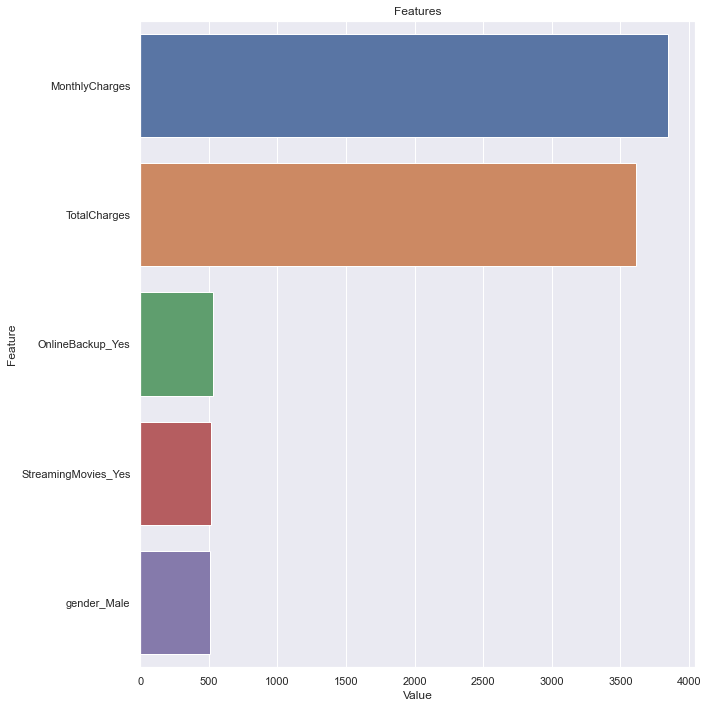

In [302]:
plot_importance(lgbm_final,X,5)

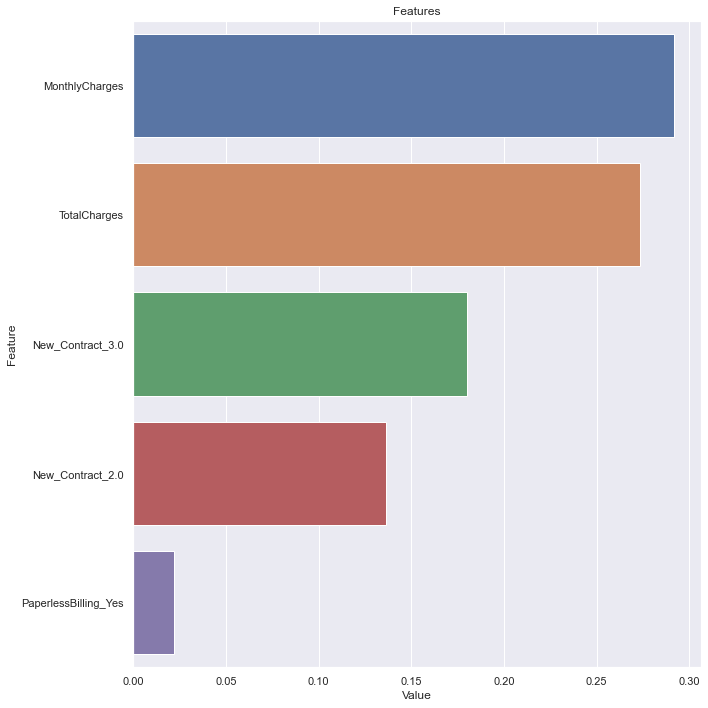

In [303]:
plot_importance(gbm_final,X,5)

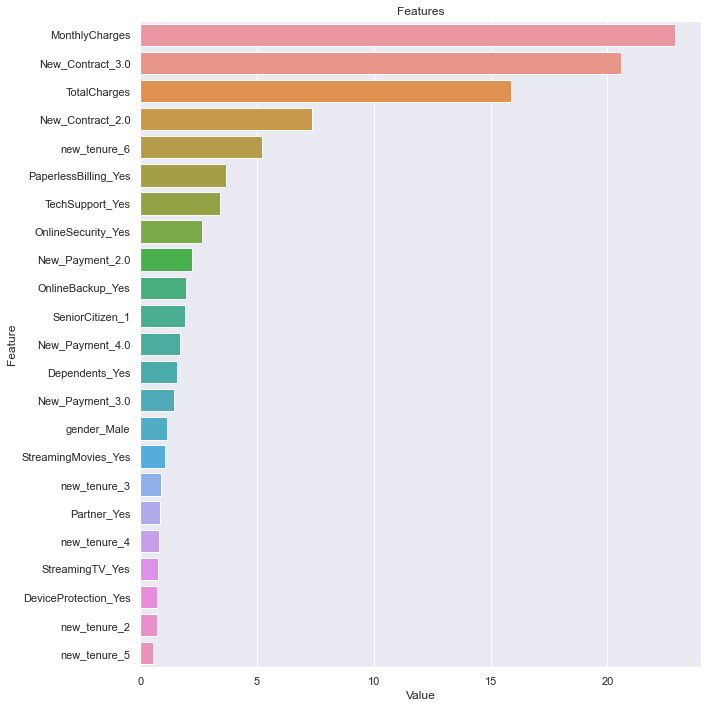

In [306]:
plot_importance(cat_final,X)

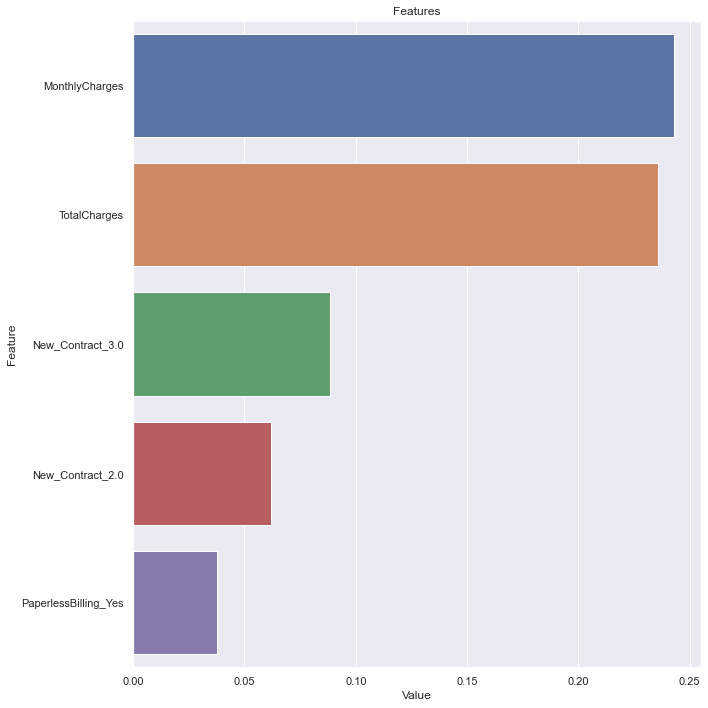

In [305]:
plot_importance(rf_final,X,5)

In [308]:
#değişken seçimi
df_new = df[["MonthlyCharges","TotalCharges","New_Contract_3.0","New_Contract_2.0","new_tenure_6"]]

In [310]:
y = df["Churn"].astype("int")
X = df_new

In [311]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=17)

In [312]:
#rf
rf_model = RandomForestClassifier(random_state=17).fit(X_train,y_train)
rf_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 17,
 'verbose': 0,
 'warm_start': False}

In [313]:
rf_params = {"max_depth": [5, 8, None],
             "max_features": [3, 5, 7, "auto"],
             "min_samples_split": [2, 5, 8, 15, 20],
             "n_estimators": [100, 200, 500]}

In [314]:
rf_best_grid = GridSearchCV(rf_model,rf_params,cv=5,n_jobs=-1).fit(X_train,y_train)

In [315]:
rf_best_grid.best_params_

{'max_depth': 8,
 'max_features': 'auto',
 'min_samples_split': 20,
 'n_estimators': 500}

In [316]:
rf_final = rf_model.set_params(**rf_best_grid.best_params_).fit(X_train,y_train)

In [317]:
cv_results = cross_validate(rf_final,X,y,cv=10,
                           scoring=["accuracy","f1","roc_auc"])

In [318]:
cv_results["test_accuracy"].mean()

0.793267448420374

In [319]:
#gbm
gbm_model = GradientBoostingClassifier(random_state=17).fit(X_train,y_train)
gbm_model.get_params()
gbm_params = {"learning_rate":[0.01,0.1],
             "max_depth":[3,8,10],
             "n_estimators":[100,500,600],
             "subsample":[1,0.5,0.7]}

In [320]:
gbm_best_grid = GridSearchCV(gbm_model,gbm_params,cv=5,n_jobs=-1,verbose=False).fit(X_train,y_train)

In [321]:
gbm_best_grid.best_params_

{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 600, 'subsample': 0.5}

In [322]:
gbm_final = gbm_model.set_params(**gbm_best_grid.best_params_,random_state=17).fit(X_train,y_train)

In [323]:
cv_results = cross_validate(gbm_final,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

In [324]:
cv_results["test_accuracy"].mean()

0.7918475983236621

In [325]:
#lgbm
lgbm_model = LGBMClassifier(random_state=17).fit(X_train,y_train)
lgbm_model.get_params()
lgbm_params = {"learning_rate":[0.01,0.1],
             "n_estimators":[100,500,600],
             "colsample_bytree":[1,0.5,0.7]}

In [326]:
lgbm_best_grid = GridSearchCV(lgbm_model,lgbm_params,cv=5,n_jobs=-1,verbose=True).fit(X_train,y_train)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


In [327]:
lgbm_best_grid.best_params_

{'colsample_bytree': 0.5, 'learning_rate': 0.01, 'n_estimators': 600}

In [328]:
lgbm_final = lgbm_model.set_params(**lgbm_best_grid.best_params_,random_state=17).fit(X_train,y_train)

In [329]:
cv_results = cross_validate(lgbm_final,X,y,cv=10,scoring=["accuracy","f1","roc_auc"])

In [330]:
cv_results["test_accuracy"].mean()

0.7921312862669245

In [331]:
cv_results["test_f1"].mean()

0.542951718459966

In [332]:
#catboost
cat_model = CatBoostClassifier(random_state=17).fit(X_train,y_train)
cat_model.get_params()
cat_params = {'iterations':[200,500],
              "learning_rate":[0.1,0.01],
              "depth":[3,6]}
cat_best_grid = GridSearchCV(cat_model,cat_params,cv=5,n_jobs=-1,verbose=False).fit(X_train,y_train)

Learning rate set to 0.021554
0:	learn: 0.6774325	total: 9.32ms	remaining: 9.31s
1:	learn: 0.6627863	total: 17.7ms	remaining: 8.84s
2:	learn: 0.6491496	total: 26.9ms	remaining: 8.93s
3:	learn: 0.6363742	total: 36.4ms	remaining: 9.06s
4:	learn: 0.6248433	total: 45.4ms	remaining: 9.04s
5:	learn: 0.6146963	total: 55.9ms	remaining: 9.25s
6:	learn: 0.6041555	total: 61.4ms	remaining: 8.7s
7:	learn: 0.5941918	total: 72.3ms	remaining: 8.96s
8:	learn: 0.5848236	total: 78ms	remaining: 8.59s
9:	learn: 0.5760485	total: 87.8ms	remaining: 8.7s
10:	learn: 0.5678623	total: 108ms	remaining: 9.71s
11:	learn: 0.5597207	total: 117ms	remaining: 9.66s
12:	learn: 0.5536314	total: 123ms	remaining: 9.32s
13:	learn: 0.5467614	total: 132ms	remaining: 9.32s
14:	learn: 0.5420053	total: 138ms	remaining: 9.06s
15:	learn: 0.5356957	total: 145ms	remaining: 8.93s
16:	learn: 0.5313662	total: 153ms	remaining: 8.87s
17:	learn: 0.5269964	total: 161ms	remaining: 8.76s
18:	learn: 0.5220600	total: 166ms	remaining: 8.57s
19:	l

164:	learn: 0.4121914	total: 1.24s	remaining: 6.28s
165:	learn: 0.4120926	total: 1.25s	remaining: 6.26s
166:	learn: 0.4120130	total: 1.26s	remaining: 6.27s
167:	learn: 0.4119502	total: 1.26s	remaining: 6.26s
168:	learn: 0.4118672	total: 1.27s	remaining: 6.27s
169:	learn: 0.4118098	total: 1.28s	remaining: 6.26s
170:	learn: 0.4116998	total: 1.29s	remaining: 6.26s
171:	learn: 0.4115715	total: 1.3s	remaining: 6.25s
172:	learn: 0.4115052	total: 1.31s	remaining: 6.26s
173:	learn: 0.4114025	total: 1.32s	remaining: 6.26s
174:	learn: 0.4112680	total: 1.32s	remaining: 6.25s
175:	learn: 0.4111610	total: 1.33s	remaining: 6.24s
176:	learn: 0.4110825	total: 1.34s	remaining: 6.22s
177:	learn: 0.4109475	total: 1.34s	remaining: 6.21s
178:	learn: 0.4108629	total: 1.35s	remaining: 6.21s
179:	learn: 0.4107639	total: 1.36s	remaining: 6.2s
180:	learn: 0.4107057	total: 1.37s	remaining: 6.21s
181:	learn: 0.4106272	total: 1.38s	remaining: 6.19s
182:	learn: 0.4105870	total: 1.39s	remaining: 6.19s
183:	learn: 0.

332:	learn: 0.4016970	total: 2.49s	remaining: 4.98s
333:	learn: 0.4016591	total: 2.5s	remaining: 4.97s
334:	learn: 0.4016267	total: 2.5s	remaining: 4.97s
335:	learn: 0.4015514	total: 2.52s	remaining: 4.98s
336:	learn: 0.4014712	total: 2.53s	remaining: 4.98s
337:	learn: 0.4014049	total: 2.54s	remaining: 4.96s
338:	learn: 0.4013305	total: 2.54s	remaining: 4.96s
339:	learn: 0.4012838	total: 2.55s	remaining: 4.95s
340:	learn: 0.4012363	total: 2.56s	remaining: 4.95s
341:	learn: 0.4011988	total: 2.56s	remaining: 4.93s
342:	learn: 0.4011151	total: 2.58s	remaining: 4.93s
343:	learn: 0.4010359	total: 2.58s	remaining: 4.92s
344:	learn: 0.4009753	total: 2.59s	remaining: 4.92s
345:	learn: 0.4009061	total: 2.6s	remaining: 4.91s
346:	learn: 0.4008317	total: 2.61s	remaining: 4.92s
347:	learn: 0.4008245	total: 2.62s	remaining: 4.9s
348:	learn: 0.4007674	total: 2.63s	remaining: 4.9s
349:	learn: 0.4007458	total: 2.63s	remaining: 4.89s
350:	learn: 0.4007035	total: 2.64s	remaining: 4.88s
351:	learn: 0.400

512:	learn: 0.3903857	total: 3.9s	remaining: 3.71s
513:	learn: 0.3903308	total: 3.91s	remaining: 3.7s
514:	learn: 0.3902478	total: 3.92s	remaining: 3.7s
515:	learn: 0.3901921	total: 3.93s	remaining: 3.69s
516:	learn: 0.3901412	total: 3.95s	remaining: 3.69s
517:	learn: 0.3901219	total: 3.95s	remaining: 3.68s
518:	learn: 0.3900674	total: 3.96s	remaining: 3.67s
519:	learn: 0.3900261	total: 3.97s	remaining: 3.67s
520:	learn: 0.3899655	total: 3.98s	remaining: 3.66s
521:	learn: 0.3898881	total: 3.99s	remaining: 3.65s
522:	learn: 0.3898396	total: 4s	remaining: 3.65s
523:	learn: 0.3898032	total: 4s	remaining: 3.64s
524:	learn: 0.3897310	total: 4.01s	remaining: 3.63s
525:	learn: 0.3896686	total: 4.02s	remaining: 3.62s
526:	learn: 0.3896132	total: 4.03s	remaining: 3.61s
527:	learn: 0.3895594	total: 4.03s	remaining: 3.6s
528:	learn: 0.3894647	total: 4.04s	remaining: 3.6s
529:	learn: 0.3893567	total: 4.04s	remaining: 3.59s
530:	learn: 0.3892775	total: 4.05s	remaining: 3.58s
531:	learn: 0.3892600	t

696:	learn: 0.3784201	total: 5.14s	remaining: 2.24s
697:	learn: 0.3783216	total: 5.15s	remaining: 2.23s
698:	learn: 0.3782249	total: 5.16s	remaining: 2.22s
699:	learn: 0.3781615	total: 5.17s	remaining: 2.21s
700:	learn: 0.3781093	total: 5.17s	remaining: 2.21s
701:	learn: 0.3780416	total: 5.18s	remaining: 2.2s
702:	learn: 0.3779459	total: 5.2s	remaining: 2.2s
703:	learn: 0.3779021	total: 5.21s	remaining: 2.19s
704:	learn: 0.3778220	total: 5.21s	remaining: 2.18s
705:	learn: 0.3777413	total: 5.22s	remaining: 2.17s
706:	learn: 0.3776704	total: 5.22s	remaining: 2.16s
707:	learn: 0.3775937	total: 5.23s	remaining: 2.16s
708:	learn: 0.3775692	total: 5.23s	remaining: 2.15s
709:	learn: 0.3775542	total: 5.24s	remaining: 2.14s
710:	learn: 0.3775240	total: 5.24s	remaining: 2.13s
711:	learn: 0.3774557	total: 5.25s	remaining: 2.12s
712:	learn: 0.3773634	total: 5.26s	remaining: 2.12s
713:	learn: 0.3773152	total: 5.26s	remaining: 2.11s
714:	learn: 0.3772310	total: 5.27s	remaining: 2.1s
715:	learn: 0.37

857:	learn: 0.3685668	total: 6.2s	remaining: 1.03s
858:	learn: 0.3685325	total: 6.21s	remaining: 1.02s
859:	learn: 0.3684584	total: 6.21s	remaining: 1.01s
860:	learn: 0.3684196	total: 6.22s	remaining: 1s
861:	learn: 0.3683074	total: 6.22s	remaining: 996ms
862:	learn: 0.3682394	total: 6.23s	remaining: 989ms
863:	learn: 0.3681736	total: 6.24s	remaining: 982ms
864:	learn: 0.3680792	total: 6.25s	remaining: 975ms
865:	learn: 0.3680481	total: 6.25s	remaining: 967ms
866:	learn: 0.3679542	total: 6.26s	remaining: 961ms
867:	learn: 0.3678726	total: 6.27s	remaining: 953ms
868:	learn: 0.3677961	total: 6.28s	remaining: 946ms
869:	learn: 0.3677554	total: 6.28s	remaining: 939ms
870:	learn: 0.3676904	total: 6.29s	remaining: 931ms
871:	learn: 0.3676637	total: 6.29s	remaining: 924ms
872:	learn: 0.3675820	total: 6.3s	remaining: 916ms
873:	learn: 0.3675125	total: 6.31s	remaining: 910ms
874:	learn: 0.3674417	total: 6.32s	remaining: 902ms
875:	learn: 0.3673715	total: 6.32s	remaining: 895ms
876:	learn: 0.367

27:	learn: 0.5558844	total: 176ms	remaining: 2.96s
28:	learn: 0.5531888	total: 185ms	remaining: 3s
29:	learn: 0.5501959	total: 190ms	remaining: 2.97s
30:	learn: 0.5474078	total: 195ms	remaining: 2.95s
31:	learn: 0.5443347	total: 201ms	remaining: 2.94s
32:	learn: 0.5413827	total: 207ms	remaining: 2.93s
33:	learn: 0.5383515	total: 217ms	remaining: 2.98s
34:	learn: 0.5355205	total: 223ms	remaining: 2.96s
35:	learn: 0.5331315	total: 231ms	remaining: 2.98s
36:	learn: 0.5309940	total: 236ms	remaining: 2.96s
37:	learn: 0.5283017	total: 243ms	remaining: 2.95s
38:	learn: 0.5261712	total: 248ms	remaining: 2.94s
39:	learn: 0.5239125	total: 254ms	remaining: 2.92s
40:	learn: 0.5215306	total: 261ms	remaining: 2.92s
41:	learn: 0.5191469	total: 266ms	remaining: 2.9s
42:	learn: 0.5167529	total: 272ms	remaining: 2.89s
43:	learn: 0.5144659	total: 278ms	remaining: 2.88s
44:	learn: 0.5121677	total: 283ms	remaining: 2.87s
45:	learn: 0.5101860	total: 291ms	remaining: 2.87s
46:	learn: 0.5081035	total: 297ms	r

191:	learn: 0.4231382	total: 1.59s	remaining: 2.54s
192:	learn: 0.4229944	total: 1.59s	remaining: 2.53s
193:	learn: 0.4228618	total: 1.6s	remaining: 2.52s
194:	learn: 0.4227313	total: 1.6s	remaining: 2.51s
195:	learn: 0.4225861	total: 1.61s	remaining: 2.5s
196:	learn: 0.4224337	total: 1.62s	remaining: 2.49s
197:	learn: 0.4222906	total: 1.63s	remaining: 2.48s
198:	learn: 0.4222077	total: 1.63s	remaining: 2.47s
199:	learn: 0.4221331	total: 1.64s	remaining: 2.45s
200:	learn: 0.4219759	total: 1.64s	remaining: 2.44s
201:	learn: 0.4218885	total: 1.65s	remaining: 2.43s
202:	learn: 0.4217359	total: 1.66s	remaining: 2.42s
203:	learn: 0.4216087	total: 1.66s	remaining: 2.41s
204:	learn: 0.4214833	total: 1.67s	remaining: 2.4s
205:	learn: 0.4213554	total: 1.68s	remaining: 2.39s
206:	learn: 0.4212371	total: 1.68s	remaining: 2.38s
207:	learn: 0.4211534	total: 1.69s	remaining: 2.37s
208:	learn: 0.4210310	total: 1.69s	remaining: 2.36s
209:	learn: 0.4209288	total: 1.7s	remaining: 2.35s
210:	learn: 0.420

361:	learn: 0.4115530	total: 2.67s	remaining: 1.02s
362:	learn: 0.4115195	total: 2.67s	remaining: 1.01s
363:	learn: 0.4114648	total: 2.68s	remaining: 1s
364:	learn: 0.4114290	total: 2.69s	remaining: 994ms
365:	learn: 0.4113868	total: 2.7s	remaining: 988ms
366:	learn: 0.4113593	total: 2.7s	remaining: 980ms
367:	learn: 0.4113362	total: 2.71s	remaining: 972ms
368:	learn: 0.4113138	total: 2.71s	remaining: 964ms
369:	learn: 0.4112810	total: 2.72s	remaining: 956ms
370:	learn: 0.4112450	total: 2.73s	remaining: 949ms
371:	learn: 0.4112131	total: 2.73s	remaining: 940ms
372:	learn: 0.4111788	total: 2.74s	remaining: 933ms
373:	learn: 0.4111396	total: 2.75s	remaining: 925ms
374:	learn: 0.4111141	total: 2.75s	remaining: 917ms
375:	learn: 0.4110769	total: 2.76s	remaining: 910ms
376:	learn: 0.4110537	total: 2.76s	remaining: 902ms
377:	learn: 0.4110264	total: 2.77s	remaining: 894ms
378:	learn: 0.4109621	total: 2.78s	remaining: 886ms
379:	learn: 0.4109301	total: 2.78s	remaining: 878ms
380:	learn: 0.410

In [333]:
cat_best_grid.best_params_

{'depth': 6, 'iterations': 500, 'learning_rate': 0.01}

In [334]:
cat_new1 = CatBoostClassifier(random_state=17)
cat_final = cat_new1.set_params(**cat_best_grid.best_params_).fit(X_train,y_train)

0:	learn: 0.6857686	total: 11.7ms	remaining: 5.86s
1:	learn: 0.6786563	total: 18.4ms	remaining: 4.58s
2:	learn: 0.6718153	total: 28.2ms	remaining: 4.67s
3:	learn: 0.6652755	total: 33.8ms	remaining: 4.19s
4:	learn: 0.6590575	total: 41.2ms	remaining: 4.08s
5:	learn: 0.6533613	total: 45.5ms	remaining: 3.74s
6:	learn: 0.6473195	total: 52ms	remaining: 3.66s
7:	learn: 0.6415978	total: 60.1ms	remaining: 3.7s
8:	learn: 0.6358653	total: 66.2ms	remaining: 3.61s
9:	learn: 0.6301135	total: 74.5ms	remaining: 3.65s
10:	learn: 0.6245562	total: 81.7ms	remaining: 3.63s
11:	learn: 0.6191373	total: 91.1ms	remaining: 3.71s
12:	learn: 0.6144063	total: 96.1ms	remaining: 3.6s
13:	learn: 0.6093601	total: 103ms	remaining: 3.56s
14:	learn: 0.6045963	total: 108ms	remaining: 3.5s
15:	learn: 0.5997713	total: 114ms	remaining: 3.44s
16:	learn: 0.5951516	total: 121ms	remaining: 3.43s
17:	learn: 0.5907569	total: 126ms	remaining: 3.38s
18:	learn: 0.5867656	total: 131ms	remaining: 3.33s
19:	learn: 0.5827464	total: 138ms

183:	learn: 0.4241975	total: 1.24s	remaining: 2.13s
184:	learn: 0.4240682	total: 1.25s	remaining: 2.12s
185:	learn: 0.4238851	total: 1.26s	remaining: 2.12s
186:	learn: 0.4237591	total: 1.26s	remaining: 2.11s
187:	learn: 0.4236365	total: 1.27s	remaining: 2.11s
188:	learn: 0.4235403	total: 1.27s	remaining: 2.1s
189:	learn: 0.4234034	total: 1.28s	remaining: 2.09s
190:	learn: 0.4232889	total: 1.29s	remaining: 2.08s
191:	learn: 0.4231382	total: 1.29s	remaining: 2.08s
192:	learn: 0.4229944	total: 1.3s	remaining: 2.07s
193:	learn: 0.4228618	total: 1.31s	remaining: 2.06s
194:	learn: 0.4227313	total: 1.32s	remaining: 2.06s
195:	learn: 0.4225861	total: 1.32s	remaining: 2.05s
196:	learn: 0.4224337	total: 1.33s	remaining: 2.04s
197:	learn: 0.4222906	total: 1.33s	remaining: 2.03s
198:	learn: 0.4222077	total: 1.34s	remaining: 2.02s
199:	learn: 0.4221331	total: 1.34s	remaining: 2.01s
200:	learn: 0.4219759	total: 1.35s	remaining: 2.01s
201:	learn: 0.4218885	total: 1.35s	remaining: 2s
202:	learn: 0.421

346:	learn: 0.4120738	total: 2.28s	remaining: 1.01s
347:	learn: 0.4120354	total: 2.29s	remaining: 1s
348:	learn: 0.4120072	total: 2.3s	remaining: 994ms
349:	learn: 0.4119719	total: 2.3s	remaining: 987ms
350:	learn: 0.4119091	total: 2.31s	remaining: 981ms
351:	learn: 0.4118614	total: 2.31s	remaining: 974ms
352:	learn: 0.4118245	total: 2.32s	remaining: 967ms
353:	learn: 0.4117982	total: 2.33s	remaining: 960ms
354:	learn: 0.4117664	total: 2.34s	remaining: 954ms
355:	learn: 0.4117315	total: 2.34s	remaining: 947ms
356:	learn: 0.4116996	total: 2.35s	remaining: 940ms
357:	learn: 0.4116608	total: 2.35s	remaining: 934ms
358:	learn: 0.4116362	total: 2.36s	remaining: 927ms
359:	learn: 0.4116051	total: 2.37s	remaining: 921ms
360:	learn: 0.4115674	total: 2.37s	remaining: 914ms
361:	learn: 0.4115530	total: 2.38s	remaining: 907ms
362:	learn: 0.4115195	total: 2.38s	remaining: 900ms
363:	learn: 0.4114648	total: 2.39s	remaining: 893ms
364:	learn: 0.4114290	total: 2.4s	remaining: 886ms
365:	learn: 0.4113

In [335]:
cv_results = cross_validate(cat_final,X,y,cv=10,
                           scoring=["accuracy","f1","roc_auc"])

0:	learn: 0.6862190	total: 10.1ms	remaining: 5.04s
1:	learn: 0.6796492	total: 16.8ms	remaining: 4.18s
2:	learn: 0.6730322	total: 27.4ms	remaining: 4.54s
3:	learn: 0.6664618	total: 33.7ms	remaining: 4.18s
4:	learn: 0.6604119	total: 41ms	remaining: 4.05s
5:	learn: 0.6548382	total: 46ms	remaining: 3.79s
6:	learn: 0.6489830	total: 55.2ms	remaining: 3.89s
7:	learn: 0.6432422	total: 61.3ms	remaining: 3.77s
8:	learn: 0.6375408	total: 68ms	remaining: 3.71s
9:	learn: 0.6321396	total: 74.6ms	remaining: 3.66s
10:	learn: 0.6269574	total: 80.4ms	remaining: 3.58s
11:	learn: 0.6216788	total: 86.9ms	remaining: 3.53s
12:	learn: 0.6166866	total: 92.3ms	remaining: 3.46s
13:	learn: 0.6119417	total: 102ms	remaining: 3.55s
14:	learn: 0.6085074	total: 108ms	remaining: 3.48s
15:	learn: 0.6037921	total: 114ms	remaining: 3.45s
16:	learn: 0.5999619	total: 120ms	remaining: 3.41s
17:	learn: 0.5956277	total: 126ms	remaining: 3.36s
18:	learn: 0.5918870	total: 133ms	remaining: 3.38s
19:	learn: 0.5878605	total: 139ms	

173:	learn: 0.4292324	total: 1.23s	remaining: 2.31s
174:	learn: 0.4290941	total: 1.24s	remaining: 2.3s
175:	learn: 0.4289814	total: 1.25s	remaining: 2.29s
176:	learn: 0.4288365	total: 1.25s	remaining: 2.28s
177:	learn: 0.4286526	total: 1.26s	remaining: 2.28s
178:	learn: 0.4284520	total: 1.27s	remaining: 2.27s
179:	learn: 0.4283876	total: 1.27s	remaining: 2.26s
180:	learn: 0.4282154	total: 1.28s	remaining: 2.25s
181:	learn: 0.4280565	total: 1.28s	remaining: 2.24s
182:	learn: 0.4278838	total: 1.29s	remaining: 2.24s
183:	learn: 0.4277033	total: 1.3s	remaining: 2.23s
184:	learn: 0.4275154	total: 1.31s	remaining: 2.23s
185:	learn: 0.4272867	total: 1.31s	remaining: 2.22s
186:	learn: 0.4271340	total: 1.32s	remaining: 2.21s
187:	learn: 0.4269965	total: 1.33s	remaining: 2.2s
188:	learn: 0.4268588	total: 1.33s	remaining: 2.19s
189:	learn: 0.4266830	total: 1.34s	remaining: 2.18s
190:	learn: 0.4265155	total: 1.34s	remaining: 2.17s
191:	learn: 0.4263607	total: 1.35s	remaining: 2.17s
192:	learn: 0.4

356:	learn: 0.4154351	total: 2.46s	remaining: 986ms
357:	learn: 0.4154042	total: 2.47s	remaining: 979ms
358:	learn: 0.4153748	total: 2.48s	remaining: 972ms
359:	learn: 0.4153396	total: 2.48s	remaining: 965ms
360:	learn: 0.4153073	total: 2.49s	remaining: 958ms
361:	learn: 0.4152804	total: 2.5s	remaining: 951ms
362:	learn: 0.4152615	total: 2.5s	remaining: 944ms
363:	learn: 0.4151980	total: 2.51s	remaining: 938ms
364:	learn: 0.4151586	total: 2.52s	remaining: 930ms
365:	learn: 0.4151185	total: 2.52s	remaining: 923ms
366:	learn: 0.4150682	total: 2.53s	remaining: 916ms
367:	learn: 0.4150471	total: 2.53s	remaining: 909ms
368:	learn: 0.4150114	total: 2.54s	remaining: 902ms
369:	learn: 0.4149863	total: 2.55s	remaining: 895ms
370:	learn: 0.4149368	total: 2.56s	remaining: 889ms
371:	learn: 0.4148972	total: 2.56s	remaining: 882ms
372:	learn: 0.4148517	total: 2.57s	remaining: 874ms
373:	learn: 0.4148254	total: 2.57s	remaining: 867ms
374:	learn: 0.4147823	total: 2.58s	remaining: 860ms
375:	learn: 0.

29:	learn: 0.5547500	total: 205ms	remaining: 3.21s
30:	learn: 0.5521112	total: 215ms	remaining: 3.25s
31:	learn: 0.5491484	total: 221ms	remaining: 3.23s
32:	learn: 0.5464074	total: 229ms	remaining: 3.24s
33:	learn: 0.5434622	total: 234ms	remaining: 3.21s
34:	learn: 0.5408411	total: 242ms	remaining: 3.22s
35:	learn: 0.5386699	total: 248ms	remaining: 3.2s
36:	learn: 0.5365950	total: 259ms	remaining: 3.24s
37:	learn: 0.5342451	total: 265ms	remaining: 3.23s
38:	learn: 0.5321546	total: 273ms	remaining: 3.23s
39:	learn: 0.5296533	total: 279ms	remaining: 3.21s
40:	learn: 0.5271049	total: 286ms	remaining: 3.2s
41:	learn: 0.5248118	total: 292ms	remaining: 3.18s
42:	learn: 0.5225429	total: 298ms	remaining: 3.17s
43:	learn: 0.5203762	total: 306ms	remaining: 3.17s
44:	learn: 0.5183881	total: 312ms	remaining: 3.16s
45:	learn: 0.5162155	total: 320ms	remaining: 3.16s
46:	learn: 0.5144090	total: 327ms	remaining: 3.15s
47:	learn: 0.5127646	total: 335ms	remaining: 3.15s
48:	learn: 0.5109434	total: 341ms

194:	learn: 0.4288952	total: 1.44s	remaining: 2.25s
195:	learn: 0.4287509	total: 1.45s	remaining: 2.25s
196:	learn: 0.4286823	total: 1.46s	remaining: 2.24s
197:	learn: 0.4285356	total: 1.47s	remaining: 2.24s
198:	learn: 0.4283847	total: 1.47s	remaining: 2.23s
199:	learn: 0.4282632	total: 1.48s	remaining: 2.22s
200:	learn: 0.4281136	total: 1.49s	remaining: 2.21s
201:	learn: 0.4279752	total: 1.5s	remaining: 2.21s
202:	learn: 0.4278052	total: 1.5s	remaining: 2.2s
203:	learn: 0.4277686	total: 1.51s	remaining: 2.19s
204:	learn: 0.4276434	total: 1.51s	remaining: 2.18s
205:	learn: 0.4275225	total: 1.52s	remaining: 2.17s
206:	learn: 0.4274077	total: 1.53s	remaining: 2.17s
207:	learn: 0.4273165	total: 1.54s	remaining: 2.16s
208:	learn: 0.4272023	total: 1.55s	remaining: 2.15s
209:	learn: 0.4271211	total: 1.55s	remaining: 2.14s
210:	learn: 0.4270314	total: 1.56s	remaining: 2.14s
211:	learn: 0.4269390	total: 1.57s	remaining: 2.13s
212:	learn: 0.4268280	total: 1.57s	remaining: 2.12s
213:	learn: 0.4

356:	learn: 0.4180161	total: 2.67s	remaining: 1.07s
357:	learn: 0.4179745	total: 2.68s	remaining: 1.06s
358:	learn: 0.4179401	total: 2.69s	remaining: 1.06s
359:	learn: 0.4178977	total: 2.7s	remaining: 1.05s
360:	learn: 0.4178522	total: 2.71s	remaining: 1.04s
361:	learn: 0.4178238	total: 2.71s	remaining: 1.03s
362:	learn: 0.4177726	total: 2.72s	remaining: 1.03s
363:	learn: 0.4177369	total: 2.73s	remaining: 1.02s
364:	learn: 0.4176893	total: 2.74s	remaining: 1.01s
365:	learn: 0.4176563	total: 2.75s	remaining: 1s
366:	learn: 0.4176317	total: 2.75s	remaining: 997ms
367:	learn: 0.4176075	total: 2.76s	remaining: 990ms
368:	learn: 0.4175916	total: 2.77s	remaining: 982ms
369:	learn: 0.4175620	total: 2.77s	remaining: 974ms
370:	learn: 0.4175239	total: 2.78s	remaining: 968ms
371:	learn: 0.4174955	total: 2.79s	remaining: 960ms
372:	learn: 0.4174805	total: 2.8s	remaining: 952ms
373:	learn: 0.4174524	total: 2.8s	remaining: 944ms
374:	learn: 0.4174284	total: 2.81s	remaining: 938ms
375:	learn: 0.4173

36:	learn: 0.5364709	total: 267ms	remaining: 3.33s
37:	learn: 0.5340986	total: 276ms	remaining: 3.36s
38:	learn: 0.5320112	total: 287ms	remaining: 3.39s
39:	learn: 0.5298218	total: 294ms	remaining: 3.38s
40:	learn: 0.5272224	total: 306ms	remaining: 3.42s
41:	learn: 0.5248647	total: 311ms	remaining: 3.4s
42:	learn: 0.5226405	total: 322ms	remaining: 3.42s
43:	learn: 0.5203379	total: 328ms	remaining: 3.4s
44:	learn: 0.5183064	total: 338ms	remaining: 3.42s
45:	learn: 0.5159986	total: 344ms	remaining: 3.39s
46:	learn: 0.5141301	total: 352ms	remaining: 3.4s
47:	learn: 0.5123945	total: 358ms	remaining: 3.37s
48:	learn: 0.5106225	total: 368ms	remaining: 3.38s
49:	learn: 0.5089888	total: 374ms	remaining: 3.36s
50:	learn: 0.5070547	total: 383ms	remaining: 3.37s
51:	learn: 0.5054557	total: 389ms	remaining: 3.35s
52:	learn: 0.5034994	total: 397ms	remaining: 3.35s
53:	learn: 0.5019578	total: 405ms	remaining: 3.34s
54:	learn: 0.5002749	total: 412ms	remaining: 3.33s
55:	learn: 0.4987856	total: 416ms	

214:	learn: 0.4237994	total: 1.68s	remaining: 2.23s
215:	learn: 0.4236989	total: 1.68s	remaining: 2.21s
216:	learn: 0.4236225	total: 1.69s	remaining: 2.21s
217:	learn: 0.4235180	total: 1.7s	remaining: 2.2s
218:	learn: 0.4234241	total: 1.7s	remaining: 2.19s
219:	learn: 0.4233237	total: 1.71s	remaining: 2.18s
220:	learn: 0.4232221	total: 1.72s	remaining: 2.17s
221:	learn: 0.4231150	total: 1.73s	remaining: 2.17s
222:	learn: 0.4230577	total: 1.73s	remaining: 2.15s
223:	learn: 0.4229798	total: 1.74s	remaining: 2.15s
224:	learn: 0.4228874	total: 1.75s	remaining: 2.14s
225:	learn: 0.4228059	total: 1.76s	remaining: 2.13s
226:	learn: 0.4227062	total: 1.76s	remaining: 2.12s
227:	learn: 0.4226170	total: 1.77s	remaining: 2.11s
228:	learn: 0.4225255	total: 1.77s	remaining: 2.1s
229:	learn: 0.4224416	total: 1.78s	remaining: 2.09s
230:	learn: 0.4223537	total: 1.79s	remaining: 2.08s
231:	learn: 0.4222637	total: 1.8s	remaining: 2.08s
232:	learn: 0.4221684	total: 1.8s	remaining: 2.07s
233:	learn: 0.4220

373:	learn: 0.4155488	total: 2.73s	remaining: 919ms
374:	learn: 0.4155147	total: 2.73s	remaining: 912ms
375:	learn: 0.4154846	total: 2.74s	remaining: 904ms
376:	learn: 0.4154548	total: 2.75s	remaining: 896ms
377:	learn: 0.4154056	total: 2.75s	remaining: 889ms
378:	learn: 0.4153762	total: 2.76s	remaining: 881ms
379:	learn: 0.4153485	total: 2.77s	remaining: 875ms
380:	learn: 0.4153216	total: 2.77s	remaining: 867ms
381:	learn: 0.4152977	total: 2.78s	remaining: 860ms
382:	learn: 0.4152945	total: 2.79s	remaining: 851ms
383:	learn: 0.4152709	total: 2.79s	remaining: 844ms
384:	learn: 0.4152361	total: 2.8s	remaining: 837ms
385:	learn: 0.4152087	total: 2.81s	remaining: 829ms
386:	learn: 0.4151727	total: 2.81s	remaining: 822ms
387:	learn: 0.4151456	total: 2.82s	remaining: 814ms
388:	learn: 0.4151167	total: 2.83s	remaining: 807ms
389:	learn: 0.4150752	total: 2.83s	remaining: 800ms
390:	learn: 0.4150714	total: 2.84s	remaining: 792ms
391:	learn: 0.4150475	total: 2.85s	remaining: 785ms
392:	learn: 0

50:	learn: 0.5053252	total: 381ms	remaining: 3.35s
51:	learn: 0.5038960	total: 387ms	remaining: 3.33s
52:	learn: 0.5020518	total: 396ms	remaining: 3.34s
53:	learn: 0.5007163	total: 401ms	remaining: 3.31s
54:	learn: 0.4989340	total: 412ms	remaining: 3.34s
55:	learn: 0.4972242	total: 418ms	remaining: 3.31s
56:	learn: 0.4956975	total: 427ms	remaining: 3.32s
57:	learn: 0.4941079	total: 433ms	remaining: 3.3s
58:	learn: 0.4929314	total: 441ms	remaining: 3.29s
59:	learn: 0.4916191	total: 446ms	remaining: 3.27s
60:	learn: 0.4903084	total: 456ms	remaining: 3.29s
61:	learn: 0.4888283	total: 464ms	remaining: 3.28s
62:	learn: 0.4877806	total: 473ms	remaining: 3.28s
63:	learn: 0.4862897	total: 479ms	remaining: 3.26s
64:	learn: 0.4850964	total: 486ms	remaining: 3.25s
65:	learn: 0.4840637	total: 492ms	remaining: 3.23s
66:	learn: 0.4829148	total: 497ms	remaining: 3.21s
67:	learn: 0.4818205	total: 505ms	remaining: 3.21s
68:	learn: 0.4808154	total: 511ms	remaining: 3.19s
69:	learn: 0.4795998	total: 519m

229:	learn: 0.4239768	total: 1.62s	remaining: 1.91s
230:	learn: 0.4238635	total: 1.63s	remaining: 1.9s
231:	learn: 0.4237676	total: 1.64s	remaining: 1.89s
232:	learn: 0.4236710	total: 1.65s	remaining: 1.89s
233:	learn: 0.4235941	total: 1.65s	remaining: 1.88s
234:	learn: 0.4234971	total: 1.66s	remaining: 1.87s
235:	learn: 0.4234035	total: 1.67s	remaining: 1.86s
236:	learn: 0.4233143	total: 1.67s	remaining: 1.85s
237:	learn: 0.4232298	total: 1.68s	remaining: 1.85s
238:	learn: 0.4231585	total: 1.69s	remaining: 1.84s
239:	learn: 0.4230564	total: 1.7s	remaining: 1.84s
240:	learn: 0.4230037	total: 1.7s	remaining: 1.83s
241:	learn: 0.4229078	total: 1.71s	remaining: 1.82s
242:	learn: 0.4228421	total: 1.71s	remaining: 1.81s
243:	learn: 0.4227620	total: 1.72s	remaining: 1.8s
244:	learn: 0.4227048	total: 1.73s	remaining: 1.8s
245:	learn: 0.4226240	total: 1.73s	remaining: 1.79s
246:	learn: 0.4225357	total: 1.74s	remaining: 1.78s
247:	learn: 0.4224440	total: 1.75s	remaining: 1.77s
248:	learn: 0.422

388:	learn: 0.4158116	total: 2.69s	remaining: 769ms
389:	learn: 0.4157847	total: 2.7s	remaining: 762ms
390:	learn: 0.4157549	total: 2.71s	remaining: 755ms
391:	learn: 0.4157232	total: 2.71s	remaining: 748ms
392:	learn: 0.4156878	total: 2.72s	remaining: 741ms
393:	learn: 0.4156804	total: 2.73s	remaining: 734ms
394:	learn: 0.4156708	total: 2.73s	remaining: 727ms
395:	learn: 0.4156353	total: 2.74s	remaining: 720ms
396:	learn: 0.4155977	total: 2.75s	remaining: 713ms
397:	learn: 0.4155971	total: 2.75s	remaining: 705ms
398:	learn: 0.4155647	total: 2.76s	remaining: 699ms
399:	learn: 0.4155323	total: 2.77s	remaining: 691ms
400:	learn: 0.4155218	total: 2.77s	remaining: 684ms
401:	learn: 0.4155033	total: 2.78s	remaining: 677ms
402:	learn: 0.4154702	total: 2.78s	remaining: 670ms
403:	learn: 0.4154337	total: 2.79s	remaining: 663ms
404:	learn: 0.4154027	total: 2.8s	remaining: 656ms
405:	learn: 0.4153660	total: 2.81s	remaining: 649ms
406:	learn: 0.4153324	total: 2.81s	remaining: 642ms
407:	learn: 0.

58:	learn: 0.4946916	total: 391ms	remaining: 2.92s
59:	learn: 0.4930795	total: 398ms	remaining: 2.92s
60:	learn: 0.4915394	total: 408ms	remaining: 2.93s
61:	learn: 0.4903727	total: 413ms	remaining: 2.92s
62:	learn: 0.4891972	total: 422ms	remaining: 2.93s
63:	learn: 0.4877446	total: 429ms	remaining: 2.92s
64:	learn: 0.4865877	total: 439ms	remaining: 2.94s
65:	learn: 0.4852618	total: 444ms	remaining: 2.92s
66:	learn: 0.4838692	total: 452ms	remaining: 2.92s
67:	learn: 0.4827088	total: 459ms	remaining: 2.92s
68:	learn: 0.4813308	total: 467ms	remaining: 2.92s
69:	learn: 0.4800602	total: 472ms	remaining: 2.9s
70:	learn: 0.4789925	total: 479ms	remaining: 2.89s
71:	learn: 0.4779295	total: 486ms	remaining: 2.89s
72:	learn: 0.4767078	total: 492ms	remaining: 2.88s
73:	learn: 0.4756982	total: 500ms	remaining: 2.88s
74:	learn: 0.4747047	total: 506ms	remaining: 2.87s
75:	learn: 0.4737717	total: 514ms	remaining: 2.87s
76:	learn: 0.4727285	total: 521ms	remaining: 2.86s
77:	learn: 0.4717295	total: 528m

234:	learn: 0.4223431	total: 1.64s	remaining: 1.85s
235:	learn: 0.4222585	total: 1.65s	remaining: 1.84s
236:	learn: 0.4221899	total: 1.65s	remaining: 1.84s
237:	learn: 0.4220774	total: 1.66s	remaining: 1.83s
238:	learn: 0.4219880	total: 1.67s	remaining: 1.82s
239:	learn: 0.4219194	total: 1.68s	remaining: 1.82s
240:	learn: 0.4218298	total: 1.68s	remaining: 1.81s
241:	learn: 0.4217695	total: 1.69s	remaining: 1.8s
242:	learn: 0.4216806	total: 1.7s	remaining: 1.79s
243:	learn: 0.4216329	total: 1.71s	remaining: 1.79s
244:	learn: 0.4215566	total: 1.71s	remaining: 1.78s
245:	learn: 0.4214967	total: 1.72s	remaining: 1.77s
246:	learn: 0.4214040	total: 1.72s	remaining: 1.76s
247:	learn: 0.4213402	total: 1.73s	remaining: 1.75s
248:	learn: 0.4212875	total: 1.73s	remaining: 1.75s
249:	learn: 0.4211938	total: 1.74s	remaining: 1.74s
250:	learn: 0.4211250	total: 1.75s	remaining: 1.73s
251:	learn: 0.4210476	total: 1.75s	remaining: 1.72s
252:	learn: 0.4209723	total: 1.76s	remaining: 1.72s
253:	learn: 0.

418:	learn: 0.4142238	total: 2.88s	remaining: 558ms
419:	learn: 0.4141998	total: 2.89s	remaining: 551ms
420:	learn: 0.4141736	total: 2.9s	remaining: 544ms
421:	learn: 0.4141448	total: 2.9s	remaining: 537ms
422:	learn: 0.4141044	total: 2.91s	remaining: 530ms
423:	learn: 0.4140735	total: 2.92s	remaining: 523ms
424:	learn: 0.4140322	total: 2.93s	remaining: 517ms
425:	learn: 0.4140009	total: 2.94s	remaining: 510ms
426:	learn: 0.4139621	total: 2.94s	remaining: 503ms
427:	learn: 0.4139289	total: 2.95s	remaining: 496ms
428:	learn: 0.4139284	total: 2.96s	remaining: 490ms
429:	learn: 0.4138956	total: 2.96s	remaining: 482ms
430:	learn: 0.4138538	total: 2.97s	remaining: 475ms
431:	learn: 0.4138041	total: 2.98s	remaining: 469ms
432:	learn: 0.4137598	total: 2.98s	remaining: 461ms
433:	learn: 0.4137375	total: 2.99s	remaining: 455ms
434:	learn: 0.4136978	total: 3s	remaining: 448ms
435:	learn: 0.4136684	total: 3s	remaining: 441ms
436:	learn: 0.4136343	total: 3.01s	remaining: 434ms
437:	learn: 0.413602

93:	learn: 0.4537672	total: 636ms	remaining: 2.75s
94:	learn: 0.4529871	total: 642ms	remaining: 2.74s
95:	learn: 0.4524153	total: 651ms	remaining: 2.74s
96:	learn: 0.4517763	total: 657ms	remaining: 2.73s
97:	learn: 0.4511557	total: 666ms	remaining: 2.73s
98:	learn: 0.4505671	total: 671ms	remaining: 2.72s
99:	learn: 0.4499236	total: 680ms	remaining: 2.72s
100:	learn: 0.4493408	total: 686ms	remaining: 2.71s
101:	learn: 0.4487260	total: 691ms	remaining: 2.7s
102:	learn: 0.4482415	total: 697ms	remaining: 2.69s
103:	learn: 0.4476699	total: 703ms	remaining: 2.68s
104:	learn: 0.4472791	total: 709ms	remaining: 2.67s
105:	learn: 0.4468058	total: 714ms	remaining: 2.65s
106:	learn: 0.4463093	total: 720ms	remaining: 2.64s
107:	learn: 0.4456709	total: 727ms	remaining: 2.64s
108:	learn: 0.4450741	total: 733ms	remaining: 2.63s
109:	learn: 0.4445701	total: 739ms	remaining: 2.62s
110:	learn: 0.4440911	total: 744ms	remaining: 2.61s
111:	learn: 0.4436485	total: 750ms	remaining: 2.6s
112:	learn: 0.4431253

274:	learn: 0.4154927	total: 1.88s	remaining: 1.53s
275:	learn: 0.4154410	total: 1.88s	remaining: 1.53s
276:	learn: 0.4153955	total: 1.89s	remaining: 1.52s
277:	learn: 0.4153301	total: 1.9s	remaining: 1.51s
278:	learn: 0.4152785	total: 1.9s	remaining: 1.51s
279:	learn: 0.4152149	total: 1.91s	remaining: 1.5s
280:	learn: 0.4152011	total: 1.91s	remaining: 1.49s
281:	learn: 0.4151442	total: 1.92s	remaining: 1.48s
282:	learn: 0.4150885	total: 1.93s	remaining: 1.48s
283:	learn: 0.4150540	total: 1.93s	remaining: 1.47s
284:	learn: 0.4149926	total: 1.94s	remaining: 1.46s
285:	learn: 0.4149276	total: 1.95s	remaining: 1.46s
286:	learn: 0.4148850	total: 1.95s	remaining: 1.45s
287:	learn: 0.4148216	total: 1.96s	remaining: 1.44s
288:	learn: 0.4147755	total: 1.97s	remaining: 1.44s
289:	learn: 0.4147258	total: 1.97s	remaining: 1.43s
290:	learn: 0.4146630	total: 1.98s	remaining: 1.42s
291:	learn: 0.4146512	total: 1.98s	remaining: 1.41s
292:	learn: 0.4145783	total: 1.99s	remaining: 1.41s
293:	learn: 0.4

440:	learn: 0.4095346	total: 2.93s	remaining: 392ms
441:	learn: 0.4094975	total: 2.94s	remaining: 385ms
442:	learn: 0.4094756	total: 2.94s	remaining: 379ms
443:	learn: 0.4094444	total: 2.95s	remaining: 372ms
444:	learn: 0.4094089	total: 2.96s	remaining: 366ms
445:	learn: 0.4094027	total: 2.96s	remaining: 359ms
446:	learn: 0.4093720	total: 2.97s	remaining: 353ms
447:	learn: 0.4093538	total: 2.98s	remaining: 346ms
448:	learn: 0.4093221	total: 2.98s	remaining: 339ms
449:	learn: 0.4092620	total: 2.99s	remaining: 332ms
450:	learn: 0.4092200	total: 3s	remaining: 326ms
451:	learn: 0.4091800	total: 3.01s	remaining: 319ms
452:	learn: 0.4091764	total: 3.01s	remaining: 312ms
453:	learn: 0.4091355	total: 3.02s	remaining: 306ms
454:	learn: 0.4091163	total: 3.02s	remaining: 299ms
455:	learn: 0.4090991	total: 3.03s	remaining: 292ms
456:	learn: 0.4090723	total: 3.04s	remaining: 286ms
457:	learn: 0.4090512	total: 3.04s	remaining: 279ms
458:	learn: 0.4090334	total: 3.05s	remaining: 272ms
459:	learn: 0.4

109:	learn: 0.4477627	total: 732ms	remaining: 2.59s
110:	learn: 0.4475982	total: 735ms	remaining: 2.58s
111:	learn: 0.4472018	total: 744ms	remaining: 2.58s
112:	learn: 0.4467816	total: 750ms	remaining: 2.57s
113:	learn: 0.4461427	total: 760ms	remaining: 2.57s
114:	learn: 0.4457921	total: 766ms	remaining: 2.56s
115:	learn: 0.4453347	total: 774ms	remaining: 2.56s
116:	learn: 0.4448859	total: 780ms	remaining: 2.55s
117:	learn: 0.4443312	total: 788ms	remaining: 2.55s
118:	learn: 0.4439339	total: 794ms	remaining: 2.54s
119:	learn: 0.4434819	total: 799ms	remaining: 2.53s
120:	learn: 0.4429405	total: 809ms	remaining: 2.54s
121:	learn: 0.4425374	total: 815ms	remaining: 2.52s
122:	learn: 0.4421686	total: 823ms	remaining: 2.52s
123:	learn: 0.4417632	total: 828ms	remaining: 2.51s
124:	learn: 0.4413983	total: 835ms	remaining: 2.5s
125:	learn: 0.4410962	total: 841ms	remaining: 2.5s
126:	learn: 0.4406540	total: 846ms	remaining: 2.48s
127:	learn: 0.4404033	total: 855ms	remaining: 2.48s
128:	learn: 0.

286:	learn: 0.4182826	total: 1.95s	remaining: 1.45s
287:	learn: 0.4182295	total: 1.96s	remaining: 1.44s
288:	learn: 0.4181895	total: 1.97s	remaining: 1.44s
289:	learn: 0.4181485	total: 1.98s	remaining: 1.43s
290:	learn: 0.4181064	total: 1.99s	remaining: 1.43s
291:	learn: 0.4180482	total: 1.99s	remaining: 1.42s
292:	learn: 0.4180094	total: 2s	remaining: 1.41s
293:	learn: 0.4179588	total: 2s	remaining: 1.41s
294:	learn: 0.4179007	total: 2.01s	remaining: 1.4s
295:	learn: 0.4178611	total: 2.02s	remaining: 1.39s
296:	learn: 0.4178047	total: 2.02s	remaining: 1.38s
297:	learn: 0.4177597	total: 2.03s	remaining: 1.38s
298:	learn: 0.4176905	total: 2.04s	remaining: 1.37s
299:	learn: 0.4176526	total: 2.04s	remaining: 1.36s
300:	learn: 0.4175948	total: 2.05s	remaining: 1.35s
301:	learn: 0.4175495	total: 2.06s	remaining: 1.35s
302:	learn: 0.4175080	total: 2.06s	remaining: 1.34s
303:	learn: 0.4174702	total: 2.07s	remaining: 1.33s
304:	learn: 0.4174197	total: 2.08s	remaining: 1.33s
305:	learn: 0.41736

446:	learn: 0.4123244	total: 2.99s	remaining: 355ms
447:	learn: 0.4123004	total: 3s	remaining: 349ms
448:	learn: 0.4122680	total: 3.01s	remaining: 342ms
449:	learn: 0.4122294	total: 3.02s	remaining: 335ms
450:	learn: 0.4122037	total: 3.02s	remaining: 328ms
451:	learn: 0.4121646	total: 3.03s	remaining: 322ms
452:	learn: 0.4121220	total: 3.04s	remaining: 315ms
453:	learn: 0.4120973	total: 3.04s	remaining: 309ms
454:	learn: 0.4120627	total: 3.05s	remaining: 302ms
455:	learn: 0.4120433	total: 3.06s	remaining: 295ms
456:	learn: 0.4120106	total: 3.07s	remaining: 289ms
457:	learn: 0.4119769	total: 3.07s	remaining: 282ms
458:	learn: 0.4119528	total: 3.08s	remaining: 275ms
459:	learn: 0.4119245	total: 3.08s	remaining: 268ms
460:	learn: 0.4118825	total: 3.09s	remaining: 262ms
461:	learn: 0.4118749	total: 3.1s	remaining: 255ms
462:	learn: 0.4118443	total: 3.1s	remaining: 248ms
463:	learn: 0.4118152	total: 3.11s	remaining: 241ms
464:	learn: 0.4117852	total: 3.12s	remaining: 235ms
465:	learn: 0.411

113:	learn: 0.4428752	total: 808ms	remaining: 2.73s
114:	learn: 0.4424394	total: 814ms	remaining: 2.72s
115:	learn: 0.4420677	total: 823ms	remaining: 2.73s
116:	learn: 0.4415997	total: 829ms	remaining: 2.71s
117:	learn: 0.4411779	total: 839ms	remaining: 2.71s
118:	learn: 0.4406770	total: 844ms	remaining: 2.7s
119:	learn: 0.4401821	total: 854ms	remaining: 2.7s
120:	learn: 0.4398285	total: 860ms	remaining: 2.69s
121:	learn: 0.4394431	total: 869ms	remaining: 2.69s
122:	learn: 0.4390776	total: 875ms	remaining: 2.68s
123:	learn: 0.4386078	total: 884ms	remaining: 2.68s
124:	learn: 0.4382762	total: 890ms	remaining: 2.67s
125:	learn: 0.4378637	total: 900ms	remaining: 2.67s
126:	learn: 0.4375221	total: 907ms	remaining: 2.66s
127:	learn: 0.4371514	total: 918ms	remaining: 2.67s
128:	learn: 0.4367595	total: 924ms	remaining: 2.66s
129:	learn: 0.4364170	total: 933ms	remaining: 2.66s
130:	learn: 0.4361186	total: 939ms	remaining: 2.65s
131:	learn: 0.4358045	total: 948ms	remaining: 2.64s
132:	learn: 0.

285:	learn: 0.4154705	total: 2.05s	remaining: 1.53s
286:	learn: 0.4154341	total: 2.06s	remaining: 1.53s
287:	learn: 0.4153844	total: 2.06s	remaining: 1.52s
288:	learn: 0.4153156	total: 2.07s	remaining: 1.51s
289:	learn: 0.4152771	total: 2.08s	remaining: 1.51s
290:	learn: 0.4152228	total: 2.09s	remaining: 1.5s
291:	learn: 0.4151657	total: 2.1s	remaining: 1.49s
292:	learn: 0.4151271	total: 2.1s	remaining: 1.49s
293:	learn: 0.4150541	total: 2.11s	remaining: 1.48s
294:	learn: 0.4150030	total: 2.12s	remaining: 1.47s
295:	learn: 0.4149341	total: 2.13s	remaining: 1.47s
296:	learn: 0.4148821	total: 2.13s	remaining: 1.46s
297:	learn: 0.4148244	total: 2.14s	remaining: 1.45s
298:	learn: 0.4147877	total: 2.15s	remaining: 1.44s
299:	learn: 0.4147327	total: 2.15s	remaining: 1.44s
300:	learn: 0.4146936	total: 2.16s	remaining: 1.43s
301:	learn: 0.4146569	total: 2.17s	remaining: 1.42s
302:	learn: 0.4146040	total: 2.17s	remaining: 1.41s
303:	learn: 0.4145848	total: 2.18s	remaining: 1.41s
304:	learn: 0.4

466:	learn: 0.4092517	total: 3.31s	remaining: 234ms
467:	learn: 0.4091917	total: 3.32s	remaining: 227ms
468:	learn: 0.4091744	total: 3.33s	remaining: 220ms
469:	learn: 0.4091498	total: 3.33s	remaining: 213ms
470:	learn: 0.4091156	total: 3.34s	remaining: 206ms
471:	learn: 0.4090967	total: 3.35s	remaining: 199ms
472:	learn: 0.4090767	total: 3.36s	remaining: 192ms
473:	learn: 0.4090282	total: 3.37s	remaining: 185ms
474:	learn: 0.4090155	total: 3.38s	remaining: 178ms
475:	learn: 0.4090004	total: 3.38s	remaining: 171ms
476:	learn: 0.4089771	total: 3.39s	remaining: 164ms
477:	learn: 0.4089442	total: 3.4s	remaining: 156ms
478:	learn: 0.4089018	total: 3.41s	remaining: 149ms
479:	learn: 0.4088785	total: 3.41s	remaining: 142ms
480:	learn: 0.4088587	total: 3.42s	remaining: 135ms
481:	learn: 0.4088384	total: 3.43s	remaining: 128ms
482:	learn: 0.4088169	total: 3.43s	remaining: 121ms
483:	learn: 0.4087958	total: 3.44s	remaining: 114ms
484:	learn: 0.4087725	total: 3.44s	remaining: 107ms
485:	learn: 0

135:	learn: 0.4384445	total: 1.12s	remaining: 2.99s
136:	learn: 0.4380963	total: 1.12s	remaining: 2.98s
137:	learn: 0.4377920	total: 1.16s	remaining: 3.04s
138:	learn: 0.4374995	total: 1.17s	remaining: 3.04s
139:	learn: 0.4371977	total: 1.18s	remaining: 3.04s
140:	learn: 0.4368896	total: 1.19s	remaining: 3.03s
141:	learn: 0.4365934	total: 1.22s	remaining: 3.07s
142:	learn: 0.4363417	total: 1.23s	remaining: 3.08s
143:	learn: 0.4360624	total: 1.24s	remaining: 3.07s
144:	learn: 0.4357780	total: 1.25s	remaining: 3.06s
145:	learn: 0.4355599	total: 1.26s	remaining: 3.05s
146:	learn: 0.4353447	total: 1.26s	remaining: 3.04s
147:	learn: 0.4351127	total: 1.27s	remaining: 3.03s
148:	learn: 0.4348164	total: 1.28s	remaining: 3.02s
149:	learn: 0.4345523	total: 1.29s	remaining: 3.01s
150:	learn: 0.4342843	total: 1.31s	remaining: 3.03s
151:	learn: 0.4340511	total: 1.32s	remaining: 3.02s
152:	learn: 0.4338165	total: 1.33s	remaining: 3.01s
153:	learn: 0.4336303	total: 1.33s	remaining: 2.99s
154:	learn: 

302:	learn: 0.4179278	total: 2.54s	remaining: 1.65s
303:	learn: 0.4178864	total: 2.54s	remaining: 1.64s
304:	learn: 0.4178357	total: 2.55s	remaining: 1.63s
305:	learn: 0.4177849	total: 2.56s	remaining: 1.62s
306:	learn: 0.4177434	total: 2.56s	remaining: 1.61s
307:	learn: 0.4177038	total: 2.57s	remaining: 1.6s
308:	learn: 0.4176498	total: 2.58s	remaining: 1.59s
309:	learn: 0.4176196	total: 2.58s	remaining: 1.58s
310:	learn: 0.4175965	total: 2.59s	remaining: 1.57s
311:	learn: 0.4175732	total: 2.6s	remaining: 1.56s
312:	learn: 0.4175068	total: 2.6s	remaining: 1.55s
313:	learn: 0.4174664	total: 2.61s	remaining: 1.55s
314:	learn: 0.4174206	total: 2.62s	remaining: 1.54s
315:	learn: 0.4173610	total: 2.62s	remaining: 1.53s
316:	learn: 0.4173103	total: 2.63s	remaining: 1.52s
317:	learn: 0.4172826	total: 2.64s	remaining: 1.51s
318:	learn: 0.4172761	total: 2.64s	remaining: 1.5s
319:	learn: 0.4172476	total: 2.65s	remaining: 1.49s
320:	learn: 0.4172014	total: 2.66s	remaining: 1.48s
321:	learn: 0.41

480:	learn: 0.4123223	total: 3.94s	remaining: 156ms
481:	learn: 0.4122927	total: 3.95s	remaining: 148ms
482:	learn: 0.4122740	total: 3.96s	remaining: 139ms
483:	learn: 0.4122432	total: 3.97s	remaining: 131ms
484:	learn: 0.4122201	total: 3.98s	remaining: 123ms
485:	learn: 0.4121853	total: 3.99s	remaining: 115ms
486:	learn: 0.4121571	total: 4s	remaining: 107ms
487:	learn: 0.4121423	total: 4s	remaining: 98.5ms
488:	learn: 0.4121081	total: 4.01s	remaining: 90.3ms
489:	learn: 0.4120931	total: 4.02s	remaining: 82ms
490:	learn: 0.4120728	total: 4.03s	remaining: 73.9ms
491:	learn: 0.4120533	total: 4.04s	remaining: 65.6ms
492:	learn: 0.4120175	total: 4.04s	remaining: 57.4ms
493:	learn: 0.4119696	total: 4.05s	remaining: 49.2ms
494:	learn: 0.4119455	total: 4.06s	remaining: 41ms
495:	learn: 0.4119182	total: 4.07s	remaining: 32.8ms
496:	learn: 0.4118952	total: 4.08s	remaining: 24.6ms
497:	learn: 0.4118837	total: 4.08s	remaining: 16.4ms
498:	learn: 0.4118600	total: 4.09s	remaining: 8.21ms
499:	learn

144:	learn: 0.4358648	total: 1.24s	remaining: 3.05s
145:	learn: 0.4356099	total: 1.25s	remaining: 3.03s
146:	learn: 0.4353588	total: 1.26s	remaining: 3.02s
147:	learn: 0.4350651	total: 1.27s	remaining: 3.01s
148:	learn: 0.4348535	total: 1.27s	remaining: 2.99s
149:	learn: 0.4346213	total: 1.28s	remaining: 2.99s
150:	learn: 0.4343775	total: 1.29s	remaining: 2.98s
151:	learn: 0.4341197	total: 1.3s	remaining: 2.97s
152:	learn: 0.4338574	total: 1.3s	remaining: 2.96s
153:	learn: 0.4335850	total: 1.31s	remaining: 2.96s
154:	learn: 0.4333076	total: 1.32s	remaining: 2.94s
155:	learn: 0.4330633	total: 1.33s	remaining: 2.94s
156:	learn: 0.4328689	total: 1.35s	remaining: 2.94s
157:	learn: 0.4327077	total: 1.35s	remaining: 2.93s
158:	learn: 0.4325648	total: 1.36s	remaining: 2.92s
159:	learn: 0.4324122	total: 1.37s	remaining: 2.91s
160:	learn: 0.4321467	total: 1.38s	remaining: 2.9s
161:	learn: 0.4319831	total: 1.38s	remaining: 2.89s
162:	learn: 0.4317896	total: 1.39s	remaining: 2.88s
163:	learn: 0.4

321:	learn: 0.4179997	total: 2.68s	remaining: 1.48s
322:	learn: 0.4179414	total: 2.69s	remaining: 1.47s
323:	learn: 0.4179014	total: 2.69s	remaining: 1.46s
324:	learn: 0.4178605	total: 2.7s	remaining: 1.45s
325:	learn: 0.4178085	total: 2.71s	remaining: 1.45s
326:	learn: 0.4177769	total: 2.72s	remaining: 1.44s
327:	learn: 0.4177298	total: 2.73s	remaining: 1.43s
328:	learn: 0.4177254	total: 2.73s	remaining: 1.42s
329:	learn: 0.4176914	total: 2.74s	remaining: 1.41s
330:	learn: 0.4176230	total: 2.75s	remaining: 1.4s
331:	learn: 0.4175816	total: 2.76s	remaining: 1.4s
332:	learn: 0.4175492	total: 2.77s	remaining: 1.39s
333:	learn: 0.4175227	total: 2.78s	remaining: 1.38s
334:	learn: 0.4174902	total: 2.79s	remaining: 1.37s
335:	learn: 0.4174572	total: 2.8s	remaining: 1.36s
336:	learn: 0.4174107	total: 2.81s	remaining: 1.36s
337:	learn: 0.4173797	total: 2.82s	remaining: 1.35s
338:	learn: 0.4173321	total: 2.83s	remaining: 1.34s
339:	learn: 0.4172960	total: 2.84s	remaining: 1.34s
340:	learn: 0.41

495:	learn: 0.4129139	total: 4.11s	remaining: 33.2ms
496:	learn: 0.4128882	total: 4.12s	remaining: 24.9ms
497:	learn: 0.4128507	total: 4.13s	remaining: 16.6ms
498:	learn: 0.4127813	total: 4.13s	remaining: 8.29ms
499:	learn: 0.4127314	total: 4.14s	remaining: 0us


In [336]:
cv_results["test_accuracy"].mean()

0.7948281350741457

In [337]:
cv_results["test_f1"].mean()

0.5451141160807798

In [338]:
#Adım 3 özelinde yapmış olduğumuz işlemler sonucunda seçmiş olduğumuz değişkenler ile yeniden model kurduğumuzda başarı
# ciddi manada düşmemiş olup 5 değişken ile tüm değişkenlerin var olduğu durumda elde edilen başarı oranları elde edilmiştir.

In [349]:
#BONUS
#Smote uygulanacak.
#Smote'tan önce veri setindeki sınıf sayısı
y = df["Churn"].astype("int")
X = df.drop(["Churn"], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=17)

y_train.value_counts()

0    4144
1    1490
Name: Churn, dtype: int64

In [350]:
# Smote uygulanması (Eğitim setine uygulanıyor)
!pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X_smote, y_smote = oversample.fit_resample(X_train, y_train)

In [359]:
y_smote.value_counts()

1    4144
0    4144
Name: Churn, dtype: int64

In [361]:
gbm_model1 = GradientBoostingClassifier(random_state=17).fit(X_smote,y_smote)

In [364]:
cv_results = cross_validate(gbm_model1,X_smote,y_smote,cv=10,scoring=["accuracy","f1","roc_auc"])

In [365]:
cv_results["test_accuracy"].mean()

0.815521144735232

In [366]:
#yeni veri setiyle elde edilen sonuç gbm modelinde grid search kullanmadan iyileşme gösterdi. hiperparametre optimizasyonu da yapalım...

In [367]:
gbm_model1.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'deviance',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 17,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [368]:
gbm_params = {"learning_rate":[0.01,0.1],
             "max_depth":[3,8,10],
             "n_estimators":[100,500,600],
             "subsample":[1,0.5,0.7]}

In [371]:
gbm_best_grid = GridSearchCV(gbm_model1,gbm_params,cv=5,n_jobs=-1,verbose=False).fit(X_smote,y_smote)

In [372]:
gbm_best_grid.best_params_

{'learning_rate': 0.01, 'max_depth': 10, 'n_estimators': 600, 'subsample': 0.7}

In [373]:
gbm_final = gbm_model1.set_params(**gbm_best_grid.best_params_,random_state=17).fit(X_smote,y_smote)

In [374]:
cv_results = cross_validate(gbm_final,X_smote,y_smote,cv=10,scoring=["accuracy","f1","roc_auc"])

In [375]:
cv_results["test_accuracy"].mean() , cv_results["test_roc_auc"].mean()

(0.8417035249966492, 0.912967147593384)

In [376]:
#optimizasyon sonrası gbm modeli için iyileşme görülmüştür.